Load Data

In [ ]:
#Load the data
import pandas as pd
train = pd.read_csv("/kaggle/input/widsdatathon2024-challenge1/training.csv")
test = pd.read_csv("/kaggle/input/widsdatathon2024-challenge1/test.csv")
sample_submission = pd.read_csv("/kaggle/input/widsdatathon2024-challenge1/sample_submission.csv")


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/input/widsdatathon2024-challenge1/training.csv'

Data Preprocessing

In [ ]:
!pip install nltk
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
# NLP pipeline for description preprocessing

import pandas as pd
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

df = pd.read_csv('test.csv')
dataf=df.copy()

# mapping dictionary for specific replacements
correction_dict = {
    'Malig': 'Malignant',
    'neoplm': 'neoplasm',
    'unsp': 'unspecified',
    'ovrlp': 'overlap'
}

# Text Cleaning
def clean_text(text):
    # Spell correction for whole words only
    words = text.split()
    corrected_words = [correction_dict.get(word, word) for word in words]
    text = ' '.join(corrected_words)

    # Remove unnecessary characters, symbols, or special characters
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Convert the text to lowercase
    text = text.lower()
    return text

dataf['cleaned_text'] = dataf['breast_cancer_diagnosis_desc'].apply(clean_text)

# Tokenization
def tokenize_text(text):
    return word_tokenize(text)

dataf['tokenized_text'] = dataf['cleaned_text'].apply(tokenize_text)

# Stopword Removal
stop_words = set(stopwords.words('english'))

def remove_stopwords(tokens):
    return [word for word in tokens if word not in stop_words]

dataf['filtered_tokens'] = dataf['tokenized_text'].apply(remove_stopwords)

# Lemmatization
lemmatizer = WordNetLemmatizer()

def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(word) for word in tokens]

dataf['lemmatized_tokens'] = dataf['filtered_tokens'].apply(lemmatize_tokens)
# Save the processed text in a new column
dataf['processed_text'] = dataf['lemmatized_tokens'].apply(lambda x: ' '.join(x))

# Define the words to remove
words_to_remove = ['malignant', 'neoplasm', 'site', 'breast', 'female']

# Create a new column with the specified words removed
dataf['imp_desc'] = dataf['processed_text'].replace('|'.join(words_to_remove), '', regex=True).replace('\s+', ' ', regex=True)

# Remove rows with empty strings in 'imp_desc'
dataf = dataf[dataf['imp_desc'].str.strip() != '']

# Function to remove repeated words in a block and maintain order
def remove_repeated_words(text):
    words = text.split()
    unique_words = []

    for word in words:
        if word not in unique_words:
            unique_words.append(word)

    return ' '.join(unique_words)

# Apply the function to the 'imp_desc' column
dataf['affected_site'] = dataf['imp_desc'].apply(remove_repeated_words)
df['processed_text'] = dataf['processed_text']
df['affected_site'] = dataf['affected_site']
# DataFrame with the new column
print(dataf[['breast_cancer_diagnosis_desc', 'affected_site']])


                           breast_cancer_diagnosis_desc  \
0     Malig neoplasm of upper-outer quadrant of left...   
1     Malignant neoplasm of unspecified site of left...   
2     Malignant neoplasm of unsp site of right femal...   
3     Malignant neoplasm of unspecified site of left...   
4     Malig neoplasm of upper-outer quadrant of left...   
...                                                 ...   
5787  Malig neoplm of upper-outer quadrant of right ...   
5788  Malignant neoplasm of unspecified site of left...   
5789  Malig neoplm of upper-outer quadrant of right ...   
5790  Malignant neoplasm of breast (female), unspeci...   
5791  Malignant neoplasm of central portion of right...   

                  affected_site  
0      upperouter quadrant left  
1              unspecified left  
2             unspecified right  
3              unspecified left  
4      upperouter quadrant left  
...                         ...  
5787  upperouter quadrant right  
5788           unsp

In [ ]:
# encoding affected site

# Fill missing values
df['affected_site'].fillna('unspecified', inplace=True)

# column for frequency encoding
dfc = df['affected_site']

frequency_encoding = dfc.value_counts(normalize=True).to_dict()

df_encoded = dfc.map(frequency_encoding)

df['affected_site'] = df_encoded

print(df)

      patient_id patient_race          payer_type patient_state  patient_zip3  \
0         573710        White            MEDICAID            IN           467   
1         593679          NaN          COMMERCIAL            FL           337   
2         184532     Hispanic            MEDICAID            CA           917   
3         447383     Hispanic  MEDICARE ADVANTAGE            CA           917   
4         687972        Black                 NaN            CA           900   
...          ...          ...                 ...           ...           ...   
5787      977076        White                 NaN            KY           404   
5788      922960        White                 NaN            IA           507   
5789      759690          NaN  MEDICARE ADVANTAGE            WA           980   
5790      911717          NaN          COMMERCIAL            OK           740   
5791      327597     Hispanic  MEDICARE ADVANTAGE            NY           114   

      patient_age patient_g

In [ ]:
# Patient_race null value filling

import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Feature Selection
numerical_features = [
    'race_white', 'race_black', 'race_asian', 'race_native',
    'race_pacific', 'race_other', 'race_multiple', 'hispanic', 'patient_zip3'
]

categorical_feature = 'patient_race'


#DataFrame with rows containing null 'patient_race'
df_predict = df[df[categorical_feature].isnull()]

# Droping rows where the target variable has null values
training_data = df.dropna(subset=[categorical_feature] + numerical_features)

if not df_predict.empty:
    X = training_data[numerical_features]
    y = training_data[categorical_feature]

    model = RandomForestClassifier(random_state=42)

    model.fit(X, y)

    # Code to find accuracy
    # X_train, X_test, y_train, y_test = train_test_split(training_data[numerical_features], training_data[categorical_feature], test_size=0.2, shuffle=True)
    # model = RandomForestClassifier(random_state=42)
    # model.fit(X_train, y_train)
    # y_pred = model.predict(X_test)
    # accuracy = accuracy_score(y_test, y_pred)
    # print(f"Accuracy: {accuracy}")


# Prediction
    print("Before Prediction:")
    print("Total nulls: ", df['patient_race'].isnull().sum())
    print("count")
    print(df['patient_race'].value_counts())

    # 'patient_race_filled' has the predicted values
    df['patient_race_filled'] = df['patient_race']

    # Replacing null values in 'patient_race_filled' with the predicted values
    df.loc[df_predict.index, 'patient_race_filled'] = model.predict(df_predict[numerical_features])

    print("\nAfter Prediction:")
    print("Total nulls: ", df['patient_race_filled'].isnull().sum())
    print("count")
    print(df['patient_race_filled'].value_counts())



Before Prediction:
Total nulls:  2901
count
White       1606
Black        510
Hispanic     347
Other        273
Asian        155
Name: patient_race, dtype: int64

After Prediction:
Total nulls:  0
count
White       3795
Black        835
Hispanic     579
Other        389
Asian        194
Name: patient_race_filled, dtype: int64


In [ ]:
#patient race encoding
import pandas as pd

# column for one-hot encoding
dfc = df[['patient_race_filled']]

# Performing one-hot encoding
df_encoded = pd.get_dummies(dfc, columns=['patient_race_filled'], prefix=['race'])

# Merging data
data_encoded = pd.concat([df, df_encoded], axis=1)
df = data_encoded
print(data_encoded)


      patient_id patient_race          payer_type patient_state  patient_zip3  \
0         573710        White            MEDICAID            IN           467   
1         593679          NaN          COMMERCIAL            FL           337   
2         184532     Hispanic            MEDICAID            CA           917   
3         447383     Hispanic  MEDICARE ADVANTAGE            CA           917   
4         687972        Black                 NaN            CA           900   
...          ...          ...                 ...           ...           ...   
5787      977076        White                 NaN            KY           404   
5788      922960        White                 NaN            IA           507   
5789      759690          NaN  MEDICARE ADVANTAGE            WA           980   
5790      911717          NaN          COMMERCIAL            OK           740   
5791      327597     Hispanic  MEDICARE ADVANTAGE            NY           114   

      patient_age patient_g

In [ ]:
# payer type encoding
import pandas as pd

#column for one-hot encoding
dfc = df[['payer_type']]

# Performing one-hot encoding
df_encoded = pd.get_dummies(dfc, columns=['payer_type'], prefix=['payer'])

# Merging data
data_encoded = pd.concat([df, df_encoded], axis=1)
df = data_encoded
print(data_encoded)


      patient_id patient_race          payer_type patient_state  patient_zip3  \
0         573710        White            MEDICAID            IN           467   
1         593679          NaN          COMMERCIAL            FL           337   
2         184532     Hispanic            MEDICAID            CA           917   
3         447383     Hispanic  MEDICARE ADVANTAGE            CA           917   
4         687972        Black                 NaN            CA           900   
...          ...          ...                 ...           ...           ...   
5787      977076        White                 NaN            KY           404   
5788      922960        White                 NaN            IA           507   
5789      759690          NaN  MEDICARE ADVANTAGE            WA           980   
5790      911717          NaN          COMMERCIAL            OK           740   
5791      327597     Hispanic  MEDICARE ADVANTAGE            NY           114   

      patient_age patient_g

In [ ]:
# gender encoding

from sklearn.preprocessing import LabelEncoder
import pandas as pd


# column for one-hot encoding
dfc = df[['patient_gender']]

# Performing one-hot encoding
df_encoded = pd.get_dummies(dfc, columns=['patient_gender'], prefix=['patient'])

# Merging the data
data_encoded = pd.concat([df, df_encoded], axis=1)
df = data_encoded
print(data_encoded)


      patient_id patient_race          payer_type patient_state  patient_zip3  \
0         573710        White            MEDICAID            IN           467   
1         593679          NaN          COMMERCIAL            FL           337   
2         184532     Hispanic            MEDICAID            CA           917   
3         447383     Hispanic  MEDICARE ADVANTAGE            CA           917   
4         687972        Black                 NaN            CA           900   
...          ...          ...                 ...           ...           ...   
5787      977076        White                 NaN            KY           404   
5788      922960        White                 NaN            IA           507   
5789      759690          NaN  MEDICARE ADVANTAGE            WA           980   
5790      911717          NaN          COMMERCIAL            OK           740   
5791      327597     Hispanic  MEDICARE ADVANTAGE            NY           114   

      patient_age patient_g

In [ ]:
# encoding breast_cancer_diagnosis_code

import pandas as pd

# Convert 'breast_cancer_diagnosis_code' to string type
df['breast_cancer_diagnosis_code'] = df['breast_cancer_diagnosis_code'].astype(str)

# Remove 'c' and 'C' from 'breast_cancer_diagnosis_code' column
df['breast_cancer_diagnosis_code'] = df['breast_cancer_diagnosis_code'].str.replace('[cC]', '', regex=True)

# Filling missing values
df['breast_cancer_diagnosis_code'].fillna('0', inplace=True)

# column for frequency encoding
dfc = df['breast_cancer_diagnosis_code']

# Frequency encoding
frequency_encoding = dfc.value_counts(normalize=True).to_dict()
df_encoded = dfc.map(frequency_encoding)

df['breast_cancer_diagnosis_code_encoded'] = df_encoded
print(df)


      patient_id patient_race          payer_type patient_state  patient_zip3  \
0         573710        White            MEDICAID            IN           467   
1         593679          NaN          COMMERCIAL            FL           337   
2         184532     Hispanic            MEDICAID            CA           917   
3         447383     Hispanic  MEDICARE ADVANTAGE            CA           917   
4         687972        Black                 NaN            CA           900   
...          ...          ...                 ...           ...           ...   
5787      977076        White                 NaN            KY           404   
5788      922960        White                 NaN            IA           507   
5789      759690          NaN  MEDICARE ADVANTAGE            WA           980   
5790      911717          NaN          COMMERCIAL            OK           740   
5791      327597     Hispanic  MEDICARE ADVANTAGE            NY           114   

      patient_age patient_g

In [ ]:
# encoding metastatic_cancer_diagnosis_code_encoded

import pandas as pd

# Convert 'breast_cancer_diagnosis_code' to string type
df['metastatic_cancer_diagnosis_code'] = df['metastatic_cancer_diagnosis_code'].astype(str)

# Remove 'c' and 'C' from 'breast_cancer_diagnosis_code' column
df['metastatic_cancer_diagnosis_code'] = df['metastatic_cancer_diagnosis_code'].str.replace('[cC]', '', regex=True)

# Fill missing values
df['metastatic_cancer_diagnosis_code'].fillna('0', inplace=True)

# column for frequency encoding
dfc = df['metastatic_cancer_diagnosis_code']

frequency_encoding = dfc.value_counts(normalize=True).to_dict()

df_encoded = dfc.map(frequency_encoding)

df['metastatic_cancer_diagnosis_code_encoded'] = df_encoded
print(df)


      patient_id patient_race          payer_type patient_state  patient_zip3  \
0         573710        White            MEDICAID            IN           467   
1         593679          NaN          COMMERCIAL            FL           337   
2         184532     Hispanic            MEDICAID            CA           917   
3         447383     Hispanic  MEDICARE ADVANTAGE            CA           917   
4         687972        Black                 NaN            CA           900   
...          ...          ...                 ...           ...           ...   
5787      977076        White                 NaN            KY           404   
5788      922960        White                 NaN            IA           507   
5789      759690          NaN  MEDICARE ADVANTAGE            WA           980   
5790      911717          NaN          COMMERCIAL            OK           740   
5791      327597     Hispanic  MEDICARE ADVANTAGE            NY           114   

      patient_age patient_g

<ipython-input-23-791a4f77fdac>:11: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


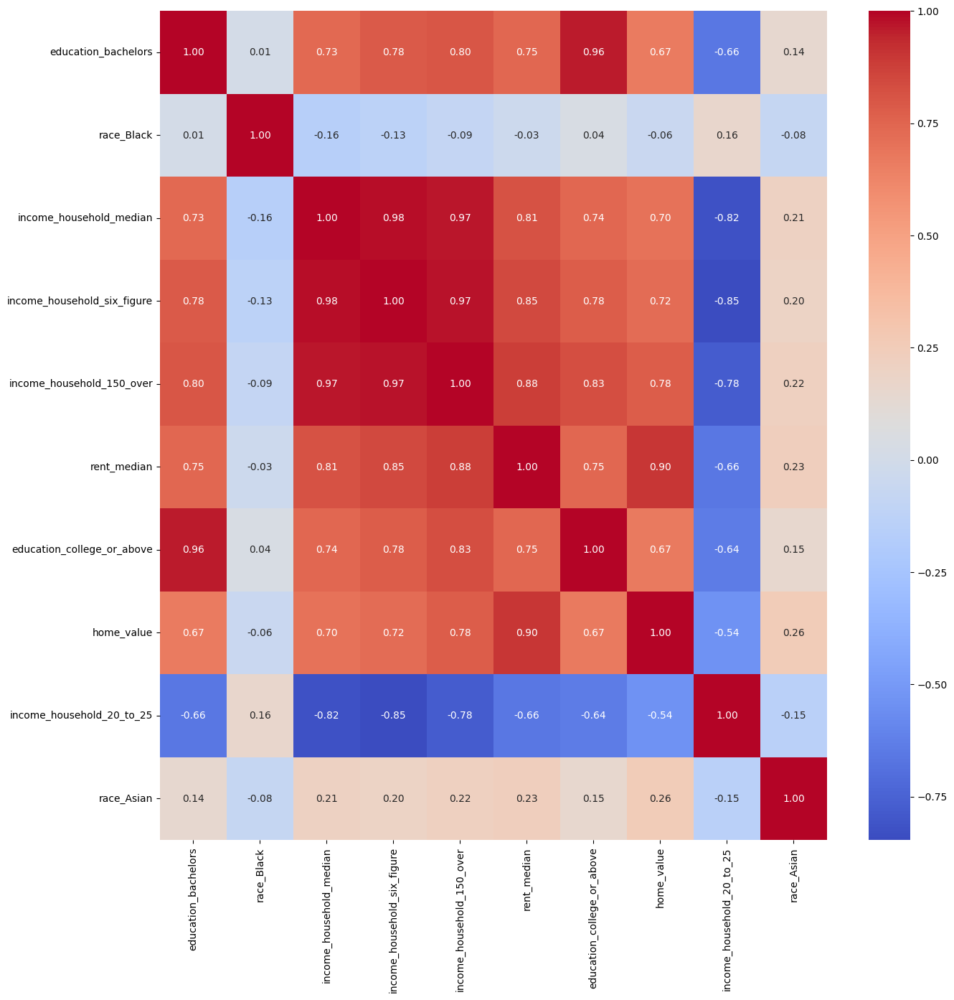

4015
Top Col:  Index(['education_bachelors', 'race_Black', 'income_household_median',
       'income_household_six_figure', 'income_household_150_over',
       'rent_median', 'education_college_or_above', 'home_value',
       'income_household_20_to_25', 'race_Asian'],
      dtype='object')


<ipython-input-23-791a4f77fdac>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = X[col].astype(float)


        bmi  bmi_filled
0       NaN   30.547027
1       NaN   29.409321
2       NaN   28.058143
3       NaN   28.058143
4     23.00         NaN
...     ...         ...
5787  29.60         NaN
5788    NaN   29.596155
5789  28.28         NaN
5790    NaN   29.686727
5791    NaN   27.684553

[5792 rows x 2 columns]


In [ ]:
# bmi filling
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

correlation_matrix = df.corr()

# Get the top 10 columns with the highest absolute correlation with 'bmi'
top_columns = correlation_matrix['bmi'].abs().sort_values(ascending=False).head(11).index[1:]

# Plot the heatmap for the top 10 columns
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix[top_columns].loc[top_columns], annot=True, cmap='coolwarm', fmt='.2f')
plt.show()

print(df['bmi'].isnull().sum())

print("Top Col: ", top_columns)

X = df[top_columns]
y = df['bmi']

# Identify rows with missing 'bmi' values
missing_bmi_mask = y.isnull()

# Separate the dataframe into features (X_train) and target (y_train) for non-missing values
X_train, y_train = X[~missing_bmi_mask], y[~missing_bmi_mask]

# Identify numerical columns and set their data types explicitly
numerical_cols = [col for col in X.columns if np.issubdtype(X[col].dtype, np.number)]


# Convert numerical columns to float
for col in numerical_cols:
    try:
        X[col] = X[col].astype(float)
    except ValueError:
        X[col] = pd.to_numeric(X[col], errors='coerce')
        X[col] = X[col].astype(float)


# Create transformers for numerical columns
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # You can choose another strategy
])

# Use ColumnTransformer to apply the numerical transformer to the numerical columns
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
    ])

# Build the model pipeline
model = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', RandomForestRegressor())])

# Train the model on the rows where 'bmi' is not missing
model.fit(X_train, y_train)

# Predict missing 'bmi' values in the entire dataset
predicted_bmi = model.predict(X[missing_bmi_mask])

# Fill missing 'bmi' values with predictions
df.loc[missing_bmi_mask, 'bmi_filled'] = predicted_bmi

# Print the original 'bmi' and the new 'bmi_filled' columns
print(df[['bmi', 'bmi_filled']])

# Create a new column 'merged_bmi' with the merged output of 'bmi' and 'bmi_filled'
df['merged_bmi'] = df.apply(lambda row: row['bmi_filled'] if pd.notnull(row['bmi_filled']) else row['bmi'], axis=1)



In [ ]:
# patient_income column prediction

import pandas as pd


df['patient_income'] = (
    (df['income_household_under_5'] / 100) * 2500 +
    (df['income_household_5_to_10'] / 100) * 7500 +
    (df['income_household_10_to_15'] / 100) * 12500 +
    (df['income_household_15_to_20'] / 100) * 17500 +
    (df['income_household_20_to_25'] / 100) * 22500 +
    (df['income_household_25_to_35'] / 100) * 30000 +
    (df['income_household_35_to_50'] / 100) * 42500 +
    (df['income_household_50_to_75'] / 100) * 62500 +
    (df['income_household_75_to_100'] / 100) * 87500 +
    (df['income_household_100_to_150'] / 100) * 125000 +
    (df['income_household_150_over'] / 100) * 175000 +
    df['income_individual_median'] +
    df['income_household_median']
)
df['patient_income'] = df['patient_income'].fillna(0)

df['patient_income'] = df['patient_income'].astype(int)

print(df[['patient_income']])


      patient_income
0             172176
1             176069
2             213250
3             213250
4             183405
...              ...
5787          128143
5788          142806
5789          288685
5790          152502
5791          208761

[5792 rows x 1 columns]


In [ ]:
# Filling null vlaues of some column with mode
import pandas as pd

# Find columns with null values
columns_with_null = df.columns[df.isnull().any()].tolist()

# Replace null values in each column with its mode
for column in columns_with_null:
    mode_value = df[column].mode()[0]
    df[column] = df[column].fillna(mode_value)
print("Null values filled")

Null values filled


In [ ]:
# Rounding values in all numeric columns to 2 decimal places
import pandas as pd

df_rounded = df.round(2)
df = df_rounded
print(df_rounded)


      patient_id patient_race          payer_type patient_state  patient_zip3  \
0         573710        White            MEDICAID            IN           467   
1         593679        White          COMMERCIAL            FL           337   
2         184532     Hispanic            MEDICAID            CA           917   
3         447383     Hispanic  MEDICARE ADVANTAGE            CA           917   
4         687972        Black          COMMERCIAL            CA           900   
...          ...          ...                 ...           ...           ...   
5787      977076        White          COMMERCIAL            KY           404   
5788      922960        White          COMMERCIAL            IA           507   
5789      759690        White  MEDICARE ADVANTAGE            WA           980   
5790      911717        White          COMMERCIAL            OK           740   
5791      327597     Hispanic  MEDICARE ADVANTAGE            NY           114   

      patient_age patient_g

In [ ]:
# drop columns which are not required

# 'columns_to_drop' is a list of column names to drop
columns_to_drop = ['patient_race','payer_type', 'patient_state', 'patient_gender','bmi','breast_cancer_diagnosis_code','breast_cancer_diagnosis_desc',
                   'metastatic_cancer_diagnosis_code','metastatic_first_novel_treatment','metastatic_first_novel_treatment_type',
                   'Region','Division','limited_english','processed_text','patient_race_filled','bmi_filled']

# Drop the specified columns
df = df.drop(columns=columns_to_drop)
df.to_csv('test_final1.csv', index=False)
null_values = df.isnull().sum()
print("Null values in each column:")
print(null_values)


Null values in each column:
patient_id                                  0
patient_zip3                                0
patient_age                                 0
population                                  0
density                                     0
                                           ..
patient_F                                   0
breast_cancer_diagnosis_code_encoded        0
metastatic_cancer_diagnosis_code_encoded    0
merged_bmi                                  0
patient_income                              0
Length: 83, dtype: int64


EDA & Feature Engineering

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4801 entries, 0 to 4800
Data columns (total 83 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   patient_id                             4801 non-null   int64  
 1   patient_race                           2459 non-null   object 
 2   payer_type                             4117 non-null   object 
 3   patient_state                          4784 non-null   object 
 4   patient_zip3                           4801 non-null   int64  
 5   patient_age                            4801 non-null   int64  
 6   patient_gender                         4801 non-null   object 
 7   bmi                                    1472 non-null   float64
 8   breast_cancer_diagnosis_code           4801 non-null   object 
 9   breast_cancer_diagnosis_desc           4801 non-null   object 
 10  metastatic_cancer_diagnosis_code       4801 non-null   object 
 11  meta

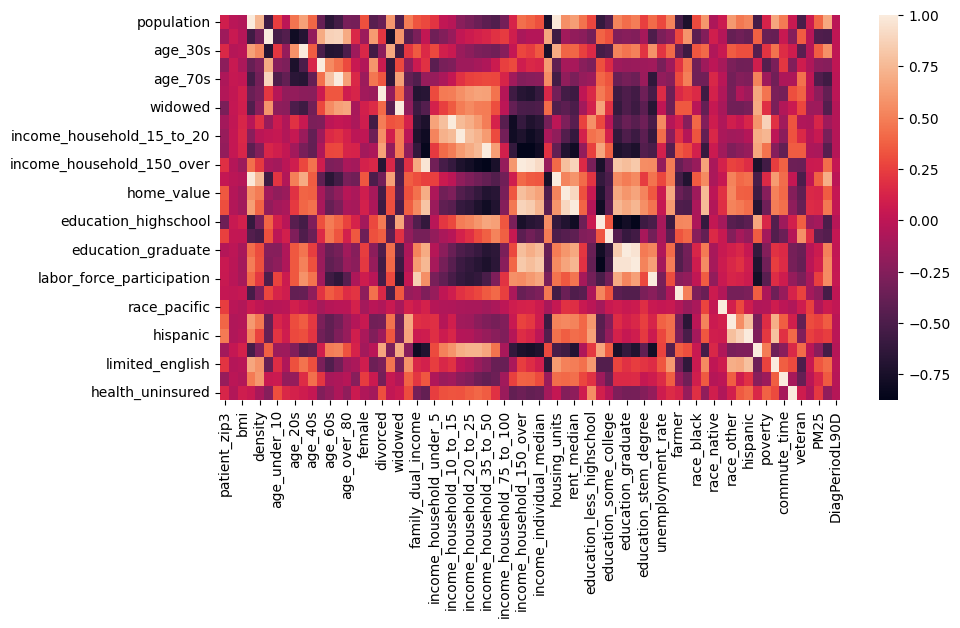

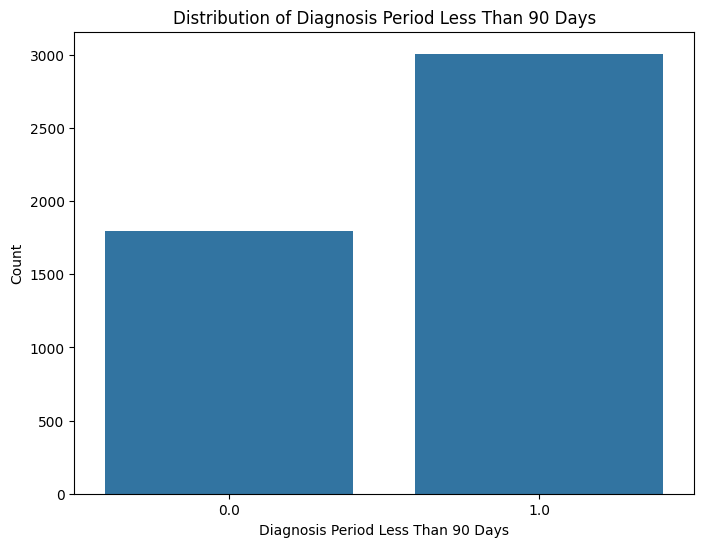

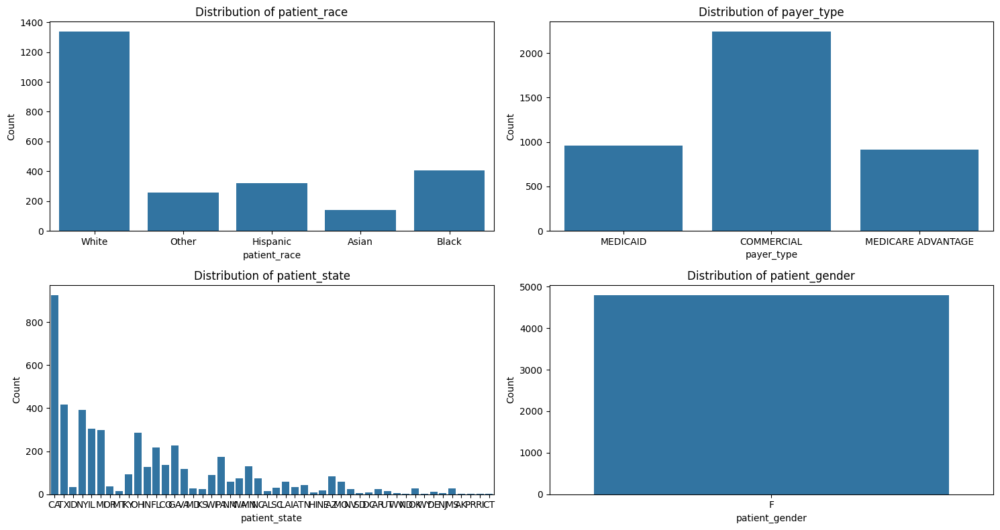

<ipython-input-5-a4fa9bb6e0c7>:63: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = train_data.corr()


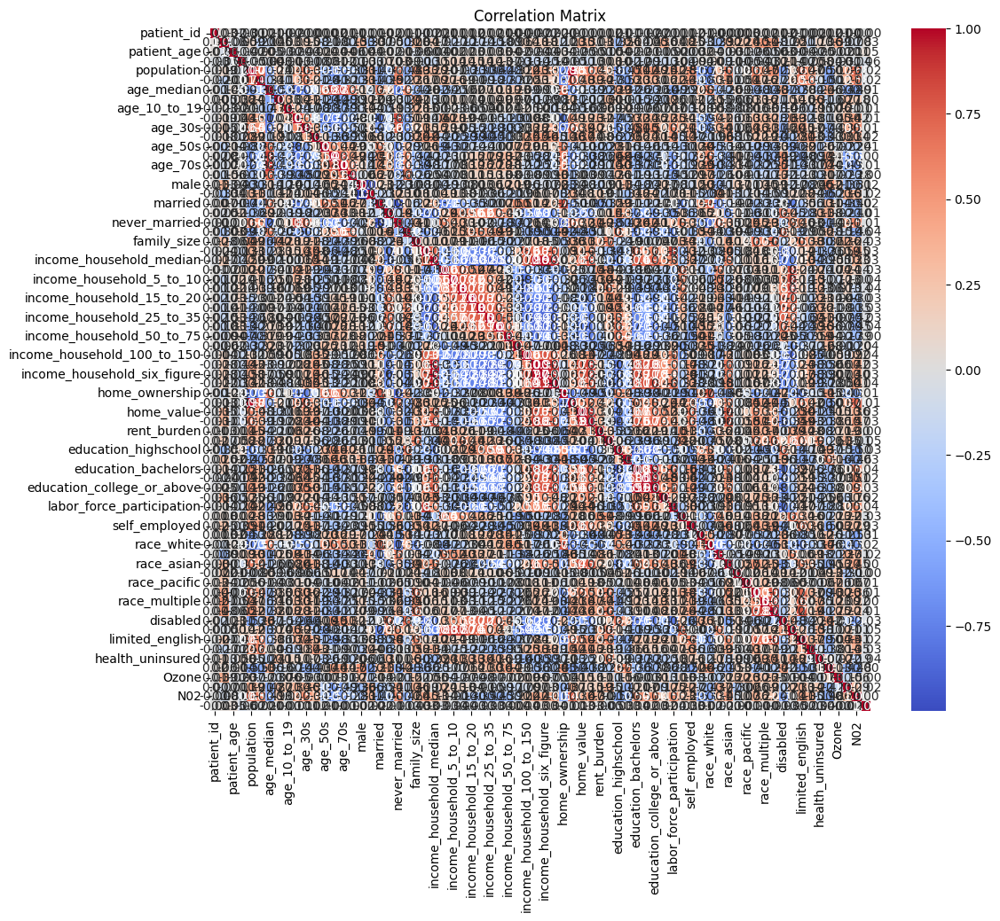

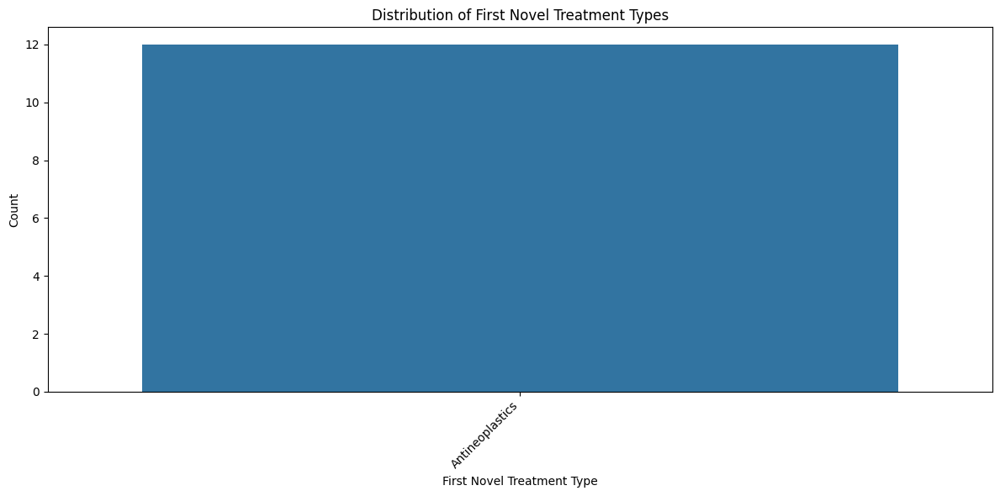

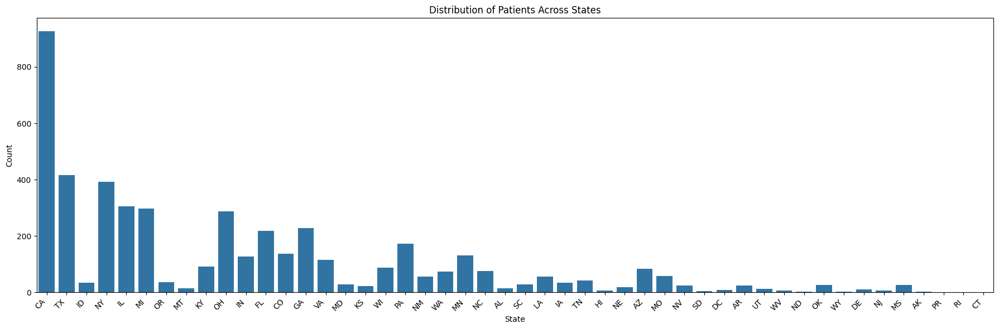

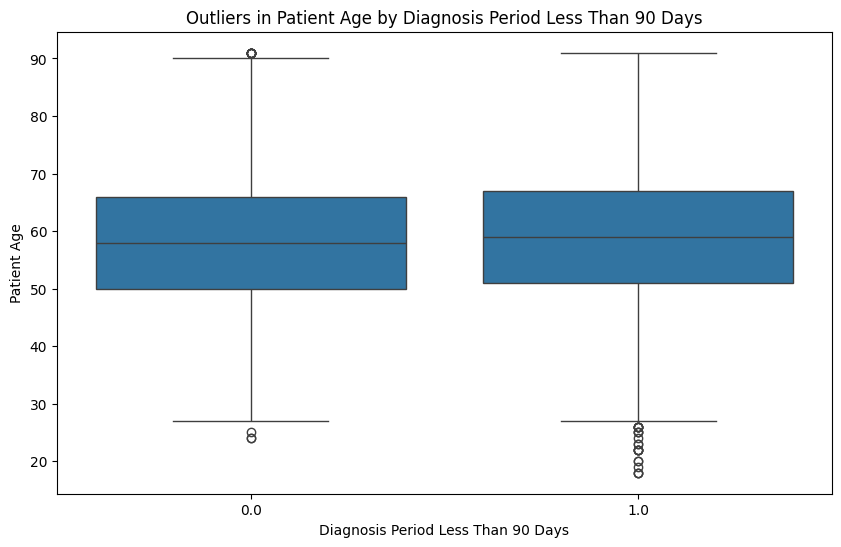

In [ ]:
# Import Libraries

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the un preprocessed Data
train_data = pd.read_csv('training.csv')

# Display basic information about the dataset
print(train_data.info())

# Summary Statistics
print(train_data.describe())

# Check Missing Values
print(train_data.isnull().sum())


corr_df = train_data.drop(['patient_id'],axis=1).select_dtypes(exclude='object').corr()

# only looking at correlations showing a coefficient higher than 0.01
corr_df = corr_df[abs(corr_df)>0.005].dropna(how='any',axis=0)
corr_df = corr_df[abs(corr_df)>0.005].dropna(how='any',axis=1)

plt.figure(figsize=(10,5))
mask = np.triu(np.ones_like(corr_df, dtype=bool))
sns.heatmap(corr_df)

# Distribution of Target Variable
plt.figure(figsize=(8, 6))
sns.countplot(x='DiagPeriodL90D', data=train_data)
plt.title('Distribution of Diagnosis Period Less Than 90 Days')
plt.xlabel('Diagnosis Period Less Than 90 Days')
plt.ylabel('Count')
plt.show()

# Explore Categorical Variables
categorical_variables = ['patient_race', 'payer_type', 'patient_state', 'patient_gender']
plt.figure(figsize=(15, 8))
for i, variable in enumerate(categorical_variables, 1):
    plt.subplot(2, 2, i)
    sns.countplot(x=variable, data=train_data)
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

# # Explore Numeric Variables
# numeric_variables = ['patient_age', 'income_household_median', 'ozone']
# plt.figure(figsize=(15, 4))
# for i, variable in enumerate(numeric_variables, 1):
#     plt.subplot(1, 3, i)
#     sns.histplot(train_data[variable], bins=30, kde=True)
#     plt.title(f'Distribution of {variable}')
#     plt.xlabel(variable)
#     plt.ylabel('Count')
# plt.tight_layout()
# plt.show()

# Correlation Analysis
correlation_matrix = train_data.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

# Explore Time-Related Variables
plt.figure(figsize=(12, 6))
sns.countplot(x='metastatic_first_novel_treatment_type', data=train_data)
plt.title('Distribution of First Novel Treatment Types')
plt.xlabel('First Novel Treatment Type')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Geographic Analysis
plt.figure(figsize=(18, 6))
sns.countplot(x='patient_state', data=train_data)
plt.title('Distribution of Patients Across States')
plt.xlabel('State')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# # Toxic Air Quality Analysis
# plt.figure(figsize=(12, 8))
# sns.scatterplot(x='ozone', y='PM25', hue='DiagPeriodL90D', data=train_data)
# plt.title('Toxic Air Quality vs. Diagnosis Period Less Than 90 Days')
# plt.xlabel('Ozone')
# plt.ylabel('PM2.5')
# plt.legend(title='Diagnosis Period Less Than 90 Days', loc='upper right', labels=['No', 'Yes'])
# plt.show()

# Feature Engineering (if needed)
# Outlier Detection and Handling
plt.figure(figsize=(10, 6))
sns.boxplot(x='DiagPeriodL90D', y='patient_age', data=train_data)
plt.title('Outliers in Patient Age by Diagnosis Period Less Than 90 Days')
plt.xlabel('Diagnosis Period Less Than 90 Days')
plt.ylabel('Patient Age')
plt.show()


# Save the Cleaned Data
# train_data.to_csv('cleaned_train_data.csv', index=False)



In [ ]:
import pandas as pd
df = pd.read_csv("train_final1.csv")

In [ ]:
# bin edges
age_bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
# bin labels for each bin
age_labels = ['0-10', '11-20', '21-30', '31-40', '41-50','51-60','61-70', '71-80','81-90','90+']

df['age_group'] = pd.cut(df['patient_age'], bins=age_bins, labels=age_labels, right=False)

print(df[['patient_age', 'age_group']].head(20))

    patient_age age_group
0            84     81-90
1            62     61-70
2            43     41-50
3            45     41-50
4            55     51-60
5            66     61-70
6            51     51-60
7            60     61-70
8            82     81-90
9            64     61-70
10           67     61-70
11           66     61-70
12           58     51-60
13           82     81-90
14           58     51-60
15           62     61-70
16           41     41-50
17           83     81-90
18           75     71-80
19           60     61-70


In [ ]:

# bin edges
bmi_bins = [0, 18.5, 25, 30, float('inf')]
# bin labels for each bin
bmi_labels = ['Underweight', 'Normal Weight', 'Overweight', 'Obese']

df['bmi_category'] = pd.cut(df['merged_bmi'], bins=bmi_bins, labels=bmi_labels, right=False)

print(df[['merged_bmi', 'bmi_category']].head())


   merged_bmi bmi_category
0       30.52        Obese
1       28.49   Overweight
2       38.09        Obese
3       27.43   Overweight
4       26.87   Overweight


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


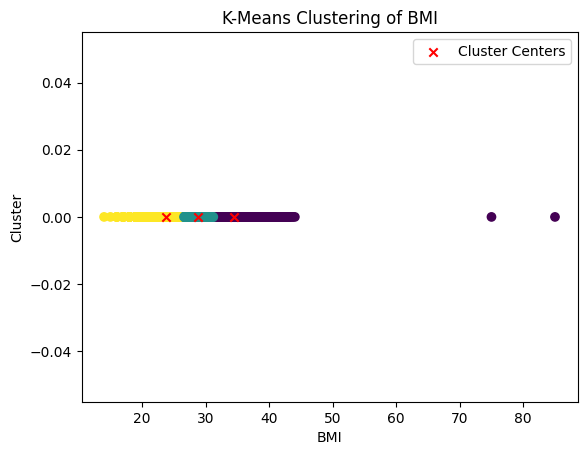

   merged_bmi  bmi_cluster
0       30.52            1
1       28.49            1
2       38.09            0
3       27.43            1
4       26.87            1


In [ ]:

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
df.dropna(inplace=True)
bmi_data = df[['merged_bmi']]

num_clusters = 3

# Performing K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(bmi_data)

# Obtaining cluster centers and labels
cluster_centers = kmeans.cluster_centers_
cluster_labels = kmeans.labels_

# Assigning cluster labels to DataFrame
df['bmi_cluster'] = cluster_labels

# Visualizing clusters
plt.scatter(df['merged_bmi'], [0] * len(df), c=df['bmi_cluster'], cmap='viridis')
plt.scatter(cluster_centers, [0] * num_clusters, marker='x', color='red', label='Cluster Centers')
plt.xlabel('BMI')
plt.ylabel('Cluster')
plt.title('K-Means Clustering of BMI')
plt.legend()
plt.show()

print(df[['merged_bmi', 'bmi_cluster']].head())


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


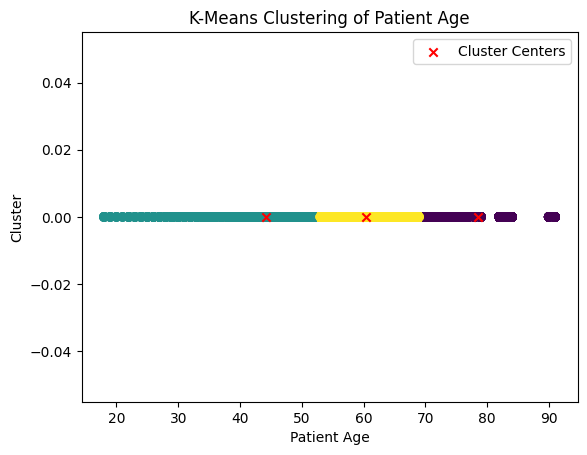

   patient_age  age_cluster
0           84            0
1           62            2
2           43            1
3           45            1
4           55            2


In [ ]:

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

age_data = df[['patient_age']]

num_clusters = 3

# Performing K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(age_data)

# Obtaining cluster centers and labels
cluster_centers = kmeans.cluster_centers_
cluster_labels = kmeans.labels_

# Assigning cluster labels to DataFrame
df['age_cluster'] = cluster_labels

#Visualizing clusters
plt.scatter(df['patient_age'], [0] * len(df), c=df['age_cluster'], cmap='viridis')
plt.scatter(cluster_centers, [0] * num_clusters, marker='x', color='red', label='Cluster Centers')
plt.xlabel('Patient Age')
plt.ylabel('Cluster')
plt.title('K-Means Clustering of Patient Age')
plt.legend()
plt.show()

print(df[['patient_age', 'age_cluster']].head())


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


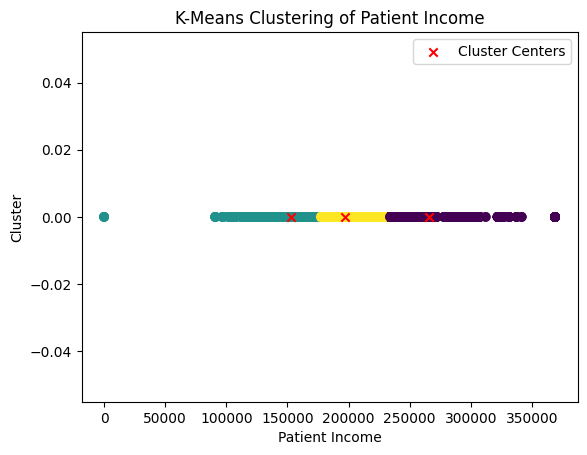

   patient_income  income_cluster
0          141003               1
1          246510               0
2          215720               2
3          287354               0
4          159516               1


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

income_data = df[['patient_income']]
num_clusters = 3

# Performing K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(income_data)

# Obtaining cluster centers and labels
cluster_centers = kmeans.cluster_centers_
cluster_labels = kmeans.labels_

# Assigning cluster labels to DataFrame
df['income_cluster'] = cluster_labels

# Visualizing clusters
plt.scatter(df['patient_income'], [0] * len(df), c=df['income_cluster'], cmap='viridis')
plt.scatter(cluster_centers, [0] * num_clusters, marker='x', color='red', label='Cluster Centers')
plt.xlabel('Patient Income')
plt.ylabel('Cluster')
plt.title('K-Means Clustering of Patient Income')
plt.legend()
plt.show()

print(df[['patient_income', 'income_cluster']].head())


In [ ]:

# Visualizing the distribution and proportion of cancer cases across age clusters and diagnosis periods.
cluster_diagnosis_df = df[['age_cluster', 'DiagPeriodL90D']]
cancer_cases_in_clusters = cluster_diagnosis_df.groupby(['age_cluster', 'DiagPeriodL90D']).size().unstack(fill_value=0)
print(cancer_cases_in_clusters)


DiagPeriodL90D     0     1
age_cluster               
0                887  1749
1               1624  2339
2               2335  3972


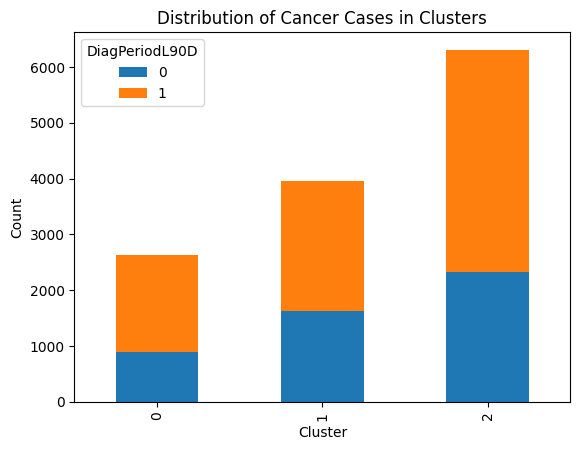

In [ ]:
cancer_cases_in_clusters.plot(kind='bar', stacked=True)
plt.title('Distribution of Cancer Cases in Clusters')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()


In [ ]:
cluster_counts = cluster_diagnosis_df['age_cluster'].value_counts()
cancer_proportion_in_clusters = cancer_cases_in_clusters / cluster_counts[:, None]
print(cancer_proportion_in_clusters)


DiagPeriodL90D         0      1
age_cluster                    
0               0.166667  0.500
1               0.625000  0.875
2               0.250000  0.750


<ipython-input-26-ff47bca06fa8>:2: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  cancer_proportion_in_clusters = cancer_cases_in_clusters / cluster_counts[:, None]


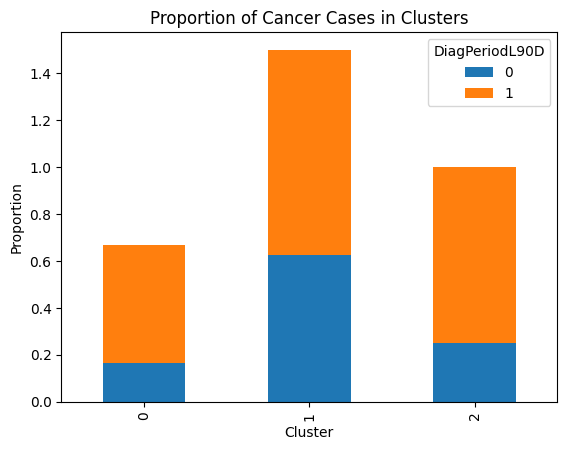

In [ ]:
cancer_proportion_in_clusters.plot(kind='bar', stacked=True)
plt.title('Proportion of Cancer Cases in Clusters')
plt.xlabel('Cluster')
plt.ylabel('Proportion')
plt.show()


In [ ]:
"""The features that have low p-values in the ANOVA test are the ones that show significant
differences across different categories of the patient_race column. These features are likely to be informative
for predicting or imputing values in the patient_race column
"""


import pandas as pd
from scipy.stats import f_oneway

# df = pd.read_csv('training//training_bmi.csv')
df = pd.read_csv('training.csv')

numerical_columns = [
    'patient_zip3', 'patient_age', 'population', 'density', 'age_median', 'age_under_10',
    'age_10_to_19', 'age_20s', 'age_30s', 'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80',
    'male', 'female', 'married', 'divorced', 'never_married', 'widowed', 'family_size',
    'family_dual_income', 'income_household_median', 'income_household_under_5',
    'income_household_5_to_10', 'income_household_10_to_15', 'income_household_15_to_20',
    'income_household_20_to_25', 'income_household_25_to_35', 'income_household_35_to_50',
    'income_household_50_to_75', 'income_household_75_to_100', 'income_household_100_to_150',
    'income_household_150_over', 'income_household_six_figure', 'income_individual_median',
    'home_ownership', 'housing_units', 'home_value', 'rent_median', 'rent_burden',
    'education_less_highschool', 'education_highschool', 'education_some_college',
    'education_bachelors', 'education_graduate', 'education_college_or_above',
    'education_stem_degree', 'labor_force_participation', 'unemployment_rate',
    'self_employed', 'farmer', 'race_white', 'race_black', 'race_asian', 'race_native',
    'race_pacific', 'race_other', 'race_multiple', 'hispanic'
]

# DataFrame to store the results
anova_results = pd.DataFrame(columns=['Feature', 'F-statistic', 'P-value'])

for feature in numerical_columns:
    # Filtering out NaN values
    non_nan_data = df[[feature, 'patient_race']].dropna()

    # ANOVA test
    group_by_race = non_nan_data.groupby('patient_race')[feature]
    anova_result = f_oneway(*[group.values for name, group in group_by_race])

    # results
    anova_results = anova_results.append({
        'Feature': feature,
        'F-statistic': anova_result.statistic,
        'P-value': anova_result.pvalue
    }, ignore_index=True)

print(anova_results.sort_values(by='P-value'))



<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  anova_results = anova_results.append({
<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  anova_results = anova_results.append({
<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  anova_results = anova_results.append({
<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  anova_results = anova_results.append({
<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

                        Feature  F-statistic        P-value
53                   race_black   483.132764   0.000000e+00
52                   race_white   422.108620  4.940656e-324
59                     hispanic   413.065220  1.139735e-317
58                race_multiple   305.021523  7.288624e-241
57                   race_other   300.529906  1.402929e-237
20                  family_size   269.729944  7.533084e-215
16                      married   220.024805  2.141494e-177
18                never_married   213.345402  2.750303e-172
54                   race_asian   207.207367  1.412584e-167
36               home_ownership   197.831863  2.379232e-160
2                    population   190.271663  1.688999e-154
41    education_less_highschool   190.092572  2.325713e-154
39                  rent_median   172.116112  2.402859e-140
0                  patient_zip3   161.092269  1.094999e-131
38                   home_value   148.389025  1.216980e-121
37                housing_units   142.95

<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  anova_results = anova_results.append({
<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  anova_results = anova_results.append({
<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  anova_results = anova_results.append({
<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  anova_results = anova_results.append({
<ipython-input-20-a4eba7aedc8d>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

# **Univariate Feature Selection**:

SelectKBest: Select the top k features based on univariate statistical tests.
SelectPercentile: Select the top features based on a percentage of the highest scores.


In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import pandas as pd

# Load your data (replace 'your_dataset.csv' with your actual dataset)
train_data = pd.read_csv("training.csv")
# train_data = pd.read_csv("train_final1.csv")

# Drop the patient_id column
train_data = train_data.drop(['patient_id'], axis=1)

# Handle missing values
# Separate numerical and categorical features
numerical_features = train_data.select_dtypes(include=['float64']).columns
categorical_features = train_data.select_dtypes(include=['object']).columns

# Impute missing values for numerical features
numerical_imputer = SimpleImputer(strategy='mean')
train_data[numerical_features] = numerical_imputer.fit_transform(train_data[numerical_features])

# Impute missing values for categorical features
categorical_imputer = SimpleImputer(strategy='most_frequent')
train_data[categorical_features] = categorical_imputer.fit_transform(train_data[categorical_features])

# One-hot encode categorical variables
train_data = pd.get_dummies(train_data, columns=categorical_features)

# Split the data into features (X) and target variable (y)
X = train_data.drop(columns=["DiagPeriodL90D"])
y = train_data["DiagPeriodL90D"]

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# SelectKBest with ANOVA F-statistic as the score function (for classification problems)
k = 10
selector = SelectKBest(score_func=f_classif, k=k)
X_train_selected = selector.fit_transform(X_train, y_train)

# Get the indices of the selected features
selected_feature_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_feature_names = X_train.columns[selected_feature_indices]

# Create a DataFrame with selected features
selected_features_df = pd.DataFrame(X_train_selected, columns=selected_feature_names)

# Print the names of selected features
print("Selected Features:")
print(selected_feature_names)


Selected Features:
Index(['breast_cancer_diagnosis_code_1744',
       'breast_cancer_diagnosis_code_1748',
       'breast_cancer_diagnosis_code_1749',
       'breast_cancer_diagnosis_code_C50911',
       'breast_cancer_diagnosis_code_C50912',
       'breast_cancer_diagnosis_desc_Malignant neoplasm of breast (female), unspecified',
       'breast_cancer_diagnosis_desc_Malignant neoplasm of other specified sites of female breast',
       'breast_cancer_diagnosis_desc_Malignant neoplasm of unsp site of right female breast',
       'breast_cancer_diagnosis_desc_Malignant neoplasm of unspecified site of left female breast',
       'breast_cancer_diagnosis_desc_Malignant neoplasm of upper-outer quadrant of female breast'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [128 153 162 205 207 254 274] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


In [ ]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import pandas as pd

# Load your data (replace 'your_dataset.csv' with your actual dataset)
train_data = pd.read_csv("training.csv")

# Drop the patient_id column
train_data = train_data.drop(['patient_id'], axis=1)

# Handle missing values
# Separate numerical and categorical features
numerical_features = train_data.select_dtypes(include=['float64']).columns
categorical_features = train_data.select_dtypes(include=['object']).columns

# Impute missing values for numerical features
numerical_imputer = SimpleImputer(strategy='mean')
train_data[numerical_features] = numerical_imputer.fit_transform(train_data[numerical_features])

# Impute missing values for categorical features
categorical_imputer = SimpleImputer(strategy='most_frequent')
train_data[categorical_features] = categorical_imputer.fit_transform(train_data[categorical_features])

# One-hot encode categorical variables
train_data = pd.get_dummies(train_data, columns=categorical_features)

# Split the data into features (X) and target variable (y)
X = train_data.drop(columns=["DiagPeriodL90D"])
y = train_data["DiagPeriodL90D"]

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a base classifier (you can use any other classifier of your choice)
base_classifier = RandomForestClassifier()

# Create the RFE model and select 10 features
n_features_to_select = 10
rfe = RFE(estimator=base_classifier, n_features_to_select=n_features_to_select)
X_train_rfe = rfe.fit_transform(X_train, y_train)

# Get the names of the selected features
selected_feature_names = X_train.columns[rfe.support_]

# Create a DataFrame with selected features
selected_features_df = pd.DataFrame(X_train_rfe, columns=selected_feature_names)

# Print the names of selected features
print("Selected Features:")
print(selected_feature_names)


Selected Features:
Index(['patient_zip3', 'patient_age', 'bmi', 'age_over_80',
       'income_household_25_to_35', 'education_bachelors', 'commute_time',
       'breast_cancer_diagnosis_code_1749',
       'breast_cancer_diagnosis_desc_Malignant neoplasm of breast (female), unspecified',
       'breast_cancer_diagnosis_desc_Malignant neoplasm of upper-outer quadrant of female breast'],
      dtype='object')


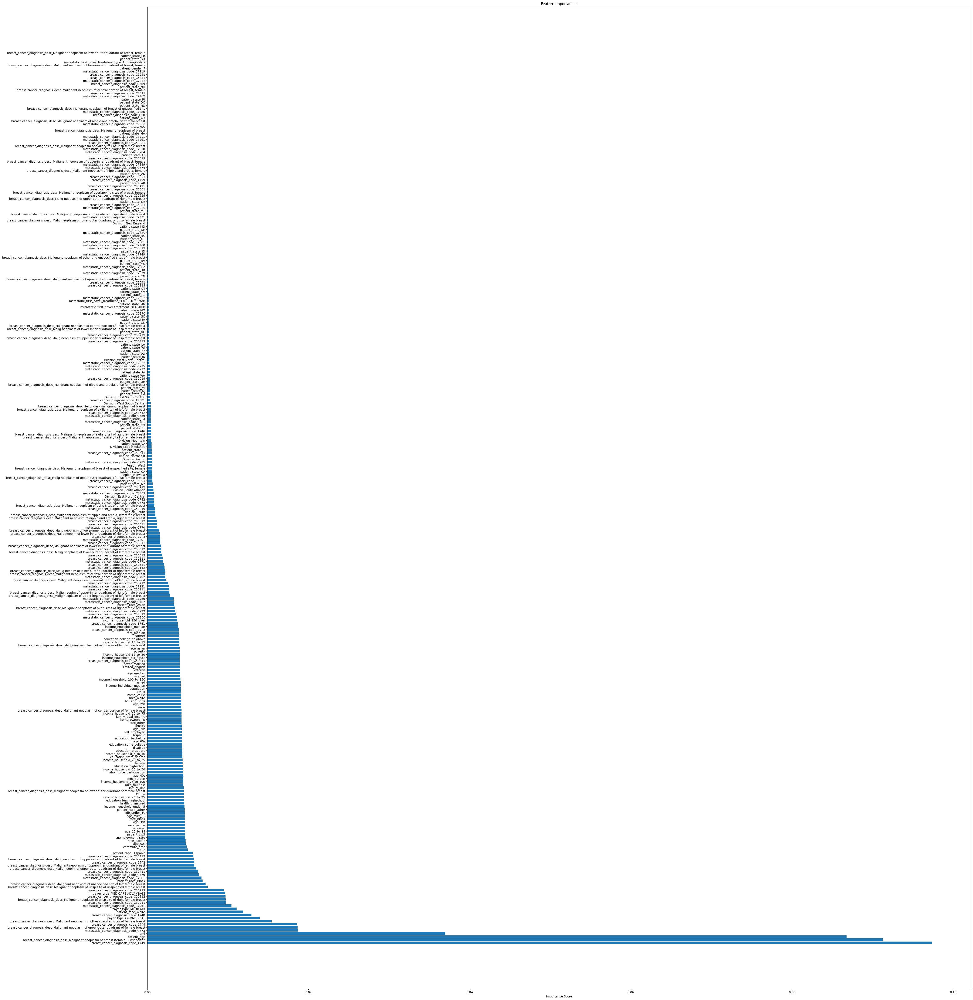

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import pandas as pd
import matplotlib.pyplot as plt

# Load your data (replace 'your_dataset.csv' with your actual dataset)
train_data = pd.read_csv("training.csv")

# Drop the patient_id column
train_data = train_data.drop(['patient_id'], axis=1)

# Handle missing values
# Separate numerical and categorical features
numerical_features = train_data.select_dtypes(include=['float64']).columns
categorical_features = train_data.select_dtypes(include=['object']).columns

# Impute missing values for numerical features
numerical_imputer = SimpleImputer(strategy='mean')
train_data[numerical_features] = numerical_imputer.fit_transform(train_data[numerical_features])

# Impute missing values for categorical features
categorical_imputer = SimpleImputer(strategy='most_frequent')
train_data[categorical_features] = categorical_imputer.fit_transform(train_data[categorical_features])

# One-hot encode categorical variables
train_data = pd.get_dummies(train_data, columns=categorical_features)

# Split the data into features (X) and target variable (y)
X = train_data.drop(columns=["DiagPeriodL90D"])
y = train_data["DiagPeriodL90D"]

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_classifier.fit(X_train, y_train)

# Get feature importances
feature_importances = rf_classifier.feature_importances_

# Get the names of features
feature_names = X_train.columns

# Create a DataFrame with feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(50, 60))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance Score')
plt.title('Feature Importances')
plt.show()


Number of missing values in BMI column: 8965


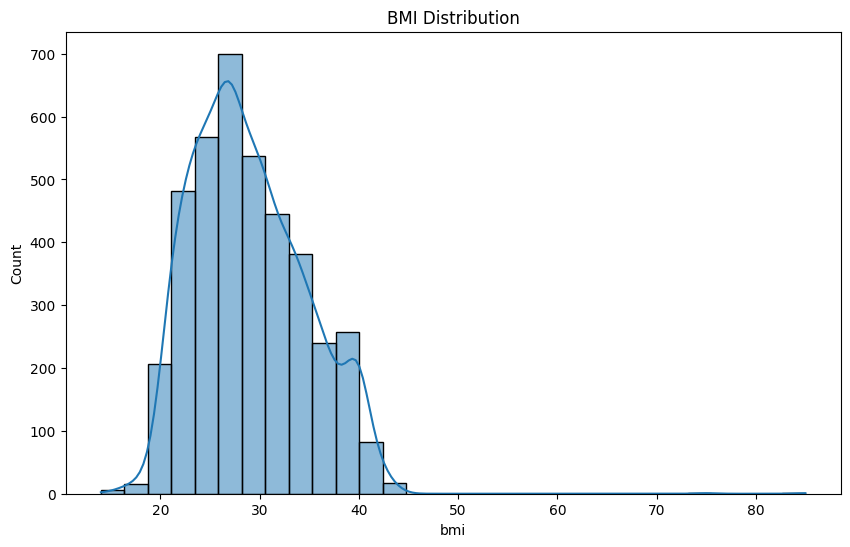


Summary Statistics:
count    3941.000000
mean       28.984539
std         5.696906
min        14.000000
25%        24.660000
50%        28.190000
75%        32.920000
max        85.000000
Name: bmi, dtype: float64

Correlation with BMI:
bmi                            1.000000
income_household_35_to_50      0.095446
income_household_25_to_35      0.094422
education_highschool           0.090453
income_household_20_to_25      0.088759
                                 ...   
home_value                    -0.090552
rent_median                   -0.097696
income_household_median       -0.104458
income_household_150_over     -0.104607
income_household_six_figure   -0.106262
Name: bmi, Length: 72, dtype: float64


<ipython-input-32-2aec679ecbc8>:25: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


0             Obese
1        Overweight
2             Obese
3             Obese
4             Obese
            ...    
12901         Obese
12902         Obese
12903    Overweight
12904         Obese
12905         Obese
Name: bmi_category, Length: 12906, dtype: object

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Data
df = pd.read_csv('training.csv')
bmi_column = df['bmi']

# 1. Missing Values
missing_values = bmi_column.isnull().sum()
print(f"Number of missing values in BMI column: {missing_values}")

# 2. Distribution
plt.figure(figsize=(10, 6))
sns.histplot(bmi_column.dropna(), bins=30, kde=True)
plt.title('BMI Distribution')
plt.show()

# 3. Summary Statistics
summary_stats = bmi_column.describe()
print("\nSummary Statistics:")
print(summary_stats)

# 4. Correlation with Other Features
correlation_matrix = df.corr()
bmi_correlation = correlation_matrix['bmi'].sort_values(ascending=False)
print("\nCorrelation with BMI:")
print(bmi_correlation)

# 5. BMI Categories
def categorize_bmi(bmi):
    if bmi < 18.5:
        return 'Underweight'
    elif 18.5 <= bmi < 25:
        return 'Normal Weight'
    elif 25 <= bmi < 30:
        return 'Overweight'
    else:
        return 'Obese'

df['bmi_category'] = df['bmi'].apply(categorize_bmi)

df['bmi_category']

<ipython-input-33-bc55ee819539>:13: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


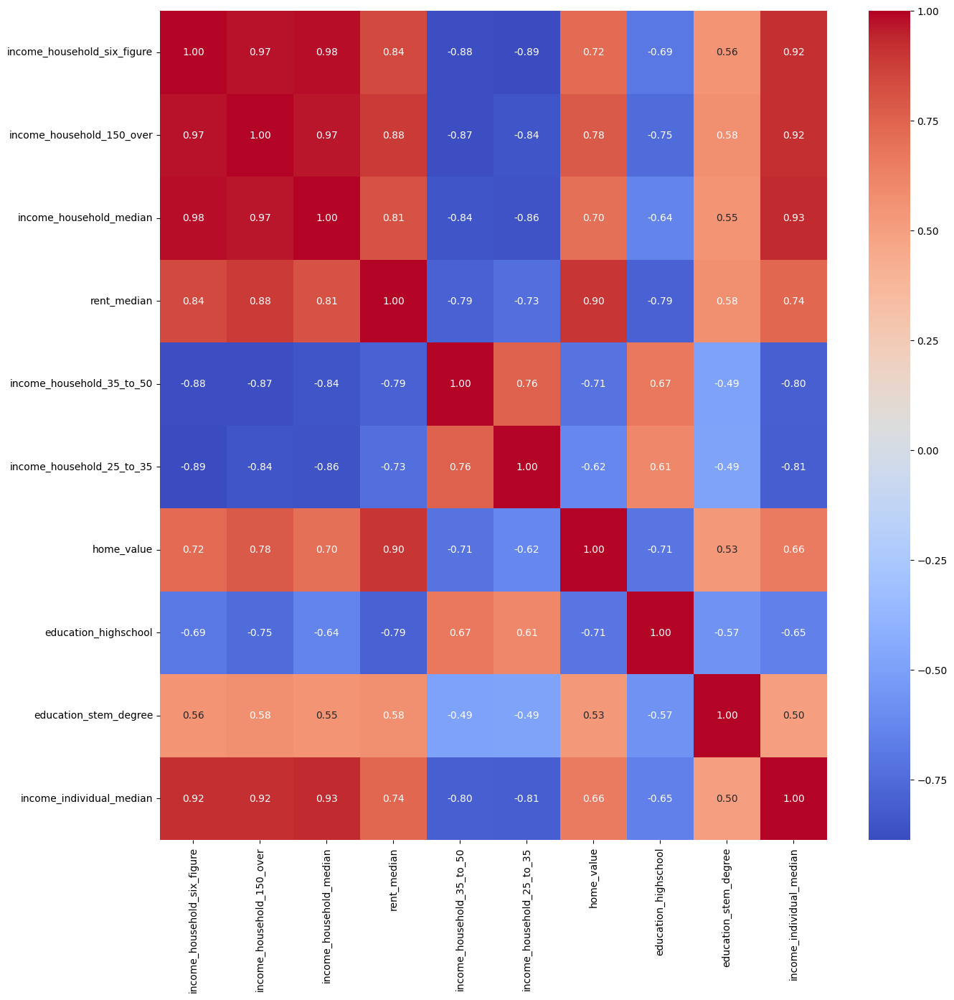

8965
Top Col:  Index(['income_household_six_figure', 'income_household_150_over',
       'income_household_median', 'rent_median', 'income_household_35_to_50',
       'income_household_25_to_35', 'home_value', 'education_highschool',
       'education_stem_degree', 'income_individual_median'],
      dtype='object')
         bmi  bmi_filled
0        NaN   30.655024
1      28.49         NaN
2      38.09         NaN
3        NaN   27.512093
4        NaN   26.877028
...      ...         ...
12901  32.11         NaN
12902    NaN   26.245347
12903  29.24         NaN
12904  31.00         NaN
12905    NaN   31.077162

[12906 rows x 2 columns]


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import seaborn as sns
import matplotlib.pyplot as plt

import pandas as pd

# Load the Data
df = pd.read_csv('training.csv')

correlation_matrix = df.corr()

# Get the top 10 columns with the highest absolute correlation with 'bmi'
top_columns = correlation_matrix['bmi'].abs().sort_values(ascending=False).head(11).index[1:]

# Plot the heatmap for the top 10 columns
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix[top_columns].loc[top_columns], annot=True, cmap='coolwarm', fmt='.2f')
plt.show()

print(df['bmi'].isnull().sum())

print("Top Col: ", top_columns)

# Assuming X contains features and y contains BMI
X = df[top_columns]
y = df['bmi']

# Identify rows with missing 'bmi' values
missing_bmi_mask = y.isnull()

# Separate the dataframe into features (X_train) and target (y_train) for non-missing values
X_train, y_train = X[~missing_bmi_mask], y[~missing_bmi_mask]

# Identify numerical columns
numerical_cols = X.select_dtypes(exclude=['object']).columns.tolist()

# Create transformers for numerical columns
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # You can choose another strategy
])

# Use ColumnTransformer to apply the numerical transformer to the numerical columns
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
    ])

# Build the model pipeline
model = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', RandomForestRegressor())])

# Train the model on the rows where 'bmi' is not missing
model.fit(X_train, y_train)

# Predict missing 'bmi' values in the entire dataset
predicted_bmi = model.predict(X[missing_bmi_mask])

# Fill missing 'bmi' values with predictions
df.loc[missing_bmi_mask, 'bmi_filled'] = predicted_bmi

# Print the original 'bmi' and the new 'bmi_filled' columns
print(df[['bmi', 'bmi_filled']])

# Create a new column 'merged_bmi' with the merged output of 'bmi' and 'bmi_filled'
df['merged_bmi'] = df.apply(lambda row: row['bmi_filled'] if pd.notnull(row['bmi_filled']) else row['bmi'], axis=1)

df.to_csv('training_bmi.csv', index=False)


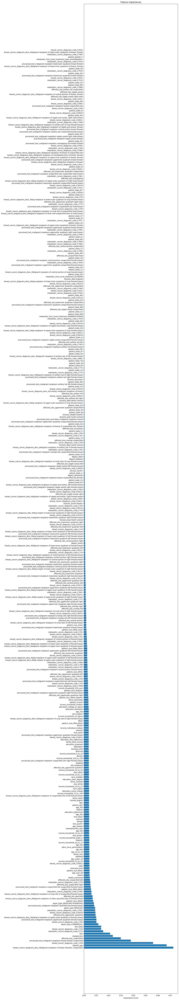

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import pandas as pd
import matplotlib.pyplot as plt

# Load your data (replace 'your_dataset.csv' with your actual dataset)
train_data = pd.read_csv("training_Preprocessed.csv")

# Drop the patient_id column
train_data.drop(columns=['patient_id'], inplace=True)

# Separate features (X) and target variable (y)
X = train_data.drop(columns=["DiagPeriodL90D"])
y = train_data["DiagPeriodL90D"]

# Handle missing values
numerical_features = X.select_dtypes(include=['float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

# Impute missing values for numerical features
numerical_imputer = SimpleImputer(strategy='mean')
X[numerical_features] = numerical_imputer.fit_transform(X[numerical_features])

# Impute missing values for categorical features
categorical_imputer = SimpleImputer(strategy='most_frequent')
X[categorical_features] = categorical_imputer.fit_transform(X[categorical_features])

# One-hot encode categorical variables
X = pd.get_dummies(X, columns=categorical_features)

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_classifier.fit(X_train, y_train)

# Get feature importances
feature_importances = rf_classifier.feature_importances_

# Get the names of features
feature_names = X_train.columns

# Create a DataFrame with feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 106))  # Adjust figure size as needed
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance Score')
plt.title('Feature Importances')
plt.show()

In [ ]:
# prompt: list the columns of dataset

print(X_train.columns.to_list())


['patient_zip3', 'patient_age', 'bmi', 'population', 'density', 'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s', 'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male', 'female', 'married', 'divorced', 'never_married', 'widowed', 'family_size', 'family_dual_income', 'income_household_median', 'income_household_under_5', 'income_household_5_to_10', 'income_household_10_to_15', 'income_household_15_to_20', 'income_household_20_to_25', 'income_household_25_to_35', 'income_household_35_to_50', 'income_household_50_to_75', 'income_household_75_to_100', 'income_household_100_to_150', 'income_household_150_over', 'income_household_six_figure', 'income_individual_median', 'home_ownership', 'housing_units', 'home_value', 'rent_median', 'rent_burden', 'education_less_highschool', 'education_highschool', 'education_some_college', 'education_bachelors', 'education_graduate', 'education_college_or_above', 'education_stem_degree', 'labor_force_participation', 'unemploym

In [ ]:
# Assuming 'train_data' is your DataFrame
null_values = train_data.isnull().sum()
print("Null values in each column:")
print(null_values)


Null values in each column:
patient_race           6385
payer_type             1803
patient_state            51
patient_zip3              0
patient_age               0
                       ... 
merged_bmi                0
processed_text            1
affected_site             1
patient_race_filled       0
patient_income            0
Length: 88, dtype: int64


LASSO Regression:

L1 regularization (LASSO) can be used to encourage sparsity in feature weights, effectively performing feature selection.


In [ ]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Load your data (replace 'your_dataset.csv' with your actual dataset)
train_data = pd.read_csv("cleaned_dataset_encoded.csv")

# Drop the patient_id column
train_data = train_data.drop(['patient_id'], axis=1)

# Handle missing values
# Separate numerical and categorical features
numerical_features = train_data.select_dtypes(include=['float64']).columns
categorical_features = train_data.select_dtypes(include=['object']).columns

# Impute missing values for numerical features
numerical_imputer = SimpleImputer(strategy='mean')
train_data[numerical_features] = numerical_imputer.fit_transform(train_data[numerical_features])

# Impute missing values for categorical features
categorical_imputer = SimpleImputer(strategy='most_frequent')
train_data[categorical_features] = categorical_imputer.fit_transform(train_data[categorical_features])

# One-hot encode categorical variables
train_data = pd.get_dummies(train_data, columns=categorical_features)

# Split the data into features (X) and target variable (y)
X = train_data.drop(columns=["DiagPeriodL90D"])
y = train_data["DiagPeriodL90D"]

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (important for regularization)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_valid_scaled = scaler.transform(X_valid)

# Create the Lasso model
lasso = Lasso(alpha=0.04)  # Adjust the alpha parameter based on the desired level of regularization

# Fit the model to the training data
lasso.fit(X_train_scaled, y_train)

# Get the coefficients of the features
feature_coefficients = pd.Series(lasso.coef_, index=X.columns)

# Get the names of non-zero coefficient features (selected features)
selected_feature_names = feature_coefficients[feature_coefficients != 0].index

# Print the names of selected features
print("Selected Features:")
print(selected_feature_names)


Selected Features:
Index(['breast_cancer_diagnosis_code_1741',
       'breast_cancer_diagnosis_code_1742',
       'breast_cancer_diagnosis_code_1744',
       'breast_cancer_diagnosis_code_1745',
       'breast_cancer_diagnosis_code_1748',
       'breast_cancer_diagnosis_code_1749'],
      dtype='object')


In [ ]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import pandas as pd

# Load your data (replace 'your_dataset.csv' with your actual dataset)
train_data = pd.read_csv("final_rounded.csv")
# train_data_rounded = train_data.round(2)

# Split the data into features (X) and target variable (y)
X = train_data.drop(columns=["DiagPeriodL90D"])
y = train_data["DiagPeriodL90D"]

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a base classifier (you can use any other classifier of your choice)
base_classifier = RandomForestClassifier()

# Create the RFE model and select 10 features
n_features_to_select = 10
rfe = RFE(estimator=base_classifier, n_features_to_select=n_features_to_select)
X_train_rfe = rfe.fit_transform(X_train, y_train)

# Get the names of the selected features
selected_feature_names = X_train.columns[rfe.support_]

# Create a DataFrame with selected features
selected_features_df = pd.DataFrame(X_train_rfe, columns=selected_feature_names)

# Print the names of selected features
print("Selected Features:")
print(selected_feature_names)


<ipython-input-40-a6bd3aa12be2>:13: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


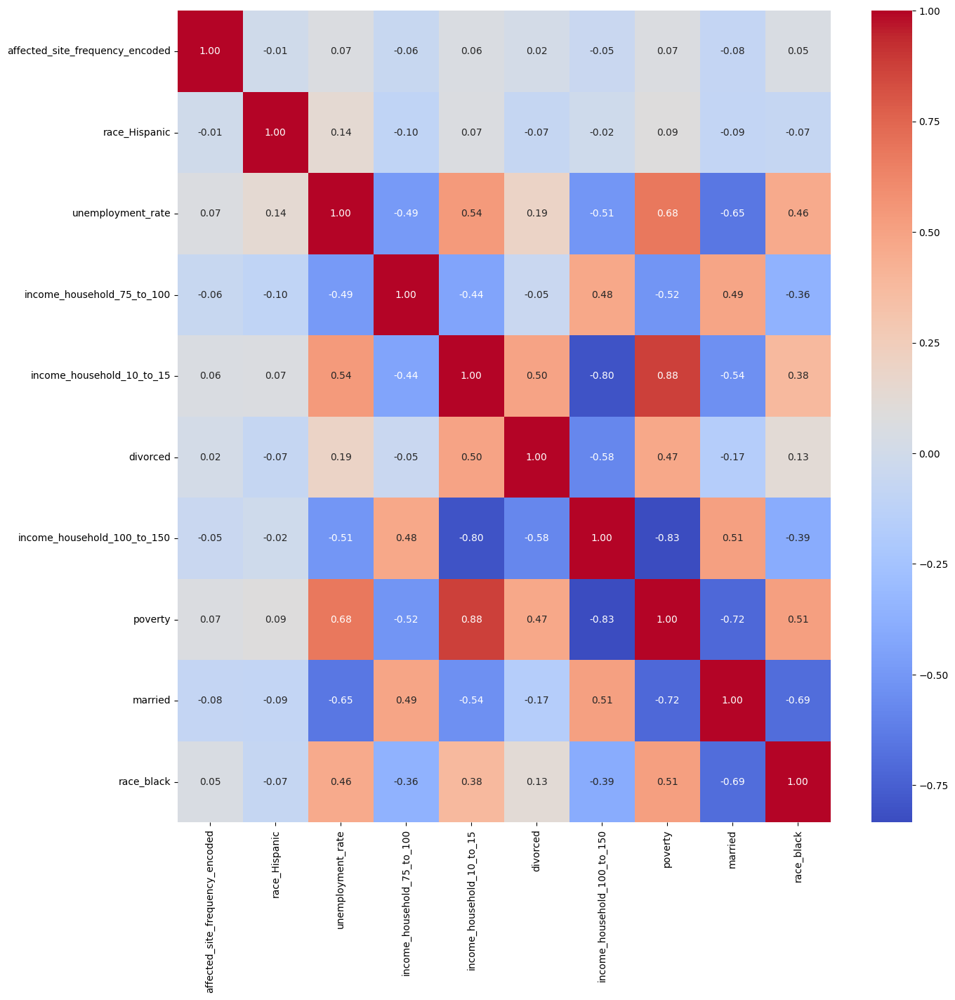

1
Top Col:  Index(['affected_site_frequency_encoded', 'race_Hispanic', 'unemployment_rate',
       'income_household_75_to_100', 'income_household_10_to_15', 'divorced',
       'income_household_100_to_150', 'poverty', 'married', 'race_black'],
      dtype='object')


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import seaborn as sns
import matplotlib.pyplot as plt

import pandas as pd

# Load the Data
df = pd.read_csv('cleaned_dataset_encoded.csv')

correlation_matrix = df.corr()

# Get the top 10 columns with the highest absolute correlation with 'bmi'
top_columns = correlation_matrix['DiagPeriodL90D'].abs().sort_values(ascending=False).head(11).index[1:]

# Plot the heatmap for the top 10 columns
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix[top_columns].loc[top_columns], annot=True, cmap='coolwarm', fmt='.2f')
plt.show()

print(df['DiagPeriodL90D'].isnull().sum())

print("Top Col: ", top_columns)



Model Building


XGBOOST

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import pandas as pd

# Load the data
df = pd.read_csv('train_final3_updatedBMI.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a decision tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Generate predictions from the decision tree model
dt_predictions = dt_model.predict(X_test)

# Train an XGBoost model
xgb_model = XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    learning_rate=0.1,
    max_depth=3,
    n_estimators=100,
    random_state=42
)
print(f'Number of labels: {len(y_train)}')
print(f'Number of rows in training data: {X_train_stacked.shape[0]}')
xgb_model.fit(X_train, y_train)

# Generate predictions from the XGBoost model
xgb_predictions = xgb_model.predict(X_test)

# Combine predictions (using a simple average)
hybrid_predictions = (dt_predictions + xgb_predictions) / 2

# Convert hybrid predictions to binary (0 or 1)
hybrid_predictions = (hybrid_predictions > 0.5).astype(int)

# Evaluate accuracy of the hybrid model
accuracy = accuracy_score(y_test, hybrid_predictions)
print(f'Hybrid Model Accuracy: {accuracy}')


Number of labels: 10324


NameError: name 'X_train_stacked' is not defined

Decision Tree Classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Assuming X_train, X_test, y_train, y_test are your training and testing sets
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Predictions on the test set
dt_predictions = dt_model.predict(X_test)

# Evaluate accuracy
accuracy_dt = accuracy_score(y_test, dt_predictions)
print(f'Decision Tree Accuracy: {accuracy_dt}')


Decision Tree Accuracy: 0.7052672347017815


XGB

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import numpy as np
# Initialize XGBoost classifier with specified parameters
xgb_model = XGBClassifier(
    random_state=42,
    booster='gbtree',
    n_estimators=18,
    max_depth=3,
    learning_rate=0.2,
    reg_alpha=0,
    reg_lambda=1,
    gamma=0,
    min_child_weight=1,
    subsample=1,
    colsample_bytree=1,
    missing=np.nan
)

# Fit the model to the training data
xgb_model.fit(X_train, y_train)

# Generate predictions on the test set
xgb_predictions = xgb_model.predict(X_test)

# Evaluate accuracy
accuracy_xgb = accuracy_score(y_test, xgb_predictions)
print(f'XGBoost Accuracy: {accuracy_xgb}')


XGBoost Accuracy: 0.8164213787761425


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Initialize Gradient Boosting classifier with specified parameters
gb_model = GradientBoostingClassifier(
    random_state=42,
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    min_samples_leaf=1
)

# Fit the model to the training data
gb_model.fit(X_train, y_train)

# Generate predictions on the test set
gb_predictions = gb_model.predict(X_test)

# Evaluate accuracy
accuracy_gb = accuracy_score(y_test, gb_predictions)
print(f'Gradient Boosting Accuracy: {accuracy_gb}')


Gradient Boosting Accuracy: 0.8144848954298993


Model Evaluation

In [ ]:
import pandas as pd
import re

# Load the test data
test_data = pd.read_csv('test_final3_updatedBMI.csv')

# Clean feature names in test data (if needed)
test_data.columns = [re.sub(r'[^\w\s]', '', col) for col in test_data.columns]

# probability predictions for the test data using the trained LightGBM model
test_prob_predictions = lgbm_model.predict_proba(test_data)[:, 1]

# Round off the probabilities to 1 decimal place
rounded_prob_predictions = [round(prob, 1) for prob in test_prob_predictions]

#  create a DataFrame for submission
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],  # Assuming 'patient_id' is the column name for patient IDs
    'DiagPeriodL90D': rounded_prob_predictions  # Rounded probability predictions for the positive class
})

# Write the submission DataFrame to a CSV file
submission_df.to_csv('submission_probabilities_rounded_LGBM.csv', index=False)

# Download the submission file
from google.colab import files
files.download('submission_probabilities_rounded_LGBM.csv')


NameError: name 'lgbm_model' is not defined

In [ ]:
import pandas as pd
from xgboost import XGBClassifier
import numpy as np

# Load the test data
test_data = pd.read_csv('test_final3_updatedBMI.csv')

# Clean feature names in test data (if needed)
test_data.columns = [re.sub(r'[^\w\s]', '', col) for col in test_data.columns]

# Assuming 'X_test' contains the features for the test data

# Generate probability predictions for the test data using the trained XGBoost model
test_prob_predictions = xgb_model.predict_proba(test_data)[:, 1]  # Assuming you want probabilities for the positive class

# Round off the probabilities to 1 decimal place
rounded_prob_predictions = [round(prob, 1) for prob in test_prob_predictions]

# Assuming 'patient_id' column is present in the test data
patient_ids = test_data['patient_id']

# Ensure that the number of patient IDs matches the number of probability predictions
assert len(patient_ids) == len(rounded_prob_predictions), "Number of patient IDs does not match number of probability predictions"

# Create a DataFrame for submission
submission_df = pd.DataFrame({
    'patient_id': patient_ids,  # Assuming 'patient_id' is the column name for patient IDs
    'DiagPeriodL90D': rounded_prob_predictions  # Rounded probability predictions for the positive class
})

# Write the submission DataFrame to a CSV file
submission_df.to_csv('submission_probabilities_rounded_XGB.csv', index=False)

# Download the submission file
from google.colab import files
files.download('submission_probabilities_rounded_XGB.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from sklearn.ensemble import VotingClassifier
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
import numpy as np
import pandas as pd

# Assuming your DataFrame is named 'df' and the target variable is 'DiagPeriodL90D'
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Handle missing values
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create individual models
lgbm_model = LGBMClassifier(
    random_state=42,
    n_estimators=9,
    max_leaves=31,
    learning_rate=0.2,
    reg_alpha=0,
    reg_lambda=0,
    min_split_gain=0,
    min_child_weight=0.001,
    subsample=1,
    colsample_bytree=0.7
)

xgb_model = XGBClassifier(
    random_state=42,
    booster='gbtree',
    n_estimators=18,
    max_depth=3,
    learning_rate=0.2,
    reg_alpha=0,
    reg_lambda=1,
    gamma=0,
    min_child_weight=1,
    subsample=1,
    colsample_bytree=1
)

# Create a Voting Classifier
voting_classifier = VotingClassifier(
    estimators=[
        ('lgbm', lgbm_model),
        ('xgb', xgb_model)
    ],
    voting='hard'  # You can use 'soft' if models provide probability estimates
)

# Fit the Voting Classifier to the training data
voting_classifier.fit(X_train, y_train)

# Generate predictions on the test set
ensemble_predictions = voting_classifier.predict(X_test)

# Evaluate accuracy
accuracy_ensemble = accuracy_score(y_test, ensemble_predictions)
print(f'Ensemble Accuracy: {accuracy_ensemble}')


[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 6443, number of negative: 3881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17104
[LightGBM] [Info] Number of data points in the train set: 10324, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624080 -> initscore=0.506901
[LightGBM] [Info] Start training from score 0.506901
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
Ensemble Accuracy: 0.7567776917118513


In [ ]:
import shap
explainer = shap.Explainer(gb_model, X)
shap_values = explainer(X)

 98%|===================| 12656/12906 [00:14<00:00]       

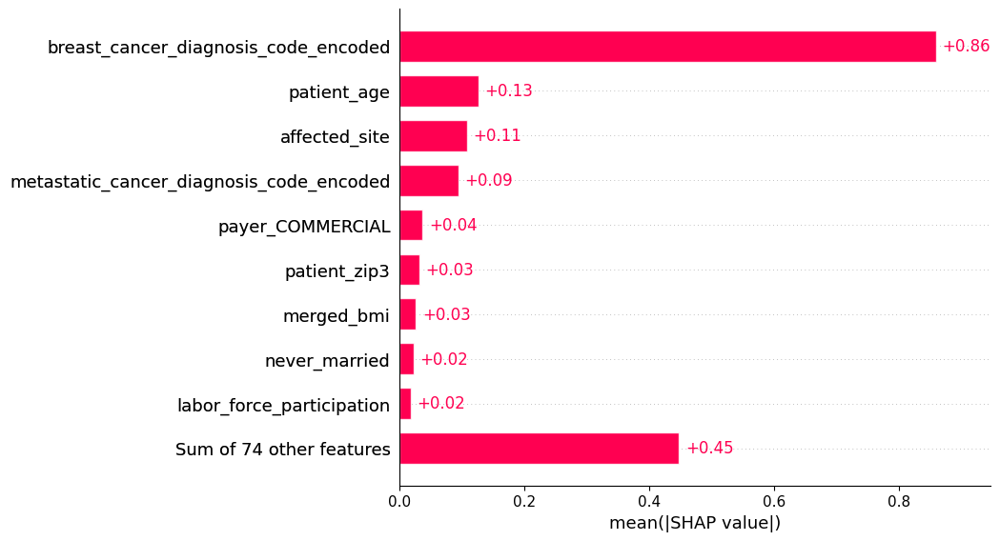

In [ ]:
shap.plots.bar(shap_values)

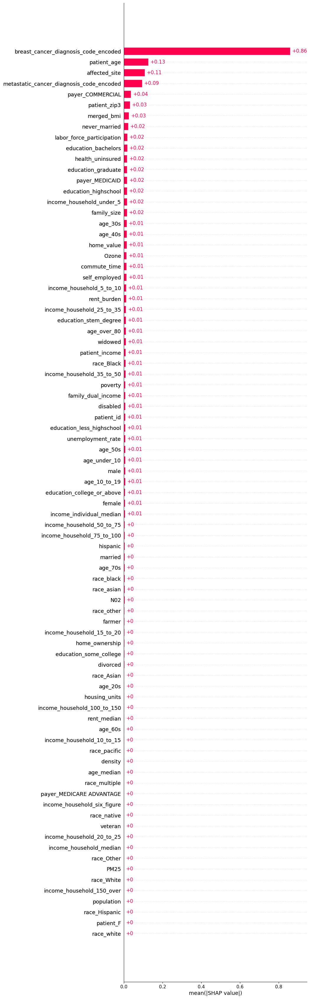

In [ ]:
shap.plots.bar(shap_values, max_display=83)

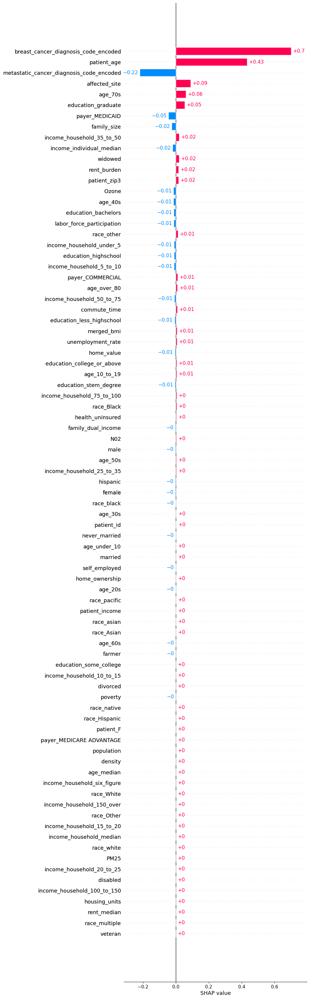

In [ ]:
shap.plots.bar(shap_values[0], max_display=83)

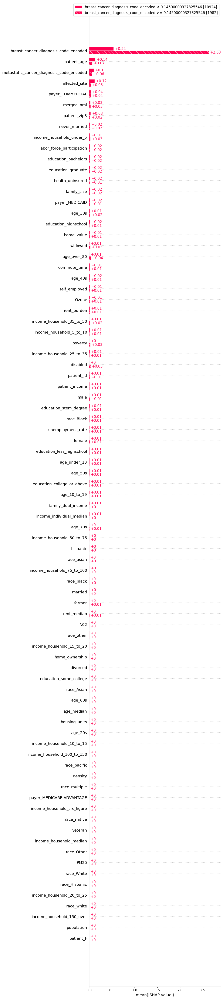

In [ ]:
shap.plots.bar(shap_values.cohorts(2).abs.mean(0), max_display=83)

In [ ]:
clustering = shap.utils.hclust(
    X, y
)  # by default this trains (X.shape[1] choose 2) 2-feature XGBoost models
shap.plots.bar(shap_values, clustering=clustering)

No/low signal found from feature 0 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
  5%|▍         | 4/83 [00:58<38:34, 29.30s/it]


KeyboardInterrupt: 

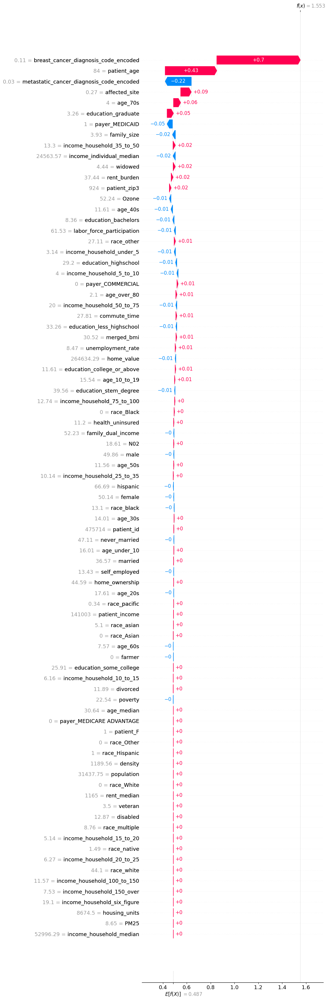

In [ ]:
shap.plots.waterfall(shap_values[0],max_display=83)

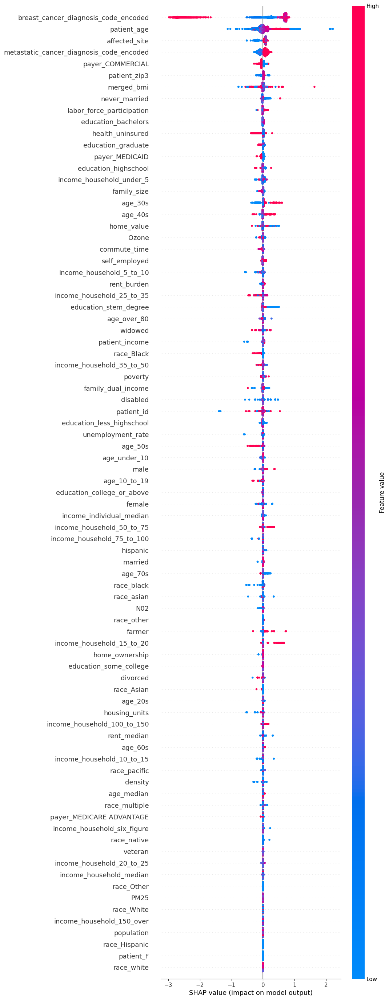

In [ ]:
shap.plots.beeswarm(shap_values, max_display=83)

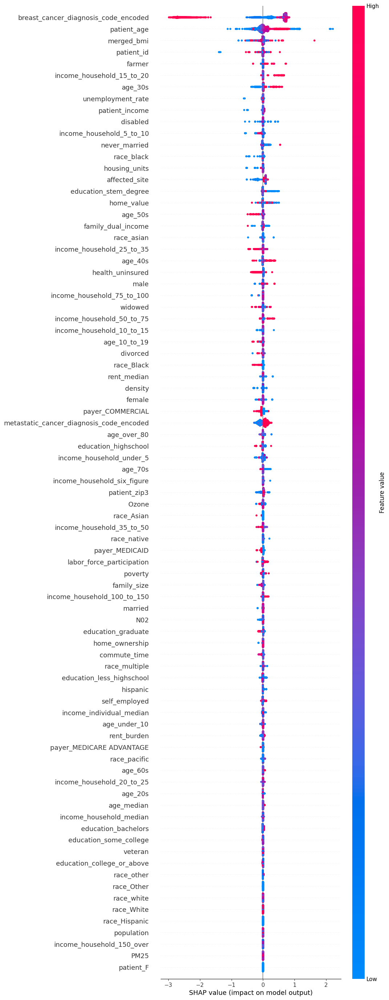

In [ ]:
shap.plots.beeswarm(shap_values, order=shap_values.abs.max(0),max_display=83)

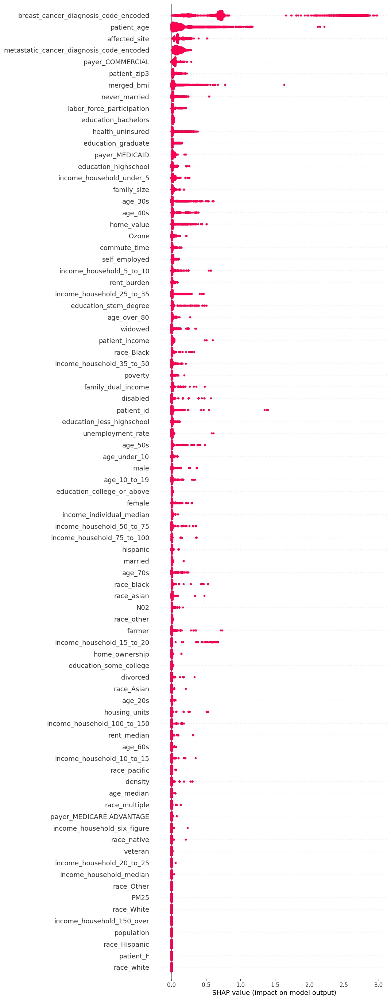

In [ ]:
shap.plots.beeswarm(shap_values.abs, color="shap_red", max_display=83)

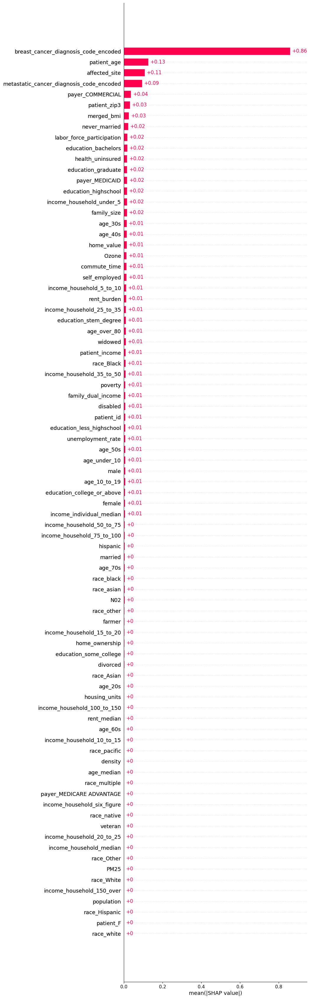

In [ ]:
shap.plots.bar(shap_values.abs.mean(0),max_display=83)

LGBM

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score

import re

# Remove special characters from feature names
X_train.columns = [re.sub(r'[^\w\s]', '', col) for col in X_train.columns]

# Initialize LightGBM classifier with specified parameters
lgbm_model = LGBMClassifier(
    random_state=42,
    n_estimators=9,
    max_leaves=31,
    learning_rate=0.2,
    reg_alpha=0,
    reg_lambda=0,
    min_split_gain=0,
    min_child_weight=0.001,
    subsample=1,
    colsample_bytree=0.7
)

# Fit the model to the training data
lgbm_model.fit(X_train, y_train)

# Generate predictions on the test set
lgbm_predictions = lgbm_model.predict(X_test)

# Evaluate accuracy
accuracy_lgbm = accuracy_score(y_test, lgbm_predictions)
print(f'LightGBM Accuracy: {accuracy_lgbm}')



[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 6443, number of negative: 3881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17104
[LightGBM] [Info] Number of data points in the train set: 10324, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624080 -> initscore=0.506901
[LightGBM] [Info] Start training from score 0.506901
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
LightGBM Accuracy: 0.7552285050348567


In [ ]:
explainer = shap.Explainer(lgbm_model, X)
shap_values = explainer(X)

TypeError: The passed model is not callable and cannot be analyzed directly with the given masker! Model: LGBMClassifier(colsample_bytree=0.7, learning_rate=0.2, max_leaves=31,
               min_split_gain=0, n_estimators=9, random_state=42, reg_alpha=0,
               reg_lambda=0, subsample=1)

In [ ]:
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming your DataFrame is named 'df' and the target variable is 'DiagPeriodL90D'
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create individual models
lgbm_model = LGBMClassifier(
    random_state=42,
    n_estimators=9,
    max_leaves=31,
    learning_rate=0.2,
    reg_alpha=0,
    reg_lambda=0,
    min_split_gain=0,
    min_child_weight=0.001,
    subsample=1,
    colsample_bytree=0.7
)

xgb_model = XGBClassifier(
    random_state=42,
    booster='gbtree',
    n_estimators=18,
    max_depth=3,
    learning_rate=0.2,
    reg_alpha=0,
    reg_lambda=1,
    gamma=0,
    min_child_weight=1,
    subsample=1,
    colsample_bytree=1
)

# Use GradientBoostingClassifier instead of RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
gb_model = GradientBoostingClassifier(random_state=42, n_estimators=100, learning_rate=0.1, max_depth=3)

# Fit individual models
lgbm_model.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)

# Generate predicted probabilities on the test set
proba_lgbm = lgbm_model.predict_proba(X_test)[:, 1]
proba_xgb = xgb_model.predict_proba(X_test)[:, 1]
proba_gb = gb_model.predict_proba(X_test)[:, 1]

# Combine predictions by averaging probabilities
ensemble_proba = (proba_lgbm + proba_xgb + proba_gb) / 3

# Threshold the ensemble probabilities to get final predictions
ensemble_predictions = np.round(ensemble_proba)

# Evaluate accuracy
accuracy_ensemble = accuracy_score(y_test, ensemble_predictions)
print(f'Ensemble Accuracy: {accuracy_ensemble}')


[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 6443, number of negative: 3881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17104
[LightGBM] [Info] Number of data points in the train set: 10324, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624080 -> initscore=0.506901
[LightGBM] [Info] Start training from score 0.506901
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
Ensemble Accuracy: 0.7606506584043378


In [ ]:
from sklearn.linear_model import LogisticRegression

# Combine predictions into a DataFrame
ensemble_predictions_df = pd.DataFrame({
    'LGBM': proba_lgbm,
    'XGB': proba_xgb,
    'GB': proba_gb
})

# Train Logistic Regression as a meta-learner
meta_learner = LogisticRegression()
meta_learner.fit(ensemble_predictions_df, y_test)

# Generate predictions from the meta-learner
meta_predictions = meta_learner.predict(ensemble_predictions_df)

# Evaluate accuracy of the meta-learner
accuracy_meta = accuracy_score(y_test, meta_predictions)
print(f'Meta-Learner Accuracy: {accuracy_meta}')


Meta-Learner Accuracy: 0.7637490317583269


In [ ]:
!pip install catboost
from catboost import CatBoostClassifier

# Combine predictions into a DataFrame
ensemble_predictions_df = pd.DataFrame({
    'LGBM': proba_lgbm,
    'XGB': proba_xgb,
    'GB': proba_gb
})

# Train CatBoostClassifier as a meta-learner
meta_learner = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, random_seed=42)
meta_learner.fit(ensemble_predictions_df, y_test)

# Generate predictions from the meta-learner
meta_predictions = meta_learner.predict(ensemble_predictions_df)

# Evaluate accuracy of the meta-learner
accuracy_meta = accuracy_score(y_test, meta_predictions)
print(f'Meta-Learner (CatBoost) Accuracy: {accuracy_meta}')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.2 MB/s eta 0:00:00
0:	learn: 0.6643111	total: 49.2ms	remaining: 4.87s
1:	learn: 0.6400382	total: 50.7ms	remaining: 2.48s
2:	learn: 0.6200798	total: 52ms	remaining: 1.68s
3:	learn: 0.6033168	total: 53.4ms	remaining: 1.28s
4:	learn: 0.5891875	total: 54.8ms	remaining: 1.04s
5:	learn: 0.5774309	total: 56.2ms	remaining: 880ms
6:	learn: 0.5673524	total: 57.7ms	remaining: 766ms
7:	learn: 0.5589918	total: 59.3ms	remaining: 682ms
8:	learn: 0.5521538	total: 61ms	remaining: 617ms
9:	learn: 0.5458258	total: 62.7ms	remaining: 564ms
10:	learn: 0.5407338	total: 64.4ms	remaining: 521ms
11:	learn: 0.5364343	total: 66.4ms	remaining: 487ms
12:	learn: 0.5324692	total: 68ms	remaining: 455ms
13:	learn: 0.5291427	total: 69.6ms	remaining: 428ms
14:	learn: 0.5270566	total: 71.3ms	remaining: 404ms
15:	learn: 0.5247194	total: 72.9ms	remaining: 383ms
16:	learn: 0.5229043	total: 74.5ms	remaining: 364ms
17:	learn: 0.5212405	total: 76.1ms	remaining: 347ms


In [ ]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV

# Combine predictions into a DataFrame
ensemble_predictions_df = pd.DataFrame({
    'LGBM': proba_lgbm,
    'XGB': proba_xgb,
    'GB': proba_gb
})

# Train CatBoostClassifier as a meta-learner
meta_learner = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, random_seed=42)
meta_learner.fit(ensemble_predictions_df, y_test)

# Generate predictions from the meta-learner
meta_predictions = meta_learner.predict(ensemble_predictions_df)


# Hyperparameter tuning for individual models
lgbm_params = {'n_estimators': [9, 10, 11], 'max_leaves': [31, 32, 33], 'learning_rate': [0.2, 0.3]}
xgb_params = {'n_estimators': [18, 19, 20], 'max_depth': [3, 4, 5], 'learning_rate': [0.2, 0.3]}
gb_params = {'n_estimators': [100, 150, 200], 'learning_rate': [0.1, 0.2, 0.3]}

lgbm_grid = GridSearchCV(LGBMClassifier(random_state=42), lgbm_params, cv=3)
xgb_grid = GridSearchCV(XGBClassifier(random_state=42, booster='gbtree'), xgb_params, cv=3)
gb_grid = GridSearchCV(GradientBoostingClassifier(random_state=42), gb_params, cv=3)

lgbm_grid.fit(X_train, y_train)
xgb_grid.fit(X_train, y_train)
gb_grid.fit(X_train, y_train)

lgbm_model = lgbm_grid.best_estimator_
xgb_model = xgb_grid.best_estimator_
gb_model = gb_grid.best_estimator_


# Evaluate accuracy of the meta-learner
accuracy_meta = accuracy_score(y_test, meta_predictions)
print(f'Meta-Learner (CatBoost) Accuracy: {accuracy_meta}')

0:	learn: 0.6643111	total: 6ms	remaining: 594ms
1:	learn: 0.6400382	total: 7.52ms	remaining: 368ms
2:	learn: 0.6200798	total: 16.9ms	remaining: 547ms
3:	learn: 0.6033168	total: 18.4ms	remaining: 441ms
4:	learn: 0.5891875	total: 27.7ms	remaining: 527ms
5:	learn: 0.5774309	total: 29.2ms	remaining: 458ms
6:	learn: 0.5673524	total: 37.3ms	remaining: 495ms
7:	learn: 0.5589918	total: 43.5ms	remaining: 500ms
8:	learn: 0.5521538	total: 48.2ms	remaining: 487ms
9:	learn: 0.5458258	total: 57.9ms	remaining: 521ms
10:	learn: 0.5407338	total: 63.2ms	remaining: 511ms
11:	learn: 0.5364343	total: 74.9ms	remaining: 549ms
12:	learn: 0.5324692	total: 78.2ms	remaining: 523ms
13:	learn: 0.5291427	total: 81.8ms	remaining: 502ms
14:	learn: 0.5270566	total: 94ms	remaining: 533ms
15:	learn: 0.5247194	total: 97ms	remaining: 509ms
16:	learn: 0.5229043	total: 107ms	remaining: 522ms
17:	learn: 0.5212405	total: 110ms	remaining: 503ms
18:	learn: 0.5196774	total: 115ms	remaining: 489ms
19:	learn: 0.5184065	total: 119m

In [ ]:
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier

# Assuming your DataFrame is named 'df' and the target variable is 'DiagPeriodL90D'
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create individual models
lgbm_params = {'n_estimators': [9, 10, 11], 'max_leaves': [31, 32, 33], 'learning_rate': [0.2, 0.3]}
xgb_params = {'n_estimators': [18, 19, 20], 'max_depth': [3, 4, 5], 'learning_rate': [0.2, 0.3]}
gb_params = {'n_estimators': [100, 150, 200], 'learning_rate': [0.1, 0.2, 0.3]}

lgbm_grid = GridSearchCV(LGBMClassifier(random_state=42), lgbm_params, cv=3)
xgb_grid = GridSearchCV(XGBClassifier(random_state=42, booster='gbtree'), xgb_params, cv=3)
gb_grid = GridSearchCV(GradientBoostingClassifier(random_state=42), gb_params, cv=3)

lgbm_grid.fit(X_train, y_train)
xgb_grid.fit(X_train, y_train)
gb_grid.fit(X_train, y_train)

lgbm_model = lgbm_grid.best_estimator_
xgb_model = xgb_grid.best_estimator_
gb_model = gb_grid.best_estimator_

# Fit individual models
lgbm_model.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)

# Generate predicted probabilities on the test set
proba_lgbm = lgbm_model.predict_proba(X_test)[:, 1]
proba_xgb = xgb_model.predict_proba(X_test)[:, 1]
proba_gb = gb_model.predict_proba(X_test)[:, 1]

# Combine predictions into a DataFrame
ensemble_predictions_df = pd.DataFrame({
    'LGBM': proba_lgbm,
    'XGB': proba_xgb,
    'GB': proba_gb
})

# Train CatBoostClassifier as a meta-learner
meta_learner = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, random_seed=42)
meta_learner.fit(ensemble_predictions_df, y_test)

# Generate predictions from the meta-learner
meta_predictions = meta_learner.predict(ensemble_predictions_df)

# Evaluate accuracy of the meta-learner
accuracy_meta = accuracy_score(y_test, meta_predictions)
print(f'Meta-Learner (CatBoost) Accuracy: {accuracy_meta}')


[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 4295, number of negative: 2587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17028
[LightGBM] [Info] Number of data points in the train set: 6882, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624092 -> initscore=0.506953
[LightGBM] [Info] Start training from score 0.506953
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warnin

In [ ]:
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier

# Assuming your DataFrame is named 'df' and the target variable is 'DiagPeriodL90D'
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the data into training and testing sets
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create individual models
lgbm_params = {'n_estimators': [9, 10, 11], 'max_leaves': [31, 32, 33], 'learning_rate': [0.2, 0.3]}
xgb_params = {'n_estimators': [18, 19, 20], 'max_depth': [3, 4, 5], 'learning_rate': [0.2, 0.3]}
gb_params = {'n_estimators': [100, 150, 200], 'learning_rate': [0.1, 0.2, 0.3]}
ada_params = {'n_estimators': [50, 100, 150], 'learning_rate': [0.01, 0.1, 0.2]}

lgbm_grid = GridSearchCV(LGBMClassifier(random_state=42), lgbm_params, cv=3)
xgb_grid = GridSearchCV(XGBClassifier(random_state=42, booster='gbtree'), xgb_params, cv=3)
gb_grid = GridSearchCV(GradientBoostingClassifier(random_state=42), gb_params, cv=3)
ada_grid = GridSearchCV(AdaBoostClassifier(random_state=42), ada_params, cv=3)

lgbm_grid.fit(X, y)
xgb_grid.fit(X, y)
gb_grid.fit(X, y)
ada_grid.fit(X, y)

lgbm_model = lgbm_grid.best_estimator_
xgb_model = xgb_grid.best_estimator_
gb_model = gb_grid.best_estimator_
ada_model = ada_grid.best_estimator_

# Fit individual models
lgbm_model.fit(X, y)
xgb_model.fit(X, y)
gb_model.fit(X, y)
ada_model.fit(X, y)

import re

# Load the test data
test_data = pd.read_csv('test_final1.csv')

# Clean feature names in test data (if needed)
test_data.columns = [re.sub(r'[^\w\s]', '', col) for col in test_data.columns]

# Generate predicted probabilities on the test set
proba_lgbm = lgbm_model.predict_proba(test_data)[:, 1]
proba_xgb = xgb_model.predict_proba(test_data)[:, 1]
proba_gb = gb_model.predict_proba(test_data)[:, 1]
proba_ada = ada_model.predict_proba(test_data)[:, 1]

# Combine predictions into a DataFrame
ensemble_predictions_df = pd.DataFrame({
    'LGBM': proba_lgbm,
    'XGB': proba_xgb,
    'GB': proba_gb,
    'ADA': proba_ada
})


# Train CatBoostClassifier as a meta-learner
meta_learner = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, random_seed=42)

# Use a subset of ensemble_predictions_df if needed
subset_y = y.head(len(ensemble_predictions_df))

meta_learner.fit(ensemble_predictions_df, subset_y)
# Generate predictions from the meta-learner
test_prob_predictions = meta_learner.predict_proba(ensemble_predictions_df)[:, 1]

# Evaluate accuracy of the meta-learner
# accuracy_meta = accuracy_score(y_test, meta_predictions)
# print(f'Meta-Learner (CatBoost) Accuracy: {accuracy_meta}')
# Round off the probabilities to 1 decimal place
rounded_prob_predictions = [round(prob, 1) for prob in test_prob_predictions]

#  create a DataFrame for submission
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],  # Assuming 'patient_id' is the column name for patient IDs
    'DiagPeriodL90D': rounded_prob_predictions  # Rounded probability predictions for the positive class
})

# Write the submission DataFrame to a CSV file
submission_df.to_csv('submission_probabilities_rounded_hybrid.csv', index=False)

# Download the submission file
from google.colab import files
files.download('submission_probabilities_rounded_hybrid.csv')



[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 5373, number of negative: 3231
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17104
[LightGBM] [Info] Number of data points in the train set: 8604, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624477 -> initscore=0.508595
[LightGBM] [Info] Start training from score 0.508595
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warnin

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier

# Assuming your DataFrame is named 'df' and the target variable is 'DiagPeriodL90D'
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create individual models
lgbm_params = {'n_estimators': [9, 10, 11], 'max_leaves': [31, 32, 33], 'learning_rate': [0.2, 0.3]}
xgb_params = {'n_estimators': [18, 19, 20], 'max_depth': [3, 4, 5], 'learning_rate': [0.2, 0.3]}
gb_params = {'n_estimators': [100, 150, 200], 'learning_rate': [0.1, 0.2, 0.3]}
ada_params = {'n_estimators': [50, 100, 150], 'learning_rate': [0.01, 0.1, 0.2]}

lgbm_grid = GridSearchCV(LGBMClassifier(random_state=42), lgbm_params, cv=3)
xgb_grid = GridSearchCV(XGBClassifier(random_state=42, booster='gbtree'), xgb_params, cv=3)
gb_grid = GridSearchCV(GradientBoostingClassifier(random_state=42), gb_params, cv=3)
ada_grid = GridSearchCV(AdaBoostClassifier(random_state=42), ada_params, cv=3)

lgbm_grid.fit(X_train, y_train)
xgb_grid.fit(X_train, y_train)
gb_grid.fit(X_train, y_train)
ada_grid.fit(X_train, y_train)

lgbm_model = lgbm_grid.best_estimator_
xgb_model = xgb_grid.best_estimator_
gb_model = gb_grid.best_estimator_
ada_model = ada_grid.best_estimator_

# Fit individual models
lgbm_model.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)
ada_model.fit(X_train, y_train)

import re

# Load the test data
# test_data = pd.read_csv('test_final1.csv')

# # Clean feature names in test data (if needed)
# test_data.columns = [re.sub(r'[^\w\s]', '', col) for col in test_data.columns]

# Generate predicted probabilities on the test set
proba_lgbm = lgbm_model.predict_proba(X_test)[:, 1]
proba_xgb = xgb_model.predict_proba(X_test)[:, 1]
proba_gb = gb_model.predict_proba(X_test)[:, 1]
proba_ada = ada_model.predict_proba(X_test)[:, 1]

# Combine predictions into a DataFrame
ensemble_predictions_df = pd.DataFrame({
    'LGBM': proba_lgbm,
    'XGB': proba_xgb,
    'GB': proba_gb,
    'ADA': proba_ada
})


# Train CatBoostClassifier as a meta-learner
meta_learner = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, random_seed=42)

# Use a subset of ensemble_predictions_df if needed
subset_y = y.head(len(ensemble_predictions_df))

meta_learner.fit(ensemble_predictions_df, subset_y)
# Generate predictions from the meta-learner
test_prob_predictions = meta_learner.predict(ensemble_predictions_df)
# test_prob_predictions = meta_learner.predict_proba(ensemble_predictions_df)[:, 1]


# Round off the probabilities to 1 decimal place
rounded_prob_predictions = [round(prob, 1) for prob in test_prob_predictions]
# Evaluate accuracy of the meta-learner
accuracy_meta = accuracy_score(y_test, test_prob_predictions)
print(f'Meta-Learner (CatBoost) Accuracy: {accuracy_meta}')
#  create a DataFrame for submission
# submission_df = pd.DataFrame({
#     'patient_id': y_test['patient_id'],  # Assuming 'patient_id' is the column name for patient IDs
#     'DiagPeriodL90D': rounded_prob_predictions  # Rounded probability predictions for the positive class
# })

# # Write the submission DataFrame to a CSV file
# submission_df.to_csv('submission_probabilities_rounded_hybridtrain.csv', index=False)

# # Download the submission file
# from google.colab import files
# files.download('submission_probabilities_rounded_hybridtrain.csv')



[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 4295, number of negative: 2587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17028
[LightGBM] [Info] Number of data points in the train set: 6882, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624092 -> initscore=0.506953
[LightGBM] [Info] Start training from score 0.506953
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warnin

In [ ]:
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier
import re

# Assuming your DataFrame is named 'df' and the target variable is 'DiagPeriodL90D'
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']
# Split the original training data into training and holdout sets
X_train, X_holdout, y_train, y_holdout = train_test_split(X, y, test_size=0.2, random_state=42)


# Create individual models
lgbm_params = {'n_estimators': [9, 10, 11], 'max_leaves': [31, 32, 33], 'learning_rate': [0.2, 0.3]}
xgb_params = {'n_estimators': [18, 19, 20], 'max_depth': [3, 4, 5], 'learning_rate': [0.2, 0.3]}
gb_params = {'n_estimators': [100, 150, 200], 'learning_rate': [0.1, 0.2, 0.3]}
ada_params = {'n_estimators': [50, 100, 150], 'learning_rate': [0.01, 0.1, 0.2]}

lgbm_grid = GridSearchCV(LGBMClassifier(random_state=42), lgbm_params, cv=3)
xgb_grid = GridSearchCV(XGBClassifier(random_state=42, booster='gbtree'), xgb_params, cv=3)
gb_grid = GridSearchCV(GradientBoostingClassifier(random_state=42), gb_params, cv=3)
ada_grid = GridSearchCV(AdaBoostClassifier(random_state=42), ada_params, cv=3)

lgbm_grid.fit(X_train, y_train)
xgb_grid.fit(X_train, y_train)
gb_grid.fit(X_train, y_train)
ada_grid.fit(X_train, y_train)

lgbm_model = lgbm_grid.best_estimator_
xgb_model = xgb_grid.best_estimator_
gb_model = gb_grid.best_estimator_
ada_model = ada_grid.best_estimator_

# Train individual models on the training set
lgbm_model.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)
ada_model.fit(X_train, y_train)

# Generate predictions on the holdout set
proba_lgbm_holdout = lgbm_model.predict_proba(X_holdout)[:, 1]
proba_xgb_holdout = xgb_model.predict_proba(X_holdout)[:, 1]
proba_gb_holdout = gb_model.predict_proba(X_holdout)[:, 1]
proba_ada_holdout = ada_model.predict_proba(X_holdout)[:, 1]

# Combine predictions into a DataFrame
ensemble_predictions_holdout = pd.DataFrame({
    'LGBM': proba_lgbm_holdout,
    'XGB': proba_xgb_holdout,
    'GB': proba_gb_holdout,
    'ADA': proba_ada_holdout
})
# Train CatBoostClassifier as a meta-learner
meta_learner = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, random_seed=42)

# Train CatBoostClassifier as a meta-learner on the holdout set
meta_learner.fit(ensemble_predictions_holdout, y_holdout)
holdout_pred = meta_learner.predict(ensemble_predictions_holdout)
# Evaluate accuracy of the meta-learner
accuracy_meta = accuracy_score(y_holdout, holdout_pred)
print(f'Meta-Learner (CatBoost) Accuracy: {accuracy_meta}')

test_data = pd.read_csv('test_final1.csv')

# Clean feature names in test data (if needed)
test_data.columns = [re.sub(r'[^\w\s]', '', col) for col in test_data.columns]

# Now, generate predictions on your test set using the trained models
proba_lgbm_test = lgbm_model.predict_proba(test_data)[:, 1]
proba_xgb_test = xgb_model.predict_proba(test_data)[:, 1]
proba_gb_test = gb_model.predict_proba(test_data)[:, 1]
proba_ada_test = ada_model.predict_proba(test_data)[:, 1]

# Combine test set predictions into a DataFrame
ensemble_predictions_test = pd.DataFrame({
    'LGBM': proba_lgbm_test,
    'XGB': proba_xgb_test,
    'GB': proba_gb_test,
    'ADA': proba_ada_test
})

# Generate predictions from the meta-learner on the test set
test_prob_predictions = meta_learner.predict_proba(ensemble_predictions_test)[:, 1]

# # Round off the probabilities to 1 decimal place
# rounded_prob_predictions = [round(prob, 1) for prob in test_prob_predictions]
# Create a DataFrame for submission
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_prob_predictions
})

# Write the submission DataFrame to a CSV file
submission_df.to_csv('submission_pnr.csv', index=False)

# Download the submission file
from google.colab import files
files.download('submission_pnr.csv')


[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 4295, number of negative: 2587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17028
[LightGBM] [Info] Number of data points in the train set: 6882, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624092 -> initscore=0.506953
[LightGBM] [Info] Start training from score 0.506953
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] num_leaves is set=31, max_leaves=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warnin

FileNotFoundError: Cannot find file: submission_probabilities_rounded_hybrid.csv

In [ ]:
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier

# Assuming your DataFrame is named 'df' and the target variable is 'DiagPeriodL90D'
df = pd.read_csv('train_final3.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create individual models with hyperparameter tuning
lgbm_params = {'n_estimators': [100, 150, 200], 'max_leaves': [25, 31, 37], 'learning_rate': [0.05, 0.1, 0.2]}
xgb_params = {'n_estimators': [150, 200, 250], 'max_depth': [3, 4, 5], 'learning_rate': [0.05, 0.1, 0.2]}
gb_params = {'n_estimators': [150, 200, 250], 'learning_rate': [0.05, 0.1, 0.2]}
ada_params = {'n_estimators': [50, 100, 150], 'learning_rate': [0.01, 0.1, 0.2]}

lgbm_grid = GridSearchCV(LGBMClassifier(random_state=42), lgbm_params, cv=3)
xgb_grid = GridSearchCV(XGBClassifier(random_state=42, booster='gbtree'), xgb_params, cv=3)
gb_grid = GridSearchCV(GradientBoostingClassifier(random_state=42), gb_params, cv=3)
ada_grid = GridSearchCV(AdaBoostClassifier(random_state=42), ada_params, cv=3)

lgbm_grid.fit(X_train, y_train)
xgb_grid.fit(X_train, y_train)
gb_grid.fit(X_train, y_train)
ada_grid.fit(X_train, y_train)

lgbm_model = lgbm_grid.best_estimator_
xgb_model = xgb_grid.best_estimator_
gb_model = gb_grid.best_estimator_
ada_model = ada_grid.best_estimator_

# Fit individual models
lgbm_model.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)
ada_model.fit(X_train, y_train)

# Generate predicted probabilities on the test set
proba_lgbm = lgbm_model.predict_proba(X_test)[:, 1]
proba_xgb = xgb_model.predict_proba(X_test)[:, 1]
proba_gb = gb_model.predict_proba(X_test)[:, 1]
proba_ada = ada_model.predict_proba(X_test)[:, 1]

# Combine predictions into a DataFrame
ensemble_predictions_df = pd.DataFrame({
    'LGBM': proba_lgbm,
    'XGB': proba_xgb,
    'GB': proba_gb,
    'ADA': proba_ada
})

# Train CatBoostClassifier as a meta-learner
meta_learner = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, random_seed=42)
meta_learner.fit(ensemble_predictions_df, y_test)

# Generate predictions from the meta-learner
meta_predictions = meta_learner.predict(ensemble_predictions_df)

# Evaluate accuracy of the meta-learner
accuracy_meta = accuracy_score(y_test, meta_predictions)
print(f'Meta-Learner (CatBoost) Accuracy: {accuracy_meta}')

# Cross-validation on individual models for additional evaluation
cv_scores_lgbm = cross_val_score(lgbm_model, X, y, cv=5, scoring='accuracy')
cv_scores_xgb = cross_val_score(xgb_model, X, y, cv=5, scoring='accuracy')
cv_scores_gb = cross_val_score(gb_model, X, y, cv=5, scoring='accuracy')
cv_scores_ada = cross_val_score(ada_model, X, y, cv=5, scoring='accuracy')

print(f'Cross-Validation Scores:')
print(f'LGBM: {np.mean(cv_scores_lgbm)}')
print(f'XGB: {np.mean(cv_scores_xgb)}')
print(f'GB: {np.mean(cv_scores_gb)}')
print(f'ADA: {np.mean(cv_scores_ada)}')


[LightGBM] [Warning] num_leaves is set=31, max_leaves=25 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] num_leaves is set=31, max_leaves=25 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 4295, number of negative: 2587
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17028
[LightGBM] [Info] Number of data points in the train set: 6882, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624092 -> initscore=0.506953
[LightGBM] [Info] Start training from score 0.506953
[LightGBM] [Warning] num_leaves is set=31, max_leaves=25 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] num_leaves is set=31, max_leaves=25 

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier
import re

# Assuming your DataFrame is named 'df' and the target variable is 'DiagPeriodL90D'
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the original training data into training and holdout sets
X_train, X_holdout, y_train, y_holdout = train_test_split(X, y, test_size=0.2, random_state=42)

# Create individual models
lgbm_model = LGBMClassifier(random_state=42)
xgb_model = XGBClassifier(random_state=42, booster='gbtree')
gb_model = GradientBoostingClassifier(random_state=42)
ada_model = AdaBoostClassifier(random_state=42)
catboost_model = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, random_seed=42)

# Train individual models on the training set
lgbm_model.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)
ada_model.fit(X_train, y_train)
catboost_model.fit(X_train, y_train)

# Generate predictions on the holdout set
proba_lgbm_holdout = lgbm_model.predict_proba(X_holdout)[:, 1]
proba_xgb_holdout = xgb_model.predict_proba(X_holdout)[:, 1]
proba_gb_holdout = gb_model.predict_proba(X_holdout)[:, 1]
proba_ada_holdout = ada_model.predict_proba(X_holdout)[:, 1]
proba_catboost_holdout = catboost_model.predict_proba(X_holdout)[:, 1]

# Combine predictions into a DataFrame
ensemble_predictions_holdout = pd.DataFrame({
    'LGBM': proba_lgbm_holdout,
    'XGB': proba_xgb_holdout,
    'GB': proba_gb_holdout,
    'ADA': proba_ada_holdout,
    'CatBoost': proba_catboost_holdout
})

# Train Voting Classifier as a meta-learner on the holdout set
voting_clf = VotingClassifier(
    estimators=[
        ('lgbm', lgbm_model),
        ('xgb', xgb_model),
        ('gb', gb_model),
        ('ada', ada_model),
        ('catboost', catboost_model)
    ],
    voting='soft'  # Use 'hard' for hard voting, 'soft' for soft voting
)
voting_clf.fit(ensemble_predictions_holdout, y_holdout)

# Evaluate accuracy of the Voting Classifier on the holdout set
holdout_pred = voting_clf.predict(ensemble_predictions_holdout)
accuracy_meta = accuracy_score(y_holdout, holdout_pred)
print(f'Voting Classifier Accuracy: {accuracy_meta}')

# Load the test data
test_data = pd.read_csv('test_final1.csv')

# Clean feature names in test data (if needed)
test_data.columns = [re.sub(r'[^\w\s]', '', col) for col in test_data.columns]

# Now, generate predictions on your test set using the trained models
proba_lgbm_test = lgbm_model.predict_proba(test_data)[:, 1]
proba_xgb_test = xgb_model.predict_proba(test_data)[:, 1]
proba_gb_test = gb_model.predict_proba(test_data)[:, 1]
proba_ada_test = ada_model.predict_proba(test_data)[:, 1]
proba_catboost_test = catboost_model.predict_proba(test_data)[:, 1]

# Combine test set predictions into a DataFrame
ensemble_predictions_test = pd.DataFrame({
    'LGBM': proba_lgbm_test,
    'XGB': proba_xgb_test,
    'GB': proba_gb_test,
    'ADA': proba_ada_test,
    'CatBoost': proba_catboost_test
})

# Generate predictions from the Voting Classifier on the test set
test_prob_predictions = voting_clf.predict_proba(ensemble_predictions_test)[:, 1]

# Round off the probabilities to 1 decimal place
rounded_prob_predictions = [round(prob, 1) for prob in test_prob_predictions]

# Create a DataFrame for submission
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': rounded_prob_predictions
})

# Write the submission DataFrame to a CSV file
submission_df.to_csv('submission_probabilities_rounded_voting_classifier.csv', index=False)

# Download the submission file
from google.colab import files
files.download('submission_probabilities_rounded_voting_classifier.csv')


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6443, number of negative: 3881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17104
[LightGBM] [Info] Number of data points in the train set: 10324, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624080 -> initscore=0.506901
[LightGBM] [Info] Start training from score 0.506901
0:	learn: 0.6603300	total: 28.4ms	remaining: 2.81s
1:	learn: 0.6325489	total: 52.1ms	remaining: 2.55s
2:	learn: 0.6105198	total: 79.8ms	remaining: 2.58s
3:	learn: 0.5933511	total: 109ms	remaining: 2.62s
4:	learn: 0.5797592	total: 131ms	remaining: 2.48s
5:	learn: 0.5691052	total: 151ms	remaining: 2.37s
6:	learn: 0.5601954	total: 175ms	remaining: 2.33s
7:	learn: 0.5537524	total: 196ms	remaining: 2.26s
8:	learn: 0.5483548	total:

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!pip install optuna


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.9 MB/s eta 0:00:00


In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 9.0 MB/s eta 0:00:00


hyper parameter

In [ ]:
import optuna
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier
import re

# Assuming your DataFrame is named 'df' and the target variable is 'DiagPeriodL90D'
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the original training data into training and holdout sets
X_train, X_holdout, y_train, y_holdout = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the objective function for hyperparameter tuning
def objective(trial):
    # Define hyperparameters to be optimized for each model
    lgbm_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other LGBM hyperparameters here
    }

    xgb_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other XGB hyperparameters here
    }

    gb_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other GradientBoosting hyperparameters here
    }

    ada_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other AdaBoost hyperparameters here
    }

    catboost_params = {
        'iterations': trial.suggest_int('iterations', 50, 500),
        'depth': trial.suggest_int('depth', 4, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other CatBoost hyperparameters here
    }

    # Create new CatBoost model with optimized hyperparameters
    catboost_model = CatBoostClassifier(**catboost_params)

    # Train individual models on the training set
    lgbm_model = LGBMClassifier(random_state=42, **lgbm_params)
    xgb_model = XGBClassifier(random_state=42, booster='gbtree', **xgb_params)
    gb_model = GradientBoostingClassifier(random_state=42, **gb_params)
    ada_model = AdaBoostClassifier(random_state=42, **ada_params)

    lgbm_model.fit(X_train, y_train)
    xgb_model.fit(X_train, y_train)
    gb_model.fit(X_train, y_train)
    ada_model.fit(X_train, y_train)
    catboost_model.fit(X_train, y_train)

    # Generate predictions on the holdout set
    proba_lgbm_holdout = lgbm_model.predict_proba(X_holdout)[:, 1]
    proba_xgb_holdout = xgb_model.predict_proba(X_holdout)[:, 1]
    proba_gb_holdout = gb_model.predict_proba(X_holdout)[:, 1]
    proba_ada_holdout = ada_model.predict_proba(X_holdout)[:, 1]
    proba_catboost_holdout = catboost_model.predict_proba(X_holdout)[:, 1]

    # Combine predictions into a DataFrame
    ensemble_predictions_holdout = pd.DataFrame({
        'LGBM': proba_lgbm_holdout,
        'XGB': proba_xgb_holdout,
        'GB': proba_gb_holdout,
        'ADA': proba_ada_holdout,
        'CatBoost': proba_catboost_holdout
    })

    # Train Voting Classifier as a meta-learner on the holdout set
    voting_clf = VotingClassifier(
        estimators=[
            ('lgbm', lgbm_model),
            ('xgb', xgb_model),
            ('gb', gb_model),
            ('ada', ada_model),
            ('catboost', catboost_model)
        ],
        voting='soft'
    )
    voting_clf.fit(ensemble_predictions_holdout, y_holdout)

    # Evaluate accuracy of the Voting Classifier on the holdout set
    holdout_pred = voting_clf.predict(ensemble_predictions_holdout)
    accuracy_meta = accuracy_score(y_holdout, holdout_pred)

    return accuracy_meta

# Set up Optuna study and optimize
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=2)  # You can adjust the number of trials

best_trial = study.best_trial
best_params = best_trial.params
best_accuracy = best_trial.value

# Print the best accuracy and corresponding hyperparameters
print("Best Accuracy:", best_accuracy)
# print("Best Hyperparameters:", best_params)

test_data = pd.read_csv('test_final1.csv')

# Assuming 'test_data' contains the features for the test data


# Generate probability predictions for the test data using the trained XGBoost model
proba_lgbm_test = lgbm_model.predict_proba(test_data)[:, 1]
proba_xgb_test = xgb_model.predict_proba(test_data)[:, 1]
proba_gb_test = gb_model.predict_proba(test_data)[:, 1]
proba_ada_test = ada_model.predict_proba(test_data)[:, 1]
proba_catboost_test = catboost_model.predict_proba(test_data)[:, 1]

# Combine predictions into a DataFrame
ensemble_predictions_test = pd.DataFrame({
    'LGBM': proba_lgbm_test,
    'XGB': proba_xgb_test,
    'GB': proba_gb_test,
    'ADA': proba_ada_test,
    'CatBoost': proba_catboost_test
})

# Make final predictions using the Voting Classifier as meta-learner
test_predictions = voting_clf.predict(ensemble_predictions_test)

# Round off the probabilities to 1 decimal place
rounded_prob_predictions = [round(prob, 1) for prob in test_predictions]

# Assuming 'patient_id' column is present in the test data
patient_ids = test_data['patient_id']

# Ensure that the number of patient IDs matches the number of probability predictions
assert len(patient_ids) == len(rounded_prob_predictions), "Number of patient IDs does not match number of probability predictions"

# Create a DataFrame for submission
submission_df = pd.DataFrame({
    'patient_id': patient_ids,  # Assuming 'patient_id' is the column name for patient IDs
    'DiagPeriodL90D': rounded_prob_predictions  # Rounded probability predictions for the positive class
})

# Write the submission DataFrame to a CSV file
submission_df.to_csv('submission_probabilities.csv', index=False)

# Download the submission file
from google.colab import files
files.download('submission_probabilities.csv')


[I 2024-02-21 16:24:23,132] A new study created in memory with name: no-name-93bfc947-c05d-46da-a543-3dd132eabd8d


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6443, number of negative: 3881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17104
[LightGBM] [Info] Number of data points in the train set: 10324, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624080 -> initscore=0.506901
[LightGBM] [Info] Start training from score 0.506901
0:	learn: 0.6563337	total: 208ms	remaining: 29.6s
1:	learn: 0.6265408	total: 407ms	remaining: 28.7s
2:	learn: 0.6039396	total: 617ms	remaining: 28.8s
3:	learn: 0.5832379	total: 822ms	remaining: 28.6s
4:	learn: 0.5685696	total: 1.04s	remaining: 28.8s
5:	learn: 0.5537994	total: 1.26s	remaining: 28.9s
6:	learn: 0.5431598	total: 1.47s	remaining: 28.5s
7:	learn: 0.5342797	total: 1.67s	remaining: 28.2s
8:	learn: 0.5259358	total: 1.

[I 2024-02-21 16:26:29,826] Trial 0 finished with value: 0.9713400464756003 and parameters: {'n_estimators': 419, 'learning_rate': 0.09695532249391027, 'iterations': 143, 'depth': 10}. Best is trial 0 with value: 0.9713400464756003.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6443, number of negative: 3881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17104
[LightGBM] [Info] Number of data points in the train set: 10324, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624080 -> initscore=0.506901
[LightGBM] [Info] Start training from score 0.506901
0:	learn: 0.6797004	total: 51.5ms	remaining: 24.3s
1:	learn: 0.6674402	total: 78.5ms	remaining: 18.4s
2:	learn: 0.6562031	total: 101ms	remaining: 15.8s
3:	learn: 0.6456824	total: 123ms	remaining: 14.4s
4:	learn: 0.6359819	total: 146ms	remaining: 13.6s
5:	learn: 0.6272330	total: 168ms	remaining: 13.1s
6:	learn: 0.6189367	total: 191ms	remaining: 12.7s
7:	learn: 0.6113941	total: 214ms	remaining: 12.4s
8:	learn: 0.6045635	total: 

[I 2024-02-21 16:27:58,496] Trial 1 finished with value: 0.8567002323780015 and parameters: {'n_estimators': 372, 'learning_rate': 0.03690059191992192, 'iterations': 472, 'depth': 6}. Best is trial 0 with value: 0.9713400464756003.


Best Accuracy: 0.9713400464756003


NameError: name 'lgbm_model' is not defined

In [ ]:
#Karuna
import optuna
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier
import re

# Load the training data
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the original training data into training and holdout sets
X_train, X_holdout, y_train, y_holdout = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the objective function for hyperparameter tuning
def objective(trial):
    # Define hyperparameters to be optimized for each model
    lgbm_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other LGBM hyperparameters here
    }

    xgb_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other XGB hyperparameters here
    }

    gb_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other GradientBoosting hyperparameters here
    }

    ada_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other AdaBoost hyperparameters here
    }

    catboost_params = {
        'iterations': trial.suggest_int('iterations', 50, 500),
        'depth': trial.suggest_int('depth', 4, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Add other CatBoost hyperparameters here
    }

    # Create new CatBoost model with optimized hyperparameters
    catboost_model = CatBoostClassifier(**catboost_params)

    # Train individual models on the training set
    lgbm_model = LGBMClassifier(random_state=42, **lgbm_params)
    xgb_model = XGBClassifier(random_state=42, booster='gbtree', **xgb_params)
    gb_model = GradientBoostingClassifier(random_state=42, **gb_params)
    ada_model = AdaBoostClassifier(random_state=42, **ada_params)

    lgbm_model.fit(X_train, y_train)
    xgb_model.fit(X_train, y_train)
    gb_model.fit(X_train, y_train)
    ada_model.fit(X_train, y_train)
    catboost_model.fit(X_train, y_train)

    # Generate predictions on the holdout set
    proba_lgbm_holdout = lgbm_model.predict_proba(X_holdout)[:, 1]
    proba_xgb_holdout = xgb_model.predict_proba(X_holdout)[:, 1]
    proba_gb_holdout = gb_model.predict_proba(X_holdout)[:, 1]
    proba_ada_holdout = ada_model.predict_proba(X_holdout)[:, 1]
    proba_catboost_holdout = catboost_model.predict_proba(X_holdout)[:, 1]

    # Combine predictions into a DataFrame
    ensemble_predictions_holdout = pd.DataFrame({
        'LGBM': proba_lgbm_holdout,
        'XGB': proba_xgb_holdout,
        'GB': proba_gb_holdout,
        'ADA': proba_ada_holdout,
        'CatBoost': proba_catboost_holdout
    })

    # Train Voting Classifier as a meta-learner on the holdout set
    voting_clf = VotingClassifier(
        estimators=[
            ('lgbm', lgbm_model),
            ('xgb', xgb_model),
            ('gb', gb_model),
            ('ada', ada_model),
            ('catboost', catboost_model)
        ],
        voting='soft'
    )
    voting_clf.fit(ensemble_predictions_holdout, y_holdout)

    # Evaluate accuracy of the Voting Classifier on the holdout set
    holdout_pred = voting_clf.predict(ensemble_predictions_holdout)
    accuracy_meta = accuracy_score(y_holdout, holdout_pred)

    return accuracy_meta

# Set up Optuna study and optimize
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1)  # You can adjust the number of trials

# Get the best hyperparameters from the study
best_trial = study.best_trial
best_params = best_trial.params
best_accuracy = best_trial.value

# Print the best accuracy and corresponding hyperparameters
print("Best Accuracy:", best_accuracy)
print("Best Hyperparameters:", best_params)

# Now, let's proceed with predictions for the test data

# Load the test data
test_data = pd.read_csv('test_final1.csv')

# Train models with best hyperparameters
best_lgbm_model = LGBMClassifier(**study.best_params)
best_xgb_model = XGBClassifier(**study.best_params)
# Exclude parameters not suitable for GradientBoostingClassifier
valid_gb_params = {k: v for k, v in study.best_params.items() if k not in ['iterations', 'depth']}
best_gb_model = GradientBoostingClassifier(**valid_gb_params)

# Exclude 'iterations' from the hyperparameters for AdaBoostClassifier
valid_ada_params = {k: v for k, v in study.best_params.items() if k not in ['iterations', 'depth']}
best_ada_model = AdaBoostClassifier(**valid_ada_params)

# Exclude 'iterations' from the hyperparameters for AdaBoostClassifier

# est_catboost_model = CatBoostClassifier(**study.best_params)
best_catboost_model = CatBoostClassifier(**study.best_params)

# Fit models on the entire training data
best_lgbm_model.fit(X, y)
best_xgb_model.fit(X, y)
best_gb_model.fit(X, y)
best_ada_model.fit(X, y)
best_catboost_model.fit(X, y)

# Generate predictions on the test data
proba_lgbm_test = best_lgbm_model.predict_proba(test_data)[:, 1]
proba_xgb_test = best_xgb_model.predict_proba(test_data)[:, 1]
proba_gb_test = best_gb_model.predict_proba(test_data)[:, 1]
proba_ada_test = best_ada_model.predict_proba(test_data)[:, 1]
proba_catboost_test = best_catboost_model.predict_proba(test_data)[:, 1]

# Combine predictions into a DataFrame
ensemble_predictions_test = pd.DataFrame({
    'LGBM': proba_lgbm_test,
    'XGB': proba_xgb_test,
    'GB': proba_gb_test,
    'ADA': proba_ada_test,
    'CatBoost': proba_catboost_test
})

# Train Voting Classifier as a meta-learner on the entire training data
voting_clf = VotingClassifier(
    estimators=[
        ('lgbm', best_lgbm_model),
        ('xgb', best_xgb_model),
        ('gb', best_gb_model),
        ('ada', best_ada_model),
        ('catboost', best_catboost_model)
    ],
    voting='soft'
)
voting_clf.fit(X, y)

# Make final predictions using the Voting Classifier as meta-learner
test_predictions = voting_clf.predict(ensemble_predictions_test)

# Round off the probabilities to 1 decimal place
rounded_prob_predictions = [round(prob, 1) for prob in test_predictions]

# Assuming 'patient_id' column is present in the test data
patient_ids = test_data['patient_id']

# Ensure that the number of patient IDs matches the number of probability predictions
assert len(patient_ids) == len(rounded_prob_predictions), "Number of patient IDs does not match number of probability predictions"

# Create a DataFrame for submission
submission_df = pd.DataFrame({
    'patient_id': patient_ids,
    'DiagPeriodL90D': rounded_prob_predictions
})

# Write the submission DataFrame to a CSV file
submission_df.to_csv('submission.csv', index=False)

[I 2024-02-21 16:59:04,100] A new study created in memory with name: no-name-9816bba2-b00c-44bc-b9f3-bad5f51f9dfd


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6443, number of negative: 3881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17104
[LightGBM] [Info] Number of data points in the train set: 10324, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624080 -> initscore=0.506901
[LightGBM] [Info] Start training from score 0.506901
0:	learn: 0.6646006	total: 357ms	remaining: 2m 8s
1:	learn: 0.6402401	total: 706ms	remaining: 2m 7s
2:	learn: 0.6207806	total: 1.08s	remaining: 2m 9s
3:	learn: 0.6022089	total: 1.32s	remaining: 1m 57s
4:	learn: 0.5881531	total: 1.51s	remaining: 1m 48s
5:	learn: 0.5739531	total: 1.72s	remaining: 1m 41s
6:	learn: 0.5630733	total: 1.92s	remaining: 1m 37s
7:	learn: 0.5539666	total: 2.12s	remaining: 1m 33s
8:	learn: 0.5450664	tota

[I 2024-02-21 17:01:11,446] Trial 0 finished with value: 0.8919442292796282 and parameters: {'n_estimators': 152, 'learning_rate': 0.07403368560707889, 'iterations': 362, 'depth': 10}. Best is trial 0 with value: 0.8919442292796282.


Best Accuracy: 0.8919442292796282
Best Hyperparameters: {'n_estimators': 152, 'learning_rate': 0.07403368560707889, 'iterations': 362, 'depth': 10}
[LightGBM] [Warning] Unknown parameter: depth
[LightGBM] [Warning] Unknown parameter: iterations
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Unknown parameter: depth
[LightGBM] [Warning] Unknown parameter: iterations
[LightGBM] [Info] Number of positive: 8060, number of negative: 4846
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17125
[LightGBM] [Info] Number of data points in the train set: 12906, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624516 -> initscore=0.508760
[LightGBM] [Info] Start training from score 0.508760


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [17:01:13] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "depth", "iterations" } are not used.

  warnings.warn(smsg, UserWarning)


CatBoostError: only one of the parameters iterations, n_estimators, num_boost_round, num_trees should be initialized.

In [ ]:
X_holdout.isnull().sum()

patient_id                                  0
patient_zip3                                0
patient_age                                 0
population                                  0
density                                     0
                                           ..
patient_F                                   0
breast_cancer_diagnosis_code_encoded        0
metastatic_cancer_diagnosis_code_encoded    0
merged_bmi                                  0
patient_income                              0
Length: 83, dtype: int64

In [ ]:
X_holdout.dropna(inplace=True)
y_holdout = y_holdout[X_holdout.index]

In [ ]:
import optuna
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier

# Load the training data
df = pd.read_csv('train_final1.csv')

# Split the data into features (X) and target variable (y)
X = df.drop(['DiagPeriodL90D'], axis=1)
y = df['DiagPeriodL90D']

# Split the original training data into training and holdout sets
X_train, X_holdout, y_train, y_holdout = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the objective function for hyperparameter tuning
def objective(trial):
    # Define hyperparameters to be optimized for each model
    lgbm_params = {
        'n_estimators': trial.suggest_int('lgbm_n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('lgbm_learning_rate', 0.001, 0.1),
        # Add other LGBM hyperparameters here
    }

    xgb_params = {
        'n_estimators': trial.suggest_int('xgb_n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('xgb_learning_rate', 0.001, 0.1),
        # Add other XGB hyperparameters here
    }

    gb_params = {
        'n_estimators': trial.suggest_int('gb_n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('gb_learning_rate', 0.001, 0.1),
        # Add other GradientBoosting hyperparameters here
    }

    ada_params = {
        'n_estimators': trial.suggest_int('ada_n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('ada_learning_rate', 0.001, 0.1),
        # Add other AdaBoost hyperparameters here
    }

    catboost_params = {
        'iterations': trial.suggest_int('catboost_iterations', 50, 500),
        'depth': trial.suggest_int('catboost_depth', 4, 10),
        'learning_rate': trial.suggest_float('catboost_learning_rate', 0.001, 0.1),
        # Add other CatBoost hyperparameters here
    }

    # Create new CatBoost model with optimized hyperparameters
    catboost_model = CatBoostClassifier(**catboost_params)

    # Train individual models on the training set
    lgbm_model = LGBMClassifier(random_state=42, **lgbm_params)
    xgb_model = XGBClassifier(random_state=42, booster='gbtree', **xgb_params)
    gb_model = GradientBoostingClassifier(random_state=42, **gb_params)
    ada_model = AdaBoostClassifier(random_state=42, **ada_params)

    lgbm_model.fit(X_train, y_train)
    xgb_model.fit(X_train, y_train)
    gb_model.fit(X_train, y_train)
    ada_model.fit(X_train, y_train)
    catboost_model.fit(X_train, y_train)

    # Generate predictions on the holdout set
    proba_lgbm_holdout = lgbm_model.predict_proba(X_holdout)[:, 1]
    proba_xgb_holdout = xgb_model.predict_proba(X_holdout)[:, 1]
    proba_gb_holdout = gb_model.predict_proba(X_holdout)[:, 1]
    proba_ada_holdout = ada_model.predict_proba(X_holdout)[:, 1]
    proba_catboost_holdout = catboost_model.predict_proba(X_holdout)[:, 1]

    # Combine predictions into a DataFrame
    ensemble_predictions_holdout = pd.DataFrame({
        'LGBM': proba_lgbm_holdout,
        'XGB': proba_xgb_holdout,
        'GB': proba_gb_holdout,
        'ADA': proba_ada_holdout,
        'CatBoost': proba_catboost_holdout
    })

    # Train Voting Classifier as a meta-learner on the holdout set
    voting_clf = VotingClassifier(
        estimators=[
            ('lgbm', lgbm_model),
            ('xgb', xgb_model),
            ('gb', gb_model),
            ('ada', ada_model),
            ('catboost', catboost_model)
        ],
        voting='soft'
    )
    voting_clf.fit(ensemble_predictions_holdout, y_holdout)

    # Evaluate accuracy of the Voting Classifier on the holdout set
    holdout_pred = voting_clf.predict(ensemble_predictions_holdout)
    accuracy_meta = accuracy_score(y_holdout, holdout_pred)

    return accuracy_meta

# Set up Optuna study and optimize
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1)  # You can adjust the number of trials

# Now, let's proceed with predictions for the test data

# Load the test data
test_data = pd.read_csv('test_final1.csv')

# Get the best trial
# Get the best trial
best_trial = study.best_trial

# Get the best hyperparameters from the best trial
best_params = best_trial.params



# Filter out LightGBM-specific parameters
gb_params = {key[3:]: value for key, value in best_params.items() if key.startswith('gb_')}
ada_params = {key[4:]: value for key, value in best_params.items() if key.startswith('ada_')}

# Create new models with the best hyperparameters
best_lgbm_model = LGBMClassifier(random_state=42, **best_params)
best_xgb_model = XGBClassifier(random_state=42, booster='gbtree', **best_params)
best_gb_model = GradientBoostingClassifier(random_state=42, **gb_params)
best_ada_model = AdaBoostClassifier(random_state=42, **ada_params)
best_catboost_model = CatBoostClassifier(**best_params)


# Train the best models on the entire training set
best_lgbm_model.fit(X, y)
best_xgb_model.fit(X, y)
best_gb_model.fit(X, y)
best_ada_model.fit(X, y)
best_catboost_model.fit(X, y)

# Generate predictions on the test data using the best models
proba_lgbm_test = best_lgbm_model.predict_proba(test_data)[:, 1]
proba_xgb_test = best_xgb_model.predict_proba(test_data)[:, 1]
proba_gb_test = best_gb_model.predict_proba(test_data)[:, 1]
proba_ada_test = best_ada_model.predict_proba(test_data)[:, 1]
proba_catboost_test = best_catboost_model.predict_proba(test_data)[:, 1]



# Combine predictions into a DataFrame
ensemble_predictions_test = pd.DataFrame({
    'LGBM': proba_lgbm_test,
    'XGB': proba_xgb_test,
    'GB': proba_gb_test,
    'ADA': proba_ada_test,
    'CatBoost': proba_catboost_test
})

# Train Voting Classifier as a meta-learner on the entire training data
voting_clf = VotingClassifier(
    estimators=[
        ('lgbm', LGBMClassifier(**study.best_params)),
        ('xgb', XGBClassifier(**study.best_params)),
        ('gb', GradientBoostingClassifier(**study.best_params)),
        ('ada', AdaBoostClassifier(**study.best_params)),
        ('catboost', CatBoostClassifier(**study.best_params))
    ],
    voting='soft'
)
voting_clf.fit(X, y)

# Make final predictions using the Voting Classifier as meta-learner
test_predictions = voting_clf.predict(ensemble_predictions_test)

# Round off the probabilities to 1 decimal place
rounded_prob_predictions = [round(prob, 1) for prob in test_predictions]

# Assuming 'patient_id' column is present in the test data
patient_ids = test_data['patient_id']

# Ensure that the number of patient IDs matches the number of probability predictions
assert len(patient_ids) == len(rounded_prob_predictions), "Number of patient IDs does not match number of probability predictions"

# Create a DataFrame for submission
submission_df = pd.DataFrame({
    'patient_id': patient_ids,
    'DiagPeriodL90D': rounded_prob_predictions
})

# Write the submission DataFrame to a CSV file
submission_df.to_csv('submission.csv', index=False)

[I 2024-02-21 17:23:42,592] A new study created in memory with name: no-name-c6e647a0-7420-4fcf-b645-9cc7f752649e


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6443, number of negative: 3881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17104
[LightGBM] [Info] Number of data points in the train set: 10324, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.624080 -> initscore=0.506901
[LightGBM] [Info] Start training from score 0.506901
0:	learn: 0.6854830	total: 16.1ms	remaining: 5.53s
1:	learn: 0.6781528	total: 31.3ms	remaining: 5.36s
2:	learn: 0.6711949	total: 46.8ms	remaining: 5.32s
3:	learn: 0.6645723	total: 62.9ms	remaining: 5.34s
4:	learn: 0.6582365	total: 78.5ms	remaining: 5.32s
5:	learn: 0.6524058	total: 93.2ms	remaining: 5.25s
6:	learn: 0.6466024	total: 109ms	remaining: 5.23s
7:	learn: 0.6410895	total: 125ms	remaining: 5.23s
8:	learn: 0.6365299	tot

[I 2024-02-21 17:24:25,698] Trial 0 finished with value: 0.813710302091402 and parameters: {'lgbm_n_estimators': 60, 'lgbm_learning_rate': 0.08019721308438958, 'xgb_n_estimators': 70, 'xgb_learning_rate': 0.08380068179093862, 'gb_n_estimators': 115, 'gb_learning_rate': 0.0938697169856477, 'ada_n_estimators': 355, 'ada_learning_rate': 0.03369874287746179, 'catboost_iterations': 344, 'catboost_depth': 5, 'catboost_learning_rate': 0.021046398059082632}. Best is trial 0 with value: 0.813710302091402.


TypeError: CatBoostClassifier.__init__() got an unexpected keyword argument 'lgbm_n_estimators'

In [ ]:
!pip install torch torchvision torchaudio


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 62.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 43.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 50.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 57.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 49.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install pandas scikit-learn tensorflow


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Load the train and test datasets
train_data = pd.read_csv('train_final1.csv')
test_data = pd.read_csv('test_final1.csv')

# Assuming 'DiagPeriodL90D' is the target column, adjust it based on your dataset
X_train = train_data.drop('DiagPeriodL90D', axis=1)
y_train = train_data['DiagPeriodL90D']

X_test = test_data  # No target column in the test set

# Preprocess the data (standardization)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Split the data into training and validation sets
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(
    X_train_scaled, y_train, test_size=0.2, random_state=42
)

# Define the neural network model
model = Sequential()
model.add(Dense(64, activation='relu', input_dim=X_train.shape[1]))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_split, y_train_split, epochs=10, batch_size=64, validation_data=(X_val_split, y_val_split))

# Evaluate the model on the validation set
val_predictions = model.predict(X_val_split)
val_predictions_binary = np.round(val_predictions).astype(int)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val_split, val_predictions_binary)
print(f'Validation Accuracy: {accuracy}')

# Make predictions on the test set
test_predictions = model.predict(X_test_scaled)
test_predictions_binary = np.round(test_predictions).astype(int)

# Assuming 'patient_id' is a column in your test data
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_predictions_binary.flatten()
})

# Save the predictions to a CSV file
submission_df.to_csv('submission.csv', index=False)


Epoch 1/10
162/162 [==============================] - 3s 10ms/step - loss: 0.6626 - accuracy: 0.6162 - val_loss: 0.6427 - val_accuracy: 0.6507
Epoch 2/10
162/162 [==============================] - 1s 3ms/step - loss: 0.6283 - accuracy: 0.6560 - val_loss: 0.6315 - val_accuracy: 0.6723
Epoch 3/10
162/162 [==============================] - 1s 4ms/step - loss: 0.6020 - accuracy: 0.6847 - val_loss: 0.6084 - val_accuracy: 0.6894
Epoch 4/10
162/162 [==============================] - 1s 5ms/step - loss: 0.5728 - accuracy: 0.7089 - val_loss: 0.5882 - val_accuracy: 0.7022
Epoch 5/10
162/162 [==============================] - 1s 4ms/step - loss: 0.5466 - accuracy: 0.7309 - val_loss: 0.5717 - val_accuracy: 0.7142
Epoch 6/10
162/162 [==============================] - 1s 4ms/step - loss: 0.5279 - accuracy: 0.7424 - val_loss: 0.5632 - val_accuracy: 0.7204
Epoch 7/10
162/162 [==============================] - 1s 4ms/step - loss: 0.5165 - accuracy: 0.7515 - val_loss: 0.5620 - val_accuracy: 0.7273
Epoch

Attention Based MultiModal

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Attention, Flatten
import tensorflow as tf

# Load the train and test datasets
train_data = pd.read_csv('train_final1.csv')
test_data = pd.read_csv('test_final1.csv')

# Assuming 'DiagPeriodL90D' is the target column, adjust it based on your dataset
X_train_modal1 = train_data.drop('DiagPeriodL90D', axis=1)  # Features for modality 1
X_train_modal2 = train_data[['merged_bmi', 'patient_income']].values  # Features for modality 2
y_train = train_data['DiagPeriodL90D']

X_test_modal1 = test_data  # Features for modality 1 in the test set
X_test_modal2 = test_data[['merged_bmi', 'patient_income']].values  # Features for modality 2 in the test set

# Preprocess the data (standardization)
scaler_modal1 = StandardScaler()
scaler_modal2 = StandardScaler()

X_train_modal1_scaled = scaler_modal1.fit_transform(X_train_modal1)
X_train_modal2_scaled = scaler_modal2.fit_transform(X_train_modal2)

X_test_modal1_scaled = scaler_modal1.transform(X_test_modal1)
X_test_modal2_scaled = scaler_modal2.transform(X_test_modal2)

# Reshape X_test_modal2_scaled to match the number of samples in X_test_modal1_scaled
X_test_modal2_scaled = X_test_modal2_scaled[:X_test_modal1_scaled.shape[0]]

# Split the data into training and validation sets
X_train_modal1_split, X_val_modal1_split, X_train_modal2_split, X_val_modal2_split, y_train_split, y_val_split = train_test_split(
    X_train_modal1_scaled, X_train_modal2_scaled, y_train, test_size=0.2, random_state=42
)

# Define the attention-based multimodal model
input_modal1 = Input(shape=(X_train_modal1.shape[1],), name='input_modal1')
# input_modal2 = Input(shape=(1,), name='input_modal2')
input_modal2 = Input(shape=(X_train_modal2.shape[1],), name='input_modal2')


# Branch 1: Modality 1 processing
embedding_modal1 = Dense(64, activation='relu')(input_modal1)

# Branch 2: Modality 2 processing
embedding_modal2 = Dense(64, activation='relu')(input_modal2)

# Attention mechanism
attention = Attention()([tf.expand_dims(embedding_modal1, axis=1), tf.expand_dims(embedding_modal2, axis=1)])

# Flatten the attention tensor
flattened_attention = Flatten()(attention)

# Combine modalities with attention
merged = Concatenate()([embedding_modal1, flattened_attention])

# Final classification layer
output_layer = Dense(1, activation='sigmoid')(merged)

print(X_train_modal2_split.shape)

# Create the model
model = Model(inputs=[input_modal1, input_modal2], outputs=output_layer)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# model.fit({'input_modal1': X_train_modal1_split, 'input_modal2': X_train_modal2_split}, y_train_split, epochs=10, batch_size=64, validation_data=({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split}, y_val_split))

# Train the model
model.fit({'input_modal1': X_train_modal1_split, 'input_modal2': X_train_modal2_split}, y_train_split, epochs=10, batch_size=64, validation_data=({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split}, y_val_split))

# Evaluate the model on the validation set
val_predictions = model.predict({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split})
val_predictions_binary = np.round(val_predictions).astype(int)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val_split, val_predictions_binary)
print(f'Validation Accuracy: {accuracy}')

# Make predictions on the test set
test_predictions = model.predict({'input_modal1': X_test_modal1_scaled, 'input_modal2': X_test_modal2_scaled})
test_predictions_binary = np.round(test_predictions).astype(int)

# Assuming 'patient_id' is a column in your test data
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_predictions_binary.flatten()
})

# Save the predictions to a CSV file
submission_df.to_csv('submission1.csv', index=False)


(10324, 2)
Epoch 1/10
162/162 [==============================] - 2s 6ms/step - loss: 0.6539 - accuracy: 0.6322 - val_loss: 0.6406 - val_accuracy: 0.6588
Epoch 2/10
162/162 [==============================] - 1s 5ms/step - loss: 0.6279 - accuracy: 0.6654 - val_loss: 0.6275 - val_accuracy: 0.6627
Epoch 3/10
162/162 [==============================] - 1s 7ms/step - loss: 0.6107 - accuracy: 0.6802 - val_loss: 0.6221 - val_accuracy: 0.6774
Epoch 4/10
162/162 [==============================] - 1s 6ms/step - loss: 0.5950 - accuracy: 0.6934 - val_loss: 0.6028 - val_accuracy: 0.6898
Epoch 5/10
162/162 [==============================] - 1s 6ms/step - loss: 0.5794 - accuracy: 0.7049 - val_loss: 0.5919 - val_accuracy: 0.6936
Epoch 6/10
162/162 [==============================] - 1s 4ms/step - loss: 0.5669 - accuracy: 0.7137 - val_loss: 0.5891 - val_accuracy: 0.7018
Epoch 7/10
162/162 [==============================] - 1s 4ms/step - loss: 0.5578 - accuracy: 0.7220 - val_loss: 0.5864 - val_accuracy: 0.

Boost Attention

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Attention, Flatten, Dropout, BatchNormalization
import tensorflow as tf

# Load the train and test datasets
train_data = pd.read_csv('train_final3.csv')
test_data = pd.read_csv('test_final3.csv')

# Assuming 'DiagPeriodL90D' is the target column, adjust it based on your dataset
X_train_modal1 = train_data.drop('DiagPeriodL90D', axis=1)  # Features for modality 1
X_train_modal2 = train_data[['merged_bmi', 'patient_income']].values  # Features for modality 2
y_train = train_data['DiagPeriodL90D']

X_test_modal1 = test_data  # Features for modality 1 in the test set
X_test_modal2 = test_data[['merged_bmi', 'patient_income']].values  # Features for modality 2 in the test set

# Preprocess the data (standardization)
scaler_modal1 = StandardScaler()
scaler_modal2 = StandardScaler()

X_train_modal1_scaled = scaler_modal1.fit_transform(X_train_modal1)
X_train_modal2_scaled = scaler_modal2.fit_transform(X_train_modal2)

X_test_modal1_scaled = scaler_modal1.transform(X_test_modal1)
X_test_modal2_scaled = scaler_modal2.transform(X_test_modal2)

# Reshape X_test_modal2_scaled to match the number of samples in X_test_modal1_scaled
X_test_modal2_scaled = X_test_modal2_scaled[:X_test_modal1_scaled.shape[0]]

# Split the data into training and validation sets
X_train_modal1_split, X_val_modal1_split, X_train_modal2_split, X_val_modal2_split, y_train_split, y_val_split = train_test_split(
    X_train_modal1_scaled, X_train_modal2_scaled, y_train, test_size=0.2, random_state=42
)

# Define the attention-based multimodal model
input_modal1 = Input(shape=(X_train_modal1.shape[1],), name='input_modal1')
input_modal2 = Input(shape=(X_train_modal2.shape[1],), name='input_modal2')
# input_modal2 = Input(shape=(1,), name='input_modal2')



# Branch 1: Modality 1 processing
embedding_modal1 = Dense(64, activation='relu')(input_modal1)
embedding_modal1 = Dropout(0.5)(embedding_modal1)  # Add dropout layer
embedding_modal1 = BatchNormalization()(embedding_modal1)  # Add Batch Normalization

# Branch 2: Modality 2 processing
embedding_modal2 = Dense(64, activation='relu')(input_modal2)
embedding_modal2 = Dropout(0.5)(embedding_modal2)  # Add dropout layer
embedding_modal2 = BatchNormalization()(embedding_modal2)  # Add Batch Normalization

# Attention mechanism
attention = Attention()([tf.expand_dims(embedding_modal1, axis=1), tf.expand_dims(embedding_modal2, axis=1)])
flattened_attention = Flatten()(attention)

# Combine modalities with attention
merged = Concatenate()([embedding_modal1, flattened_attention])

# Final classification layer
output_layer = Dense(1, activation='sigmoid')(merged)

# Create the model
model = Model(inputs=[input_modal1, input_modal2], outputs=output_layer)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit({'input_modal1': X_train_modal1_split, 'input_modal2': X_train_modal2_split}, y_train_split, epochs=10, batch_size=64, validation_data=({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split}, y_val_split))

# Evaluate the model on the validation set
val_predictions = model.predict({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split})
val_predictions_binary = np.round(val_predictions).astype(int)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val_split, val_predictions_binary)
print(f'Validation Accuracy: {accuracy}')

# Make predictions on the test set
test_predictions = model.predict({'input_modal1': X_test_modal1_scaled, 'input_modal2': X_test_modal2_scaled})
test_predictions_binary = np.round(test_predictions).astype(int)

# Assuming 'patient_id' is a column in your test data
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_predictions_binary.flatten()
})

# Save the predictions to a CSV file
submission_df.to_csv('submission1.csv', index=False)


Epoch 1/10
30/30 [==============================] - 5s 35ms/step - loss: nan - accuracy: 0.4357 - val_loss: nan - val_accuracy: 0.3495
Epoch 2/10
30/30 [==============================] - 0s 7ms/step - loss: nan - accuracy: 0.3861 - val_loss: nan - val_accuracy: 0.3495
Epoch 3/10
30/30 [==============================] - 0s 8ms/step - loss: nan - accuracy: 0.3861 - val_loss: nan - val_accuracy: 0.3495
Epoch 4/10
30/30 [==============================] - 0s 7ms/step - loss: nan - accuracy: 0.3861 - val_loss: nan - val_accuracy: 0.3495
Epoch 5/10
30/30 [==============================] - 0s 6ms/step - loss: nan - accuracy: 0.3861 - val_loss: nan - val_accuracy: 0.3495
Epoch 6/10
30/30 [==============================] - 0s 7ms/step - loss: nan - accuracy: 0.3861 - val_loss: nan - val_accuracy: 0.3495
Epoch 7/10
30/30 [==============================] - 0s 6ms/step - loss: nan - accuracy: 0.3861 - val_loss: nan - val_accuracy: 0.3495
Epoch 8/10
30/30 [==============================] - 0s 9ms/st

<ipython-input-1-ca6f05df52f3>:78: RuntimeWarning: invalid value encountered in cast
  val_predictions_binary = np.round(val_predictions).astype(int)


75/75 [==============================] - 0s 3ms/step


<ipython-input-1-ca6f05df52f3>:86: RuntimeWarning: invalid value encountered in cast
  test_predictions_binary = np.round(test_predictions).astype(int)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Attention, Flatten, Dropout, BatchNormalization
import tensorflow as tf

# Load the train and test datasets
train_data = pd.read_csv('train_final3.csv')
test_data = pd.read_csv('test_final3.csv')

# Assuming 'DiagPeriodL90D' is the target column, adjust it based on your dataset
X_train_modal1 = train_data.drop('DiagPeriodL90D', axis=1)  # Features for modality 1
X_train_modal2 = train_data[['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'income_household_median',

       'income_individual_median', 'home_ownership', 'disabled', 'poverty', 'PM25', 'N02',
       'race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White',
       'payer_COMMERCIAL', 'payer_MEDICAID', 'payer_MEDICARE ADVANTAGE',
       'patient_F', 'breast_cancer_diagnosis_code_encoded',
       'metastatic_cancer_diagnosis_code_encoded', 'merged_bmi',
       'patient_income']].values  # Features for modality 2
y_train = train_data['DiagPeriodL90D']

X_test_modal1 = test_data  # Features for modality 1 in the test set
X_test_modal2 = test_data[['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'income_household_median',

       'income_individual_median', 'home_ownership', 'disabled', 'poverty', 'PM25', 'N02',
       'race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White',
       'payer_COMMERCIAL', 'payer_MEDICAID', 'payer_MEDICARE ADVANTAGE',
       'patient_F', 'breast_cancer_diagnosis_code_encoded',
       'metastatic_cancer_diagnosis_code_encoded', 'merged_bmi',
       'patient_income']].values  # Features for modality 2 in the test set

# Preprocess the data (standardization)
scaler_modal1 = StandardScaler()
scaler_modal2 = StandardScaler()

X_train_modal1_scaled = scaler_modal1.fit_transform(X_train_modal1)
X_train_modal2_scaled = scaler_modal2.fit_transform(X_train_modal2)

X_test_modal1_scaled = scaler_modal1.transform(X_test_modal1)
X_test_modal2_scaled = scaler_modal2.transform(X_test_modal2)

# Reshape X_test_modal2_scaled to match the number of samples in X_test_modal1_scaled
X_test_modal2_scaled = X_test_modal2_scaled[:X_test_modal1_scaled.shape[0]]

# Split the data into training and validation sets
X_train_modal1_split, X_val_modal1_split, X_train_modal2_split, X_val_modal2_split, y_train_split, y_val_split = train_test_split(
    X_train_modal1_scaled, X_train_modal2_scaled, y_train, test_size=0.2, random_state=42
)

# Define the attention-based multimodal model
input_modal1 = Input(shape=(X_train_modal1.shape[1],), name='input_modal1')
input_modal2 = Input(shape=(X_train_modal2.shape[1],), name='input_modal2')

# Branch 1: Modality 1 processing
embedding_modal1 = Dense(256, activation='relu')(input_modal1)
embedding_modal1 = Dropout(0.5)(embedding_modal1)
embedding_modal1 = BatchNormalization()(embedding_modal1)

# Branch 2: Modality 2 processing
embedding_modal2 = Dense(256, activation='relu')(input_modal2)
embedding_modal2 = Dropout(0.5)(embedding_modal2)
embedding_modal2 = BatchNormalization()(embedding_modal2)

# Attention mechanism
attention = Attention()([tf.expand_dims(embedding_modal1, axis=1), tf.expand_dims(embedding_modal2, axis=1)])
flattened_attention = Flatten()(attention)

# Combine modalities with attention
merged = Concatenate()([embedding_modal1, flattened_attention])

# Additional hidden layer
merged = Dense(128, activation='relu')(merged)
merged = Dropout(0.5)(merged)
merged = BatchNormalization()(merged)

# Final classification layer
output_layer = Dense(1, activation='sigmoid')(merged)

# Create the model
model = Model(inputs=[input_modal1, input_modal2], outputs=output_layer)

# Compile the model with adjusted hyperparameters
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Implement early stopping
# early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

# Train the model with more epochs
model.fit({'input_modal1': X_train_modal1_split, 'input_modal2': X_train_modal2_split}, y_train_split, epochs=50, batch_size=64,
          validation_data=({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split}, y_val_split))

#callbacks=[early_stopping]
# Evaluate the model on the validation set
val_predictions = model.predict({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split})
val_predictions_binary = np.round(val_predictions).astype(int)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val_split, val_predictions_binary)
print(f'Validation Accuracy: {accuracy}')

# Make predictions on the test set
test_predictions = model.predict({'input_modal1': X_test_modal1_scaled, 'input_modal2': X_test_modal2_scaled})
test_predictions_binary = np.round(test_predictions).astype(int)

# Assuming 'patient_id' is a column in your test data
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_predictions_binary.flatten()
})

# Save the predictions to a CSV file
submission_df.to_csv('submission9.csv', index=False)


KeyError: "['race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White'] not in index"

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Attention, Flatten, Dropout, BatchNormalization
import tensorflow as tf

# Load the train and test datasets
train_data = pd.read_csv('train_final3.csv')
test_data = pd.read_csv('test_final3.csv')

# Assuming 'DiagPeriodL90D' is the target column, adjust it based on your dataset
X_train_modal1 = train_data.drop('DiagPeriodL90D', axis=1)  # Features for modality 1
X_train_modal2 = train_data[['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s',
       'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male',
       'female', 'married', 'divorced', 'never_married', 'widowed',
       'family_size', 'family_dual_income', 'income_household_median',
       'income_household_under_5', 'income_household_5_to_10',
       'income_household_10_to_15', 'income_household_15_to_20',
       'income_household_20_to_25', 'income_household_25_to_35',
       'income_household_35_to_50', 'income_household_50_to_75',
       'income_household_75_to_100', 'income_household_100_to_150',
       'income_household_150_over', 'income_household_six_figure',
       'income_individual_median', 'home_ownership', 'housing_units',
       'home_value', 'rent_median', 'rent_burden', 'education_less_highschool',
       'education_highschool', 'education_some_college', 'education_bachelors',
       'education_graduate', 'education_college_or_above',
       'education_stem_degree', 'labor_force_participation',
       'unemployment_rate', 'self_employed', 'farmer', 'race_white',
       'race_black', 'race_asian', 'race_native', 'race_pacific', 'race_other',
       'race_multiple', 'hispanic', 'disabled', 'poverty', 'commute_time',
       'health_uninsured', 'veteran', 'Ozone', 'PM25', 'N02', 'affected_site',
       'race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White',
       'payer_COMMERCIAL', 'payer_MEDICAID', 'payer_MEDICARE ADVANTAGE',
       'patient_F', 'breast_cancer_diagnosis_code_encoded',
       'metastatic_cancer_diagnosis_code_encoded', 'merged_bmi',
       'patient_income']].values  # Features for modality 2
y_train = train_data['DiagPeriodL90D']

X_test_modal1 = test_data  # Features for modality 1 in the test set
X_test_modal2 = test_data[['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s',
       'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male',
       'female', 'married', 'divorced', 'never_married', 'widowed',
       'family_size', 'family_dual_income', 'income_household_median',
       'income_household_under_5', 'income_household_5_to_10',
       'income_household_10_to_15', 'income_household_15_to_20',
       'income_household_20_to_25', 'income_household_25_to_35',
       'income_household_35_to_50', 'income_household_50_to_75',
       'income_household_75_to_100', 'income_household_100_to_150',
       'income_household_150_over', 'income_household_six_figure',
       'income_individual_median', 'home_ownership', 'housing_units',
       'home_value', 'rent_median', 'rent_burden', 'education_less_highschool',
       'education_highschool', 'education_some_college', 'education_bachelors',
       'education_graduate', 'education_college_or_above',
       'education_stem_degree', 'labor_force_participation',
       'unemployment_rate', 'self_employed', 'farmer', 'race_white',
       'race_black', 'race_asian', 'race_native', 'race_pacific', 'race_other',
       'race_multiple', 'hispanic', 'disabled', 'poverty', 'commute_time',
       'health_uninsured', 'veteran', 'Ozone', 'PM25', 'N02', 'affected_site',
       'race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White',
       'payer_COMMERCIAL', 'payer_MEDICAID', 'payer_MEDICARE ADVANTAGE',
       'patient_F', 'breast_cancer_diagnosis_code_encoded',
       'metastatic_cancer_diagnosis_code_encoded', 'merged_bmi',
       'patient_income']].values  # Features for modality 2 in the test set

# Preprocess the data (standardization)
scaler_modal1 = StandardScaler()
scaler_modal2 = StandardScaler()

X_train_modal1_scaled = scaler_modal1.fit_transform(X_train_modal1)
X_train_modal2_scaled = scaler_modal2.fit_transform(X_train_modal2)

X_test_modal1_scaled = scaler_modal1.transform(X_test_modal1)
X_test_modal2_scaled = scaler_modal2.transform(X_test_modal2)

# Reshape X_test_modal2_scaled to match the number of samples in X_test_modal1_scaled
X_test_modal2_scaled = X_test_modal2_scaled[:X_test_modal1_scaled.shape[0]]

# Split the data into training and validation sets
X_train_modal1_split, X_val_modal1_split, X_train_modal2_split, X_val_modal2_split, y_train_split, y_val_split = train_test_split(
    X_train_modal1_scaled, X_train_modal2_scaled, y_train, test_size=0.2, random_state=42
)

# Define the attention-based multimodal model
input_modal1 = Input(shape=(X_train_modal1.shape[1],), name='input_modal1')
input_modal2 = Input(shape=(X_train_modal2.shape[1],), name='input_modal2')

# Branch 1: Modality 1 processing
embedding_modal1 = Dense(256, activation='relu')(input_modal1)
embedding_modal1 = Dropout(0.5)(embedding_modal1)
embedding_modal1 = BatchNormalization()(embedding_modal1)

# Branch 2: Modality 2 processing
embedding_modal2 = Dense(256, activation='relu')(input_modal2)
embedding_modal2 = Dropout(0.5)(embedding_modal2)
embedding_modal2 = BatchNormalization()(embedding_modal2)

# Attention mechanism
attention = Attention()([tf.expand_dims(embedding_modal1, axis=1), tf.expand_dims(embedding_modal2, axis=1)])
flattened_attention = Flatten()(attention)

# Combine modalities with attention
merged = Concatenate()([embedding_modal1, flattened_attention])

# Additional hidden layer
merged = Dense(128, activation='relu')(merged)
merged = Dropout(0.5)(merged)
merged = BatchNormalization()(merged)

# Final classification layer
output_layer = Dense(1, activation='sigmoid')(merged)

# Create the model
model = Model(inputs=[input_modal1, input_modal2], outputs=output_layer)

# Compile the model with adjusted hyperparameters
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Implement early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

# Train the model with more epochs
model.fit({'input_modal1': X_train_modal1_split, 'input_modal2': X_train_modal2_split}, y_train_split, epochs=50, batch_size=64,
          validation_data=({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split}, y_val_split), callbacks=[early_stopping])

#callbacks=[early_stopping]
# Evaluate the model on the validation set
val_predictions = model.predict({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split})
val_predictions_binary = np.round(val_predictions).astype(int)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val_split, val_predictions_binary)
print(f'Validation Accuracy: {accuracy}')

# Make predictions on the test set
test_predictions = model.predict({'input_modal1': X_test_modal1_scaled, 'input_modal2': X_test_modal2_scaled})
test_predictions_binary = np.round(test_predictions).astype(int)

# Assuming 'patient_id' is a column in your test data
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_predictions_binary.flatten()
})

# Save the predictions to a CSV file
submission_df.to_csv('submission2.csv', index=False)


KeyError: "['race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White'] not in index"

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Attention, Flatten, Dropout, BatchNormalization
import tensorflow as tf

# Load the train and test datasets
train_data = pd.read_csv('train_final1.csv')
test_data = pd.read_csv('test_final1.csv')

# Assuming 'DiagPeriodL90D' is the target column, adjust it based on your dataset
X_train_modal1 = train_data.drop('DiagPeriodL90D', axis=1)  # Features for modality 1

X_train_modal2 = train_data[['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s',
       'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male',
       'female', 'married', 'divorced', 'never_married', 'widowed',
       'family_size', 'family_dual_income', 'income_household_median',
       'income_household_under_5', 'income_household_5_to_10',
       'income_household_10_to_15', 'income_household_15_to_20',
       'income_household_20_to_25', 'income_household_25_to_35',
       'income_household_35_to_50', 'income_household_50_to_75',
       'income_household_75_to_100', 'income_household_100_to_150',
       'income_household_150_over', 'income_household_six_figure',
       'income_individual_median', 'home_ownership', 'housing_units',
       'home_value', 'rent_median', 'rent_burden', 'education_less_highschool',
       'education_highschool', 'education_some_college', 'education_bachelors',
       'education_graduate', 'education_college_or_above',
       'education_stem_degree', 'labor_force_participation',
       'unemployment_rate', 'self_employed', 'farmer', 'race_white',
       'race_black', 'race_asian', 'race_native', 'race_pacific', 'race_other',
       'race_multiple', 'hispanic', 'disabled', 'poverty', 'commute_time',
       'health_uninsured', 'veteran', 'Ozone', 'PM25', 'N02', 'affected_site',
       'race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White',
       'payer_COMMERCIAL', 'payer_MEDICAID', 'payer_MEDICARE ADVANTAGE',
       'patient_F', 'breast_cancer_diagnosis_code_encoded',
       'metastatic_cancer_diagnosis_code_encoded', 'merged_bmi',
       'patient_income']].values  # Features for modality 2
y_train = train_data['DiagPeriodL90D']

X_test_modal1 = test_data  # Features for modality 1 in the test set
X_test_modal2 = test_data[['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s',
       'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male',
       'female', 'married', 'divorced', 'never_married', 'widowed',
       'family_size', 'family_dual_income', 'income_household_median',
       'income_household_under_5', 'income_household_5_to_10',
       'income_household_10_to_15', 'income_household_15_to_20',
       'income_household_20_to_25', 'income_household_25_to_35',
       'income_household_35_to_50', 'income_household_50_to_75',
       'income_household_75_to_100', 'income_household_100_to_150',
       'income_household_150_over', 'income_household_six_figure',
       'income_individual_median', 'home_ownership', 'housing_units',
       'home_value', 'rent_median', 'rent_burden', 'education_less_highschool',
       'education_highschool', 'education_some_college', 'education_bachelors',
       'education_graduate', 'education_college_or_above',
       'education_stem_degree', 'labor_force_participation',
       'unemployment_rate', 'self_employed', 'farmer', 'race_white',
       'race_black', 'race_asian', 'race_native', 'race_pacific', 'race_other',
       'race_multiple', 'hispanic', 'disabled', 'poverty', 'commute_time',
       'health_uninsured', 'veteran', 'Ozone', 'PM25', 'N02', 'affected_site',
       'race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White',
       'payer_COMMERCIAL', 'payer_MEDICAID', 'payer_MEDICARE ADVANTAGE',
       'patient_F', 'breast_cancer_diagnosis_code_encoded',
       'metastatic_cancer_diagnosis_code_encoded', 'merged_bmi',
       'patient_income']].values  # Features for modality 2 in the test set

# Preprocess the data (standardization)
scaler_modal1 = StandardScaler()
scaler_modal2 = StandardScaler()

X_train_modal1_scaled = scaler_modal1.fit_transform(X_train_modal1)
X_train_modal2_scaled = scaler_modal2.fit_transform(X_train_modal2)

X_test_modal1_scaled = scaler_modal1.transform(X_test_modal1)
X_test_modal2_scaled = scaler_modal2.transform(X_test_modal2)

# Reshape X_test_modal2_scaled to match the number of samples in X_test_modal1_scaled
X_test_modal2_scaled = X_test_modal2_scaled[:X_test_modal1_scaled.shape[0]]

# Split the data into training and validation sets
X_train_modal1_split, X_val_modal1_split, X_train_modal2_split, X_val_modal2_split, y_train_split, y_val_split = train_test_split(
    X_train_modal1_scaled, X_train_modal2_scaled, y_train, test_size=0.2, random_state=42
)

# Define the attention-based multimodal model
input_modal1 = Input(shape=(X_train_modal1.shape[1],), name='input_modal1')
input_modal2 = Input(shape=(X_train_modal2.shape[1],), name='input_modal2')

# Branch 1: Modality 1 processing
embedding_modal1 = Dense(256, activation='relu')(input_modal1)
embedding_modal1 = Dropout(0.5)(embedding_modal1)
embedding_modal1 = BatchNormalization()(embedding_modal1)

# Branch 2: Modality 2 processing
embedding_modal2 = Dense(256, activation='relu')(input_modal2)
embedding_modal2 = Dropout(0.5)(embedding_modal2)
embedding_modal2 = BatchNormalization()(embedding_modal2)

# Attention mechanism
attention = Attention()([tf.expand_dims(embedding_modal1, axis=1), tf.expand_dims(embedding_modal2, axis=1)])
flattened_attention = Flatten()(attention)

# Combine modalities with attention
merged = Concatenate()([embedding_modal1, flattened_attention])

# Additional hidden layer
merged = Dense(128, activation='relu')(merged)
merged = Dropout(0.5)(merged)
merged = BatchNormalization()(merged)

# Final classification layer
output_layer = Dense(1, activation='sigmoid')(merged)

# Create the model
model = Model(inputs=[input_modal1, input_modal2], outputs=output_layer)

# Compile the model with adjusted hyperparameters
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Implement early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

# Train the model with more epochs
model.fit({'input_modal1': X_train_modal1_split, 'input_modal2': X_train_modal2_split}, y_train_split, epochs=50, batch_size=64,
          validation_data=({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split}, y_val_split), callbacks=[early_stopping])

#callbacks=[early_stopping]
# Evaluate the model on the validation set
val_predictions = model.predict({'input_modal1': X_val_modal1_split, 'input_modal2': X_val_modal2_split})
val_predictions_binary = np.round(val_predictions).astype(int)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val_split, val_predictions_binary)
print(f'Validation Accuracy: {accuracy}')

# Make predictions on the test set
test_predictions = model.predict({'input_modal1': X_test_modal1_scaled, 'input_modal2': X_test_modal2_scaled})
test_predictions_binary = np.round(test_predictions).astype(int)

# Assuming 'patient_id' is a column in your test data
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_predictions_binary.flatten()
})

# Save the predictions to a CSV file
submission_df.to_csv('submission2.csv', index=False)


Epoch 1/50
162/162 [==============================] - 7s 17ms/step - loss: 0.8457 - accuracy: 0.5207 - val_loss: 0.6573 - val_accuracy: 0.6294
Epoch 2/50
162/162 [==============================] - 2s 14ms/step - loss: 0.7963 - accuracy: 0.5474 - val_loss: 0.6462 - val_accuracy: 0.6479
Epoch 3/50
162/162 [==============================] - 2s 15ms/step - loss: 0.7647 - accuracy: 0.5679 - val_loss: 0.6420 - val_accuracy: 0.6526
Epoch 4/50
162/162 [==============================] - 2s 10ms/step - loss: 0.7499 - accuracy: 0.5789 - val_loss: 0.6398 - val_accuracy: 0.6530
Epoch 5/50
162/162 [==============================] - 2s 11ms/step - loss: 0.7427 - accuracy: 0.5880 - val_loss: 0.6373 - val_accuracy: 0.6584
Epoch 6/50
162/162 [==============================] - 2s 11ms/step - loss: 0.7261 - accuracy: 0.5975 - val_loss: 0.6360 - val_accuracy: 0.6611
Epoch 7/50
162/162 [==============================] - 2s 12ms/step - loss: 0.7171 - accuracy: 0.5996 - val_loss: 0.6338 - val_accuracy: 0.6603

In [ ]:
pip install tensorflow scikit-learn


In [ ]:
pip install scikit-learn keras


In [ ]:
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
import numpy as np
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, train_test_split
from sklearn.metrics import make_scorer, accuracy_score
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization,Concatenate, Attention, Flatten, Input
from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.wrappers.scikit_learn import KerasClassifier



# Load the train and test datasets
train_data = pd.read_csv('train_final1.csv')
test_data = pd.read_csv('test_final1.csv')

# Assuming 'DiagPeriodL90D' is the target column, adjust it based on your dataset
X_train_modal1 = train_data.drop('DiagPeriodL90D', axis=1)  # Features for modality 1

X_train_modal2 = train_data[['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s',
       'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male',
       'female', 'married', 'divorced', 'never_married', 'widowed',
       'family_size', 'family_dual_income', 'income_household_median',
       'income_household_under_5', 'income_household_5_to_10',
       'income_household_10_to_15', 'income_household_15_to_20',
       'income_household_20_to_25', 'income_household_25_to_35',
       'income_household_35_to_50', 'income_household_50_to_75',
       'income_household_75_to_100', 'income_household_100_to_150',
       'income_household_150_over', 'income_household_six_figure',
       'income_individual_median', 'home_ownership', 'housing_units',
       'home_value', 'rent_median', 'rent_burden', 'education_less_highschool',
       'education_highschool', 'education_some_college', 'education_bachelors',
       'education_graduate', 'education_college_or_above',
       'education_stem_degree', 'labor_force_participation',
       'unemployment_rate', 'self_employed', 'farmer', 'race_white',
       'race_black', 'race_asian', 'race_native', 'race_pacific', 'race_other',
       'race_multiple', 'hispanic', 'disabled', 'poverty', 'commute_time',
       'health_uninsured', 'veteran', 'Ozone', 'PM25', 'N02', 'affected_site',
       'race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White',
       'payer_COMMERCIAL', 'payer_MEDICAID', 'payer_MEDICARE ADVANTAGE',
       'patient_F', 'breast_cancer_diagnosis_code_encoded',
       'metastatic_cancer_diagnosis_code_encoded', 'merged_bmi',
       'patient_income']].values  # Features for modality 2
y_train = train_data['DiagPeriodL90D']

X_test_modal1 = test_data  # Features for modality 1 in the test set
X_test_modal2 = test_data[['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s',
       'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male',
       'female', 'married', 'divorced', 'never_married', 'widowed',
       'family_size', 'family_dual_income', 'income_household_median',
       'income_household_under_5', 'income_household_5_to_10',
       'income_household_10_to_15', 'income_household_15_to_20',
       'income_household_20_to_25', 'income_household_25_to_35',
       'income_household_35_to_50', 'income_household_50_to_75',
       'income_household_75_to_100', 'income_household_100_to_150',
       'income_household_150_over', 'income_household_six_figure',
       'income_individual_median', 'home_ownership', 'housing_units',
       'home_value', 'rent_median', 'rent_burden', 'education_less_highschool',
       'education_highschool', 'education_some_college', 'education_bachelors',
       'education_graduate', 'education_college_or_above',
       'education_stem_degree', 'labor_force_participation',
       'unemployment_rate', 'self_employed', 'farmer', 'race_white',
       'race_black', 'race_asian', 'race_native', 'race_pacific', 'race_other',
       'race_multiple', 'hispanic', 'disabled', 'poverty', 'commute_time',
       'health_uninsured', 'veteran', 'Ozone', 'PM25', 'N02', 'affected_site',
       'race_Asian', 'race_Black', 'race_Hispanic', 'race_Other', 'race_White',
       'payer_COMMERCIAL', 'payer_MEDICAID', 'payer_MEDICARE ADVANTAGE',
       'patient_F', 'breast_cancer_diagnosis_code_encoded',
       'metastatic_cancer_diagnosis_code_encoded', 'merged_bmi',
       'patient_income']].values  # Features for modality 2 in the test set

# Preprocess the data (standardization)
scaler_modal1 = StandardScaler()
scaler_modal2 = StandardScaler()

X_train_modal1_scaled = scaler_modal1.fit_transform(X_train_modal1)
X_train_modal2_scaled = scaler_modal2.fit_transform(X_train_modal2)

X_test_modal1_scaled = scaler_modal1.transform(X_test_modal1)
X_test_modal2_scaled = scaler_modal2.transform(X_test_modal2)

# Reshape X_test_modal2_scaled to match the number of samples in X_test_modal1_scaled
X_test_modal2_scaled = X_test_modal2_scaled[:X_test_modal1_scaled.shape[0]]

# Split the data into training and validation sets
X_train_modal1_split, X_val_modal1_split, X_train_modal2_split, X_val_modal2_split, y_train_split, y_val_split = train_test_split(
    X_train_modal1_scaled, X_train_modal2_scaled, y_train, test_size=0.2, random_state=42
)
print(X_train_modal1_split.shape)
print(X_train_modal2_split.shape)

# Define the attention-based multimodal model
input_modal1 = Input(shape=(X_train_modal1.shape[1],), name='input_modal1')
input_modal2 = Input(shape=(X_train_modal2.shape[1],), name='input_modal2')

# Concatenate the input modalities along columns
X_train_combined = np.concatenate([X_train_modal1_split, X_train_modal2_split], axis=1)

# Define the attention-based multimodal model creation function
def create_model(learning_rate=0.001, dropout_rate=0.5):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_shape=(X_train_combined.shape[1],)))
    model.add(Dropout(dropout_rate))
    model.add(BatchNormalization())
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create a KerasClassifier
keras_classifier = KerasClassifier(build_fn=create_model, epochs=10, batch_size=64, verbose=0)

# Define the hyperparameter grid
param_grid = {
    'learning_rate': [0.001, 0.01, 0.1],
    'dropout_rate': [0.3, 0.5, 0.7],
    # Add other hyperparameters to tune
}

# Define the search strategy and cross-validation setup
cv = StratifiedKFold(n_splits=3)
scoring = {'accuracy': make_scorer(accuracy_score)}
random_search = RandomizedSearchCV(keras_classifier, param_distributions=param_grid, scoring=scoring, refit='accuracy', cv=cv, verbose=2)

# Perform the search on your data
random_search.fit(X_train_combined, y_train_split)

# Get the best parameters and model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

# Evaluate the best model on your validation set
y_val_pred = best_model.predict(X_val_modal1_split)
val_accuracy = accuracy_score(y_val_split, y_val_pred)

print("Best Hyperparameters:", best_params)
print("Validation Accuracy with Best Model:", val_accuracy)


(10324, 83)
(10324, 83)


NameError: name 'KerasClassifier' is not defined

SHAP

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 7.0 MB/s eta 0:00:00


In [ ]:
import shap

# Assuming 'model' is your trained Keras model
explainer = shap.Explainer(model)
shap_values = explainer.shap_values([X_val_modal1_split, X_val_modal2_split])

# Summarize the effects of all the features
shap.summary_plot(shap_values, features=[X_val_modal1_split, X_val_modal2_split], feature_names=['modal1_feature1', 'modal1_feature2', ..., 'modal2_feature1', 'modal2_feature2', ...], plot_type='bar', show=False)

# Display the plot
plt.show()


ValueError: masker cannot be None.

In [ ]:
import pandas as pd
df = pd.read_csv("test_final3.csv")

In [ ]:
df.columns

Index(['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s',
       'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male',
       'female', 'married', 'divorced', 'never_married', 'widowed',
       'family_size', 'family_dual_income', 'income_household_median',
       'income_household_under_5', 'income_household_5_to_10',
       'income_household_10_to_15', 'income_household_15_to_20',
       'income_household_20_to_25', 'income_household_25_to_35',
       'income_household_35_to_50', 'income_household_50_to_75',
       'income_household_75_to_100', 'income_household_100_to_150',
       'income_household_150_over', 'income_household_six_figure',
       'income_individual_median', 'home_ownership', 'housing_units',
       'home_value', 'rent_median', 'rent_burden', 'education_less_highschool',
       'education_highschool', 'education_some_college', 'education_bachelors',
       'educ

In [ ]:
import pandas as pd

                                          patient_id  patient_zip3  \
patient_id                                  1.000000      0.029094   
patient_zip3                                0.029094      1.000000   
patient_age                                 0.022124     -0.062587   
population                                 -0.009773      0.087129   
density                                    -0.015885     -0.203100   
...                                              ...           ...   
patient_F                                        NaN           NaN   
breast_cancer_diagnosis_code_encoded        0.000259      0.023712   
metastatic_cancer_diagnosis_code_encoded   -0.018025     -0.002806   
merged_bmi                                 -0.020402     -0.053486   
patient_income                             -0.016487      0.170823   

                                          patient_age  population   density  \
patient_id                                   0.022124   -0.009773 -0.015885   
p

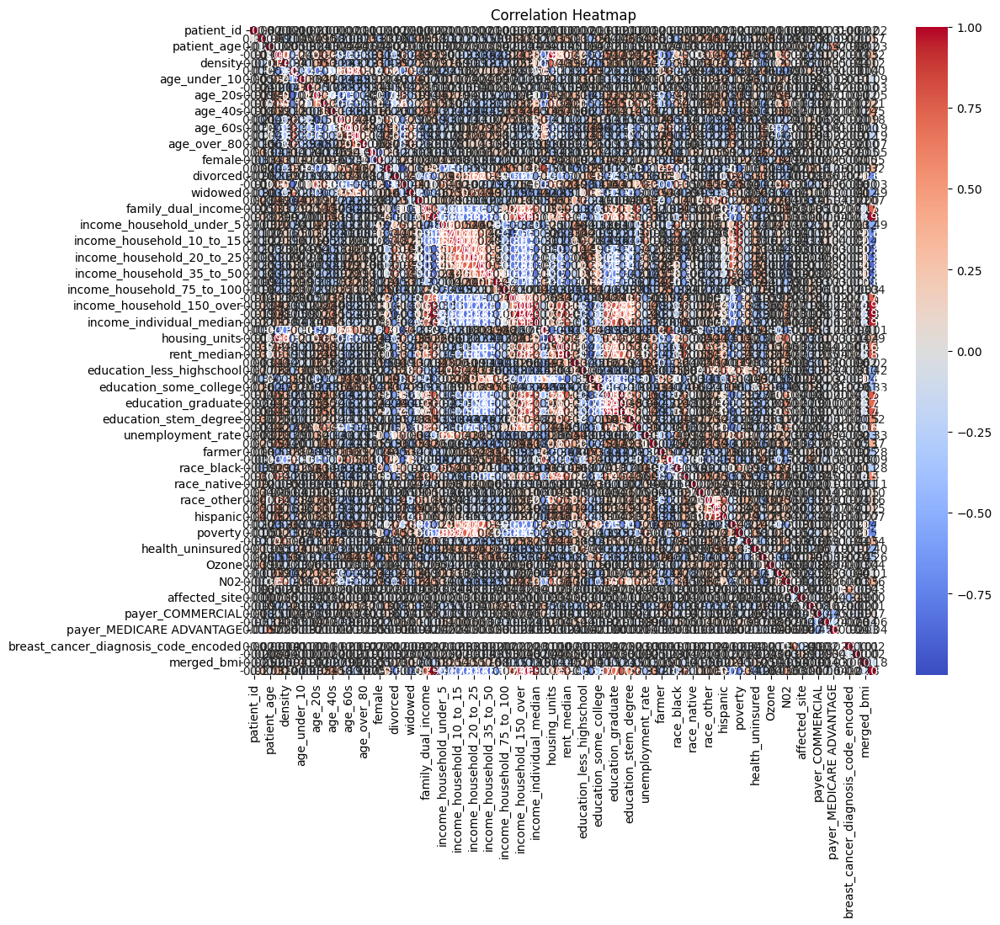

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv("train_final3.csv")

# Assuming your data is in a DataFrame called df
correlation_matrix = df.corr()

# Print correlation matrix
print(correlation_matrix)

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


In [ ]:
import pandas as pd

# Assuming your correlation matrix is stored in a variable called correlation_matrix
# Convert the correlation matrix to a DataFrame
correlation_df = pd.DataFrame(correlation_matrix)


# Save correlation matrix as CSV file
correlation_df.to_csv('correlation_matrix.csv', index=False)

# Save correlation matrix as HTML file
correlation_df.to_html('correlation_matrix.html', index=False)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Load the data (assuming 'DiagPeriodL90D' is the target column)
data = pd.read_csv('train_final3.csv')

# Separate features and target
X = data.drop('DiagPeriodL90D', axis=1)
y = data['DiagPeriodL90D']

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Build the ANN model
model = Sequential()
model.add(Dense(128, activation='relu', input_dim=X_train.shape[1]))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_scaled, y_train, epochs=20, batch_size=32, validation_data=(X_val_scaled, y_val))

# Evaluate the model on the validation set
val_predictions = model.predict(X_val_scaled)
val_predictions_binary = np.round(val_predictions).astype(int)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val, val_predictions_binary)
print(f'Validation Accuracy: {accuracy}')


Epoch 1/20
323/323 [==============================] - 4s 6ms/step - loss: 0.6132 - accuracy: 0.6920 - val_loss: 0.4961 - val_accuracy: 0.8079
Epoch 2/20
323/323 [==============================] - 3s 8ms/step - loss: 0.5257 - accuracy: 0.7859 - val_loss: 0.4865 - val_accuracy: 0.8114
Epoch 3/20
323/323 [==============================] - 2s 7ms/step - loss: 0.5028 - accuracy: 0.8009 - val_loss: 0.4830 - val_accuracy: 0.8114
Epoch 4/20
323/323 [==============================] - 1s 5ms/step - loss: 0.5009 - accuracy: 0.8038 - val_loss: 0.4805 - val_accuracy: 0.8110
Epoch 5/20
323/323 [==============================] - 2s 5ms/step - loss: 0.4958 - accuracy: 0.8038 - val_loss: 0.4799 - val_accuracy: 0.8122
Epoch 6/20
323/323 [==============================] - 1s 4ms/step - loss: 0.4856 - accuracy: 0.8068 - val_loss: 0.4800 - val_accuracy: 0.8114
Epoch 7/20
323/323 [==============================] - 1s 4ms/step - loss: 0.4811 - accuracy: 0.8076 - val_loss: 0.4833 - val_accuracy: 0.8114
Epoch 

In [ ]:
# Assuming 'test_final3.csv' is the test dataset
test_data = pd.read_csv('test_final3.csv')

# Standardize the test data using the same scaler
X_test_scaled = scaler.transform(test_data)

# Make predictions on the test set
test_predictions = model.predict(X_test_scaled)
test_predictions_binary = np.round(test_predictions).astype(int)

# Assuming 'patient_id' is a column in your test data
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_predictions_binary.flatten()
})

# Save the predictions to a CSV file
submission_df.to_csv('submission_ann.csv', index=False)

181/181 [==============================] - 1s 3ms/step


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.regularizers import l2

# Load the data (assuming 'DiagPeriodL90D' is the target column)
train_data = pd.read_csv('train_final3.csv')
test_data = pd.read_csv('test_final3.csv')

# Separate features and target
X_train = train_data.drop('DiagPeriodL90D', axis=1)
y_train = train_data['DiagPeriodL90D']
X_test = test_data

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Build the ANN model with learning rate scheduling and L2 regularization
model = Sequential()
model.add(Dense(128, activation='relu', input_dim=X_train.shape[1], kernel_regularizer=l2(0.01)))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

# Define a learning rate schedule
def lr_schedule(epoch):
    initial_lr = 0.001
    return initial_lr * 0.95 ** epoch

# Compile the model with a learning rate schedule
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Use learning rate scheduler during training
lr_scheduler = LearningRateScheduler(lr_schedule)

# Train the model
model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_data=(X_val_scaled, y_val), callbacks=[lr_scheduler])

# Evaluate the model on the validation set
val_predictions = model.predict(X_val_scaled)
val_predictions_binary = np.round(val_predictions).astype(int)
accuracy = accuracy_score(y_val, val_predictions_binary)
print(f'Validation Accuracy: {accuracy}')

# Make predictions on the test set
test_predictions = model.predict(X_test_scaled)
test_predictions_binary = np.round(test_predictions).astype(int)

# Assuming 'patient_id' is a column in your test data
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_predictions_binary.flatten()
})

# Save the predictions to a CSV file
submission_df.to_csv('submission_ann2.csv', index=False)


Epoch 1/50
323/323 [==============================] - 5s 7ms/step - loss: 1.5653 - accuracy: 0.7097 - val_loss: 0.9318 - val_accuracy: 0.8106 - lr: 0.0010
Epoch 2/50
323/323 [==============================] - 2s 6ms/step - loss: 0.7566 - accuracy: 0.8023 - val_loss: 0.6115 - val_accuracy: 0.8114 - lr: 9.5000e-04
Epoch 3/50
323/323 [==============================] - 2s 7ms/step - loss: 0.5805 - accuracy: 0.8066 - val_loss: 0.5396 - val_accuracy: 0.8118 - lr: 9.0250e-04
Epoch 4/50
323/323 [==============================] - 3s 10ms/step - loss: 0.5375 - accuracy: 0.8066 - val_loss: 0.5141 - val_accuracy: 0.8110 - lr: 8.5737e-04
Epoch 5/50
323/323 [==============================] - 2s 7ms/step - loss: 0.5253 - accuracy: 0.8067 - val_loss: 0.5091 - val_accuracy: 0.8118 - lr: 8.1451e-04
Epoch 6/50
323/323 [==============================] - 3s 10ms/step - loss: 0.5193 - accuracy: 0.8071 - val_loss: 0.5046 - val_accuracy: 0.8118 - lr: 7.7378e-04
Epoch 7/50
323/323 [============================

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Sample dataset (replace this with your actual data loading)
# Assuming 'DiagPeriodL90D' is the target column
data = pd.read_csv('train_final3.csv')

# Separate features and target
X = data.drop('DiagPeriodL90D', axis=1)
y = data['DiagPeriodL90D']

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Initialize SVM model
svm_model = SVC(kernel='linear', C=1.0)

# Train the SVM model
svm_model.fit(X_train_scaled, y_train)

# Predictions on the validation set
val_predictions = svm_model.predict(X_val_scaled)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val, val_predictions)
print(f'Validation Accuracy: {accuracy}')

# Make predictions on the test set (replace 'your_test_data.csv' with your actual test data)
test_data = pd.read_csv('test_final3.csv')
X_test_scaled = scaler.transform(test_data)

# Assuming 'patient_id' is a column in your test data
test_predictions = svm_model.predict(X_test_scaled)

# Create a submission DataFrame
submission_df = pd.DataFrame({
    'patient_id': test_data['patient_id'],
    'DiagPeriodL90D': test_predictions
})

# Save the predictions to a CSV file
submission_df.to_csv('submission_svm.csv', index=False)


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Load the data
data = pd.read_csv('train_final3.csv')  # Replace with the actual path to your data

# Separate features and target
X = data.drop(['DiagPeriodL90D'], axis=1)
y = data['DiagPeriodL90D']

# Define feature groups (you can modify this based on your domain knowledge)
age_features = ['age_under_10', 'age_10_to_19', 'age_20s', 'age_30s', 'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80']
income_features = ['income_household_under_5', 'income_household_5_to_10', 'income_household_10_to_15',
                    'income_household_15_to_20', 'income_household_20_to_25', 'income_household_25_to_35',
                    'income_household_35_to_50', 'income_household_50_to_75', 'income_household_75_to_100',
                    'income_household_100_to_150', 'income_household_150_over', 'income_household_six_figure']
education_features = ['education_less_highschool', 'education_highschool', 'education_some_college',
                      'education_bachelors', 'education_graduate', 'education_college_or_above', 'education_stem_degree']
race_features = ['race_white', 'race_black', 'race_asian', 'race_native', 'race_pacific', 'race_other', 'race_multiple']
health_features = ['disabled', 'poverty', 'health_uninsured']

# Create new features by summing or averaging the grouped features
X['total_age'] = X[age_features].sum(axis=1)
X['total_income'] = X[income_features].sum(axis=1)
X['average_education'] = X[education_features].mean(axis=1)
X['total_race'] = X[race_features].sum(axis=1)
X['total_health'] = X[health_features].sum(axis=1)

# Drop the original features used for grouping
X = X.drop(age_features + income_features + education_features + race_features + health_features, axis=1)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Initialize Logistic Regression model
logreg_model = LogisticRegression()

# Train the Logistic Regression model
logreg_model.fit(X_train_scaled, y_train)

# Predictions on the validation set
val_predictions = logreg_model.predict(X_val_scaled)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val, val_predictions)
print(f'Validation Accuracy: {accuracy}')


Validation Accuracy: 0.8113865220759101


In [ ]:
df = pd.read_csv("train_final3.csv")

In [ ]:
df = df.columns

In [ ]:
df.groupby("DiagPeriodL90D").mean()

,patient_id,patient_zip3,patient_age,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,...,affected_site,patient_race_filled_encoded,payer_COMMERCIAL,payer_MEDICAID,payer_MEDICARE ADVANTAGE,patient_F,breast_cancer_diagnosis_code_encoded,metastatic_cancer_diagnosis_code_encoded,merged_bmi,patient_income
DiagPeriodL90D,,,,,,,,,,,,,,,,,,,,,
0,546573.420347,560.834090,58.226579,20865.351826,1648.837014,40.503541,11.140103,12.982222,13.276139,12.805091,...,0.152685,0.445534,0.499381,0.206562,0.184688,1.0,23230.317582,3146.943046,29.088758,189792.541065
1,547866.863648,581.522457,59.758561,20673.644666,1542.195852,40.501000,11.112320,12.922414,13.299205,12.896382,...,0.111653,0.450632,0.448139,0.194541,0.199380,1.0,48660.923201,2635.025806,28.995284,192301.217370


In [ ]:
df

Index(['patient_id', 'patient_zip3', 'patient_age', 'population', 'density',
       'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s',
       'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male',
       'female', 'married', 'divorced', 'never_married', 'widowed',
       'family_size', 'family_dual_income', 'income_household_median',
       'income_household_under_5', 'income_household_5_to_10',
       'income_household_10_to_15', 'income_household_15_to_20',
       'income_household_20_to_25', 'income_household_25_to_35',
       'income_household_35_to_50', 'income_household_50_to_75',
       'income_household_75_to_100', 'income_household_100_to_150',
       'income_household_150_over', 'income_household_six_figure',
       'income_individual_median', 'home_ownership', 'housing_units',
       'home_value', 'rent_median', 'rent_burden', 'education_less_highschool',
       'education_highschool', 'education_some_college', 'education_bachelors',
       'educ